In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
import gc
import tensorflow as tf
from keras.constraints import max_norm
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize



files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
#files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
  
dates=list()
prices=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    #priceData = get_price_data(param)
    #stock = StockDataFrame.retype(priceData)
    #price = pd.DataFrame(stock)
    #string=['close_2_sma','close_4_sma','close_6_sma','close_8_sma','close_10_sma','close_12_sma','close_14_sma','close_16_sma','close_18_sma','pdi','mdi','dx','adx','adxr','cr','cr-ma1','cr-ma2','cr-ma3','boll','boll_ub','boll_lb','volume_-2_d','volume_-4_d','volume_-6_d','volume_-8_d','volume_-10_d','volume_-12_d','macd','macds','macdh','kdjk','kdjd','kdjj','tr','atr','wr_2','wr_10','wr_6','wr_8','wr_12','wr_14','close_-2_d','close_-4_d','close_-6_d','close_-8_d','close_-10_d','close_-12_d','close_-14_d','close_-16_d','rsi_2','rsi_4','rsi_6','rsi_8','rsi_10','rsi_12','rsi_14','rsi_16']
    #string=['close_2_sma','close_4_sma','close_6_sma','close_8_sma','close_10_sma','close_12_sma','close_14_sma','close_16_sma','close_18_sma','pdi','mdi','dx','adx','adxr','cr','cr-ma1','cr-ma2','cr-ma3','boll','boll_ub','boll_lb','volume_-2_d','volume_-4_d','volume_-6_d','volume_-8_d','volume_-10_d','volume_-12_d','macd','macds','macdh','kdjk','kdjd','kdjj','tr','atr','wr_2','wr_10','wr_6','wr_8','wr_12','wr_14','close_-2_d','close_-4_d','close_-6_d','close_-8_d','close_-10_d','close_-12_d','close_-14_d','close_-16_d','rsi_2','rsi_4','rsi_6','rsi_8','rsi_10','rsi_12','rsi_14','rsi_16']
    #stock.get(string)
    
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    dates.append(price['Unnamed: 0'])
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    
    price=price.drop(['Unnamed: 0'],axis=1)
   
    
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    print(file)
    prices.append(price)

/home/andrea/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


AAPL
AMZN
PEP
GOOGL
MSFT
FB
INTC
CSCO
CMCSA
NVDA
NFLX
BKNG
ADBE
AMGN
TXN
AVGO
PYPL
GILD
COST
QCOM


In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
            
def buildModel(l,n,d,le):
    opt=optimizers.SGD(lr=le, decay=1e-6, momentum=0.9, nesterov=True)
    model = Sequential()  
    model.add(Dense(n, input_dim=111,kernel_constraint=max_norm(1),activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])
    #o
    return model

           


Working on... AAPL
15.571701720841297
0.005338458253266777
working on d,u and l,le 0.5 64 0.01 0.001


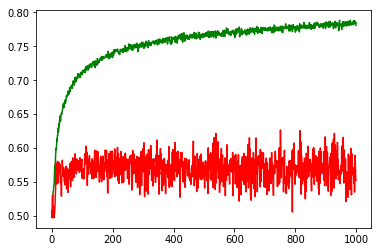

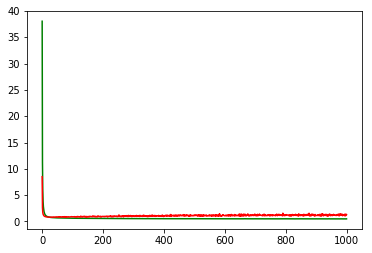

working on d,u and l,le 0.5 64 0.01 0.0001


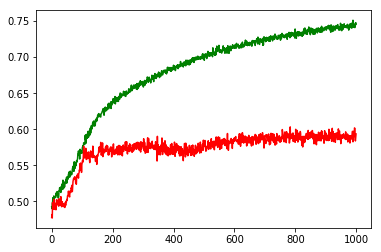

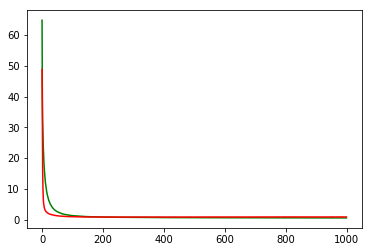

working on d,u and l,le 0.5 64 0.01 1e-05


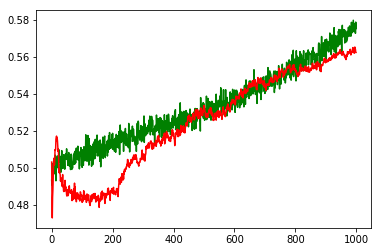

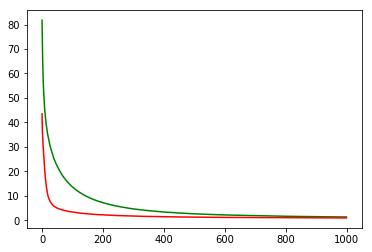

working on d,u and l,le 0.5 64 0.05 0.001


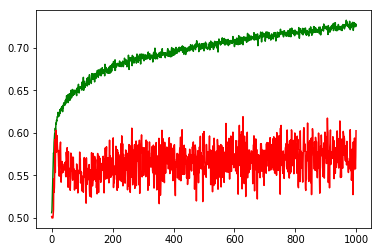

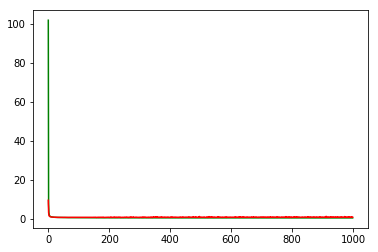

working on d,u and l,le 0.5 64 0.05 0.0001


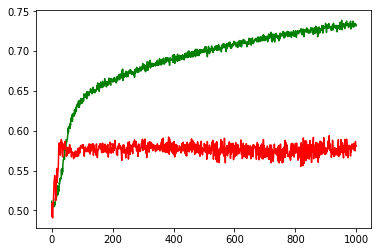

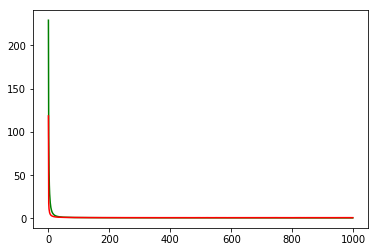

working on d,u and l,le 0.5 64 0.05 1e-05


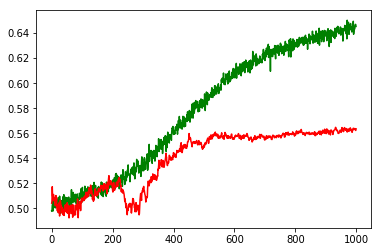

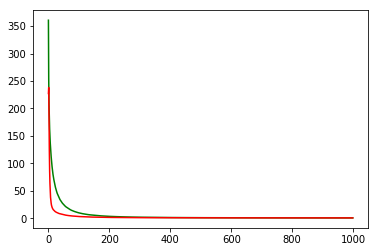

working on d,u and l,le 0.5 128 0.01 0.001


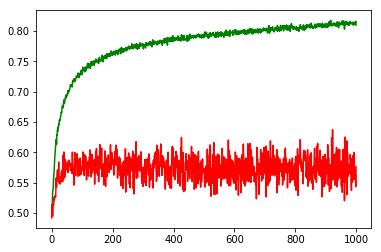

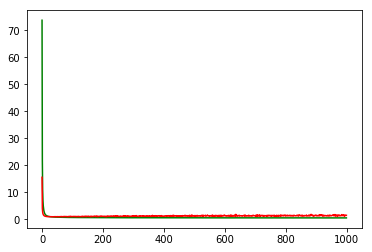

working on d,u and l,le 0.5 128 0.01 0.0001


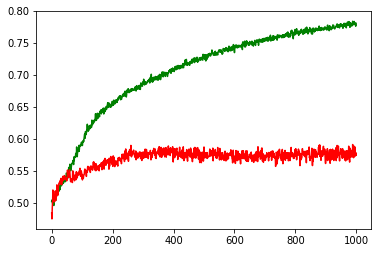

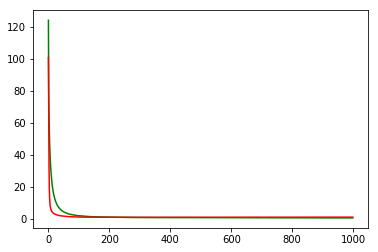

working on d,u and l,le 0.5 128 0.01 1e-05


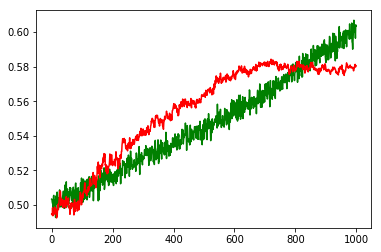

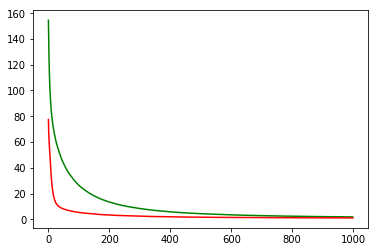

working on d,u and l,le 0.5 128 0.05 0.001


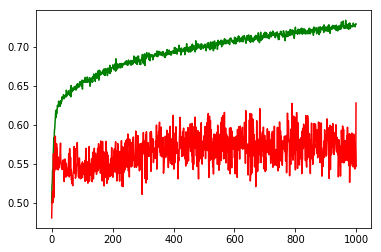

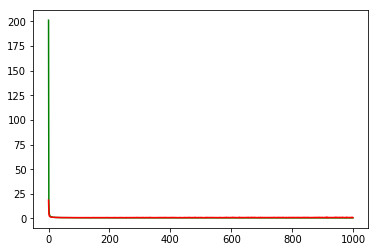

working on d,u and l,le 0.5 128 0.05 0.0001


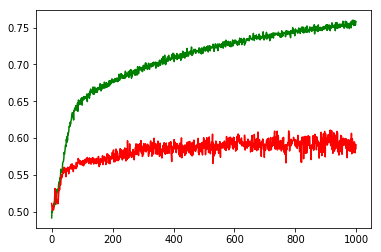

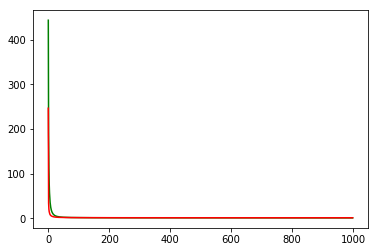

working on d,u and l,le 0.5 128 0.05 1e-05


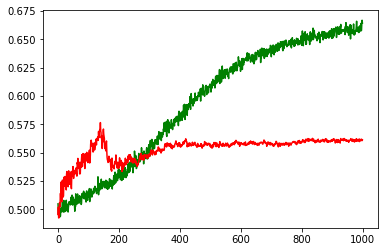

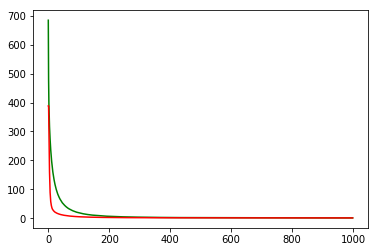

working on d,u and l,le 0.5 256 0.01 0.001


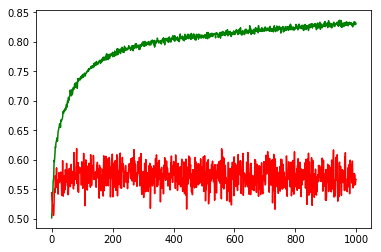

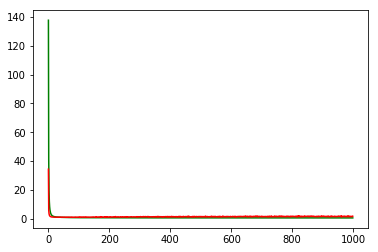

working on d,u and l,le 0.5 256 0.01 0.0001


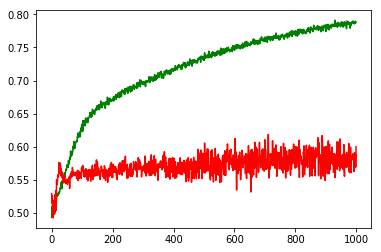

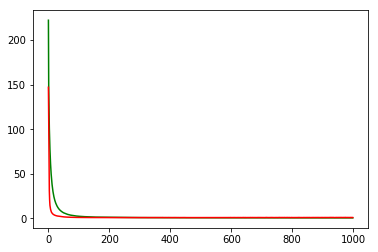

working on d,u and l,le 0.5 256 0.01 1e-05


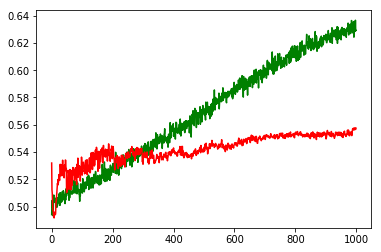

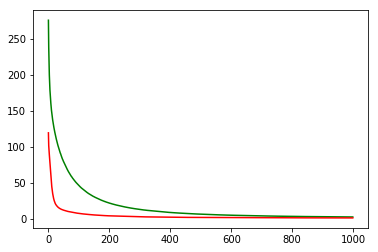

working on d,u and l,le 0.5 256 0.05 0.001


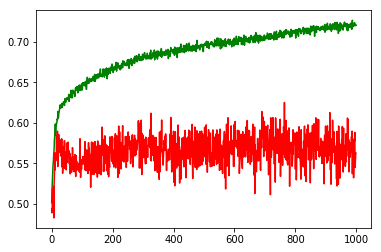

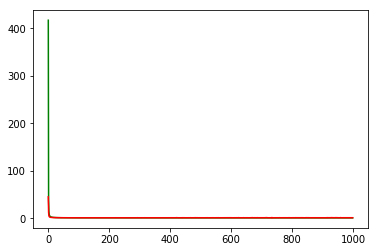

working on d,u and l,le 0.5 256 0.05 0.0001


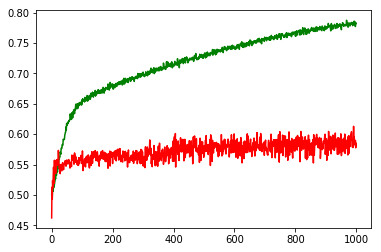

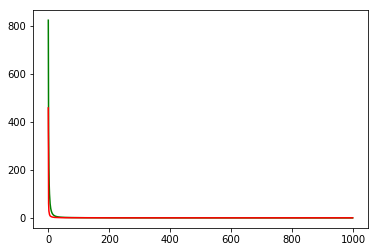

working on d,u and l,le 0.5 256 0.05 1e-05


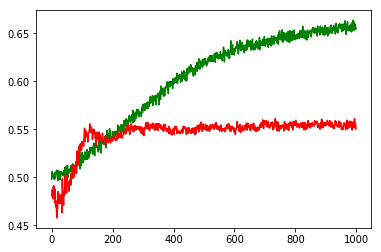

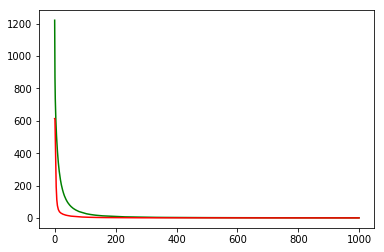

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: AAPL


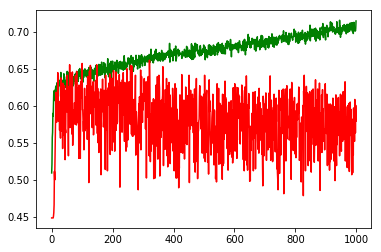

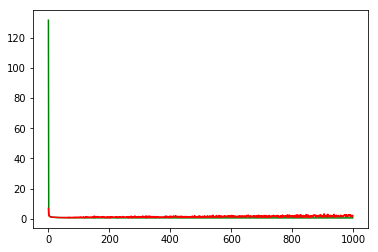

F1,score 0.4079601990049751
G-score: 0.504522250642224
Accuracy 0.5795053003533569
Window: 140
[[492  16]
 [460 164]]
Vol pos 3.695504435956709
Vol neg 2.4155408176127096
Real Percentage of gain: 36.83223046215099
Percentage of gain: 1.1258422975299924
Total gain: 1274.4534808039514
000000000000000000000000000000000000000000000000
Percentile:  0
[[372  12]
 [365  10]]
759/759 [==============================] - 0s 30us/step
[2.469739482366285, 0.5032938076416338]
Percentile:  1
[[64  2]
 [44 40]]
150/150 [==============================] - 0s 46us/step
[1.8934571266174316, 0.6933333333333334]
Percentile:  2
[[56  2]
 [21 58]]
137/137 [==============================] - 0s 37us/step
[0.42126382038976157, 0.8321167883211679]
Percentile:  3
[[ 0  0]
 [11 38]]
49/49 [==============================] - 0s 64us/step
[0.4841117974446744, 0.7755102052980539]
Percentile:  4
[[ 0  0]
 [17 18]]
35/35 [==============================] - 0s 70us/step
[0.7259339843477521, 0.5142857159887041]
000000000000

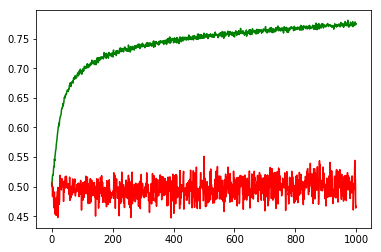

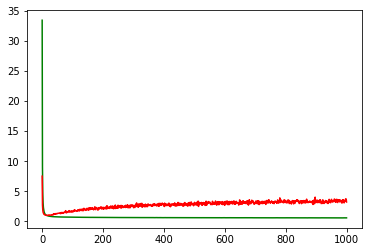

working on d,u and l,le 0.5 64 0.01 0.0001


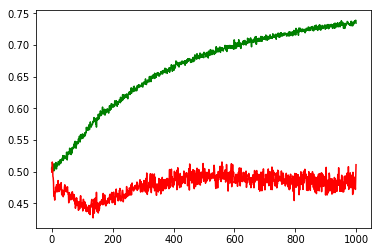

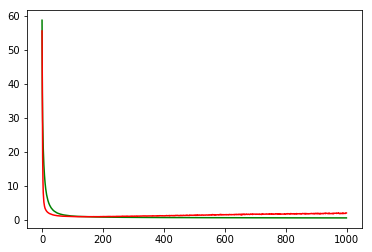

working on d,u and l,le 0.5 64 0.01 1e-05


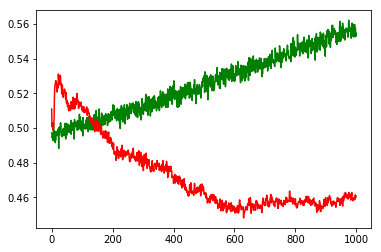

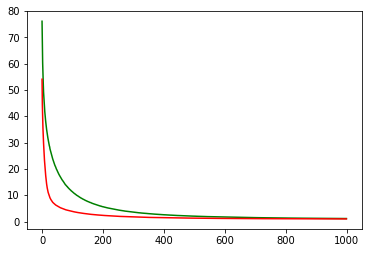

working on d,u and l,le 0.5 64 0.05 0.001


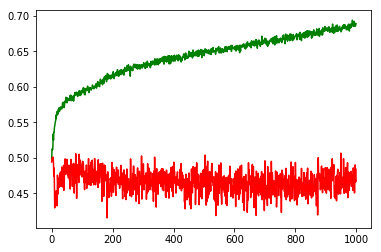

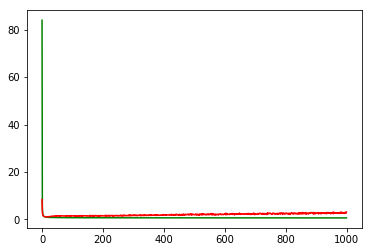

working on d,u and l,le 0.5 64 0.05 0.0001


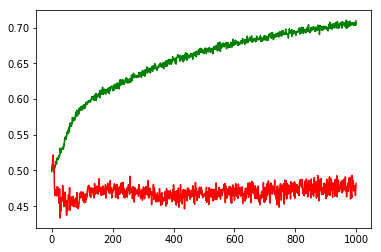

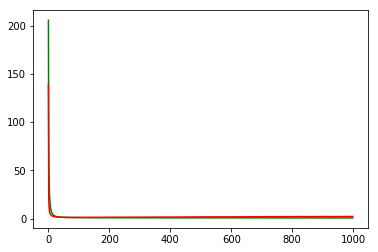

working on d,u and l,le 0.5 64 0.05 1e-05


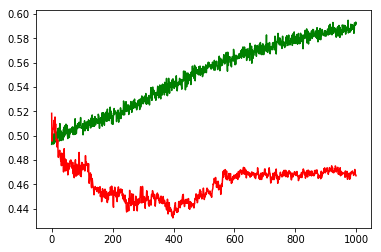

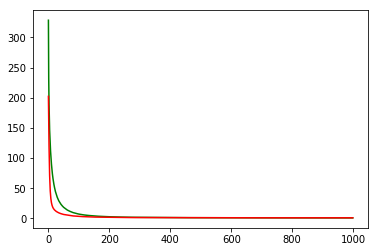

working on d,u and l,le 0.5 128 0.01 0.001


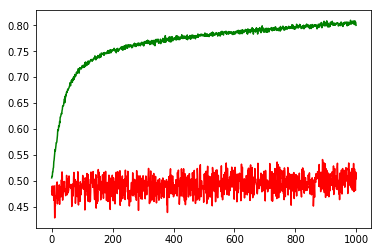

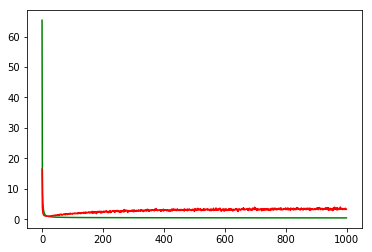

working on d,u and l,le 0.5 128 0.01 0.0001


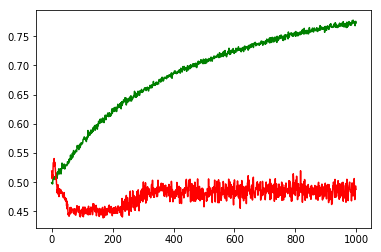

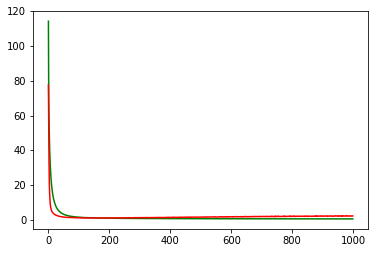

working on d,u and l,le 0.5 128 0.01 1e-05


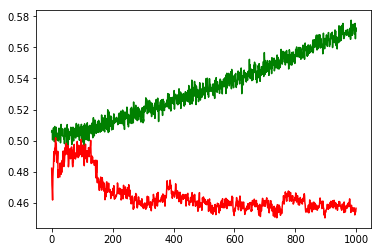

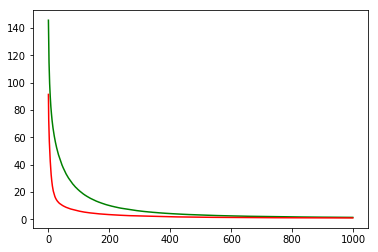

working on d,u and l,le 0.5 128 0.05 0.001


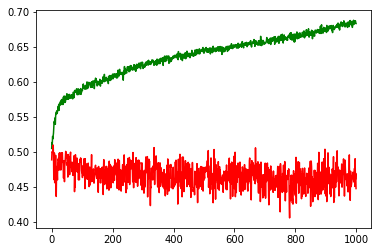

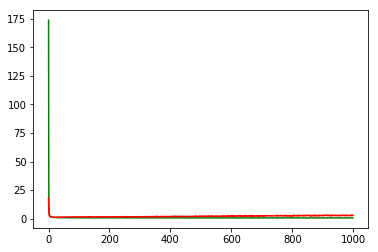

working on d,u and l,le 0.5 128 0.05 0.0001


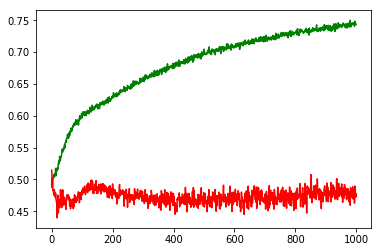

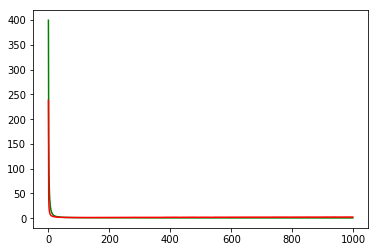

working on d,u and l,le 0.5 128 0.05 1e-05


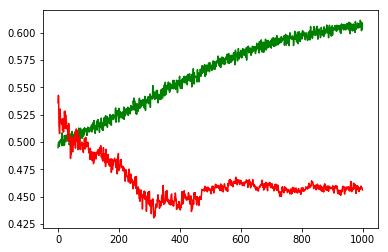

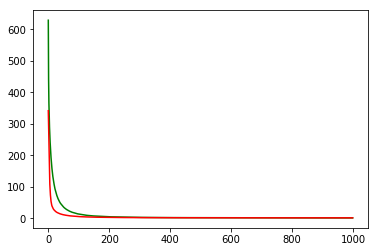

working on d,u and l,le 0.5 256 0.01 0.001


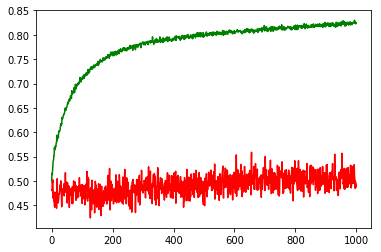

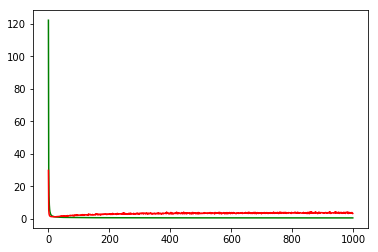

working on d,u and l,le 0.5 256 0.01 0.0001


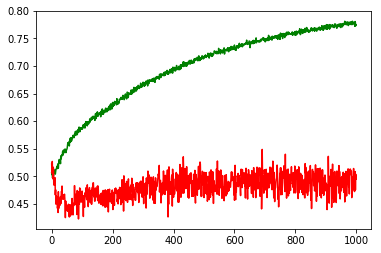

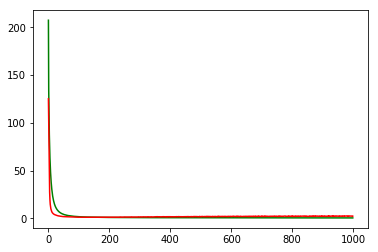

working on d,u and l,le 0.5 256 0.01 1e-05


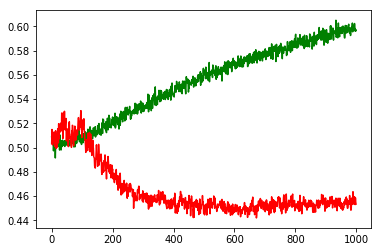

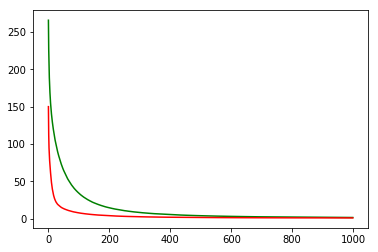

working on d,u and l,le 0.5 256 0.05 0.001


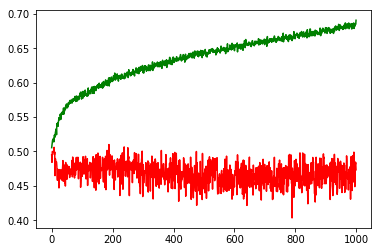

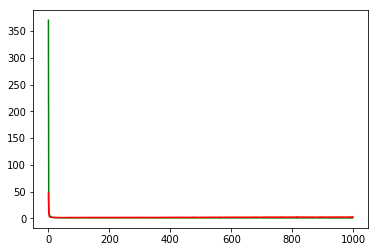

working on d,u and l,le 0.5 256 0.05 0.0001


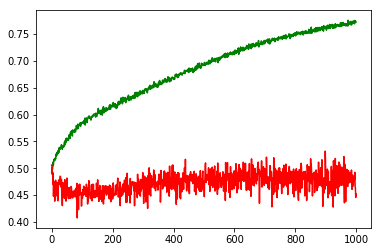

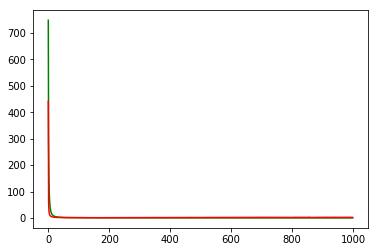

working on d,u and l,le 0.5 256 0.05 1e-05


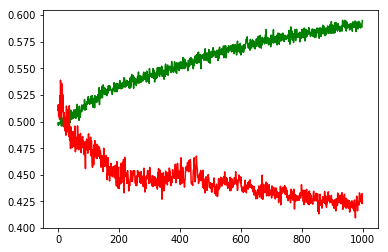

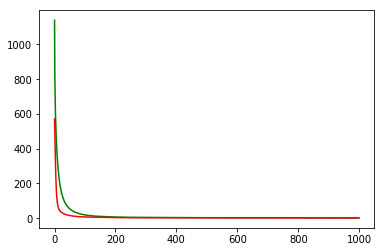

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: AMZN


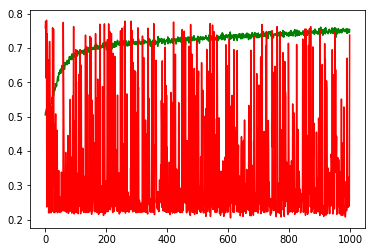

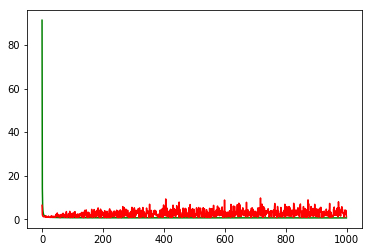

F1,score 0.8476141611082607
G-score: 0.1833523427438165
Accuracy 0.7376325088339223
Window: 140
[[  9 242]
 [ 55 826]]
Vol pos 2.522623908863927
Vol neg 1.8969052554236912
Real Percentage of gain: 212.9626435803078
Percentage of gain: 1.3630831298944726
Total gain: 1543.0101030405428
000000000000000000000000000000000000000000000000
Percentile:  0
[[  9 190]
 [ 24 408]]
631/631 [==============================] - 0s 31us/step
[1.25658107495818, 0.6608557844690967]
Percentile:  1
[[  0  36]
 [ 25 324]]
385/385 [==============================] - 0s 33us/step
[0.7193299200422094, 0.8415584415584415]
Percentile:  2
[[ 0 16]
 [ 6 53]]
75/75 [==============================] - 0s 72us/step
[1.6412567136685055, 0.7066666666666667]
Percentile:  3
[[ 0  0]
 [ 0 33]]
33/33 [==============================] - 0s 62us/step
[0.19575980125051556, 1.0]
Percentile:  4
[[0 0]
 [0 6]]
6/6 [==============================] - 0s 190us/step
[0.06275208294391632, 1.0]
00000000000000000000000000000000000000000000

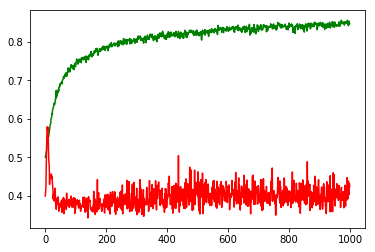

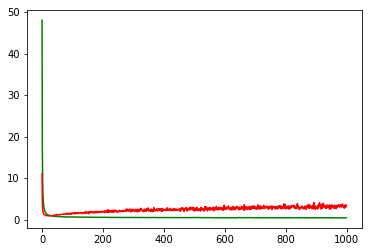

working on d,u and l,le 0.5 64 0.01 0.0001


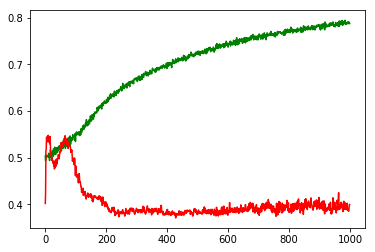

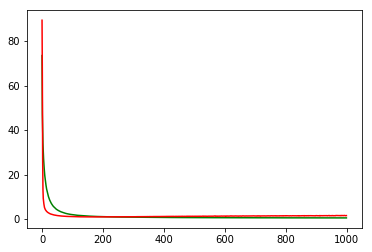

working on d,u and l,le 0.5 64 0.01 1e-05


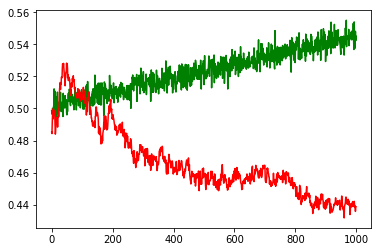

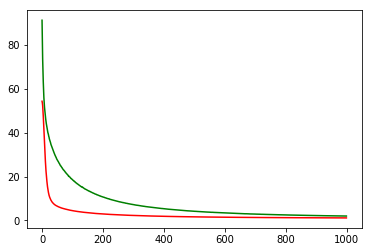

working on d,u and l,le 0.5 64 0.05 0.001


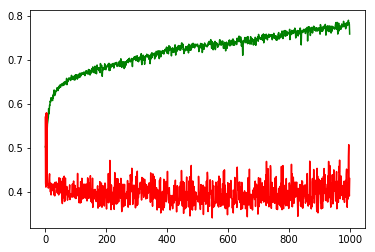

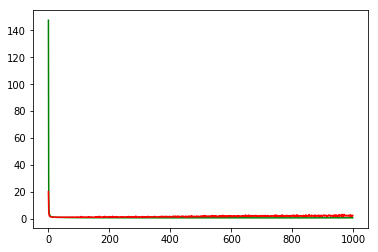

working on d,u and l,le 0.5 64 0.05 0.0001


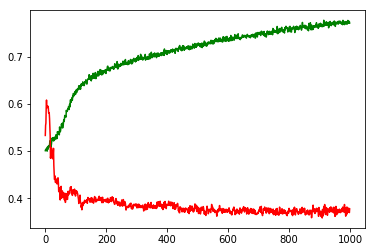

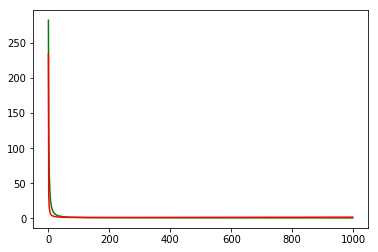

working on d,u and l,le 0.5 64 0.05 1e-05


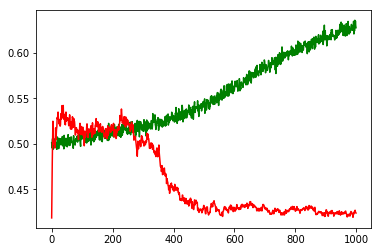

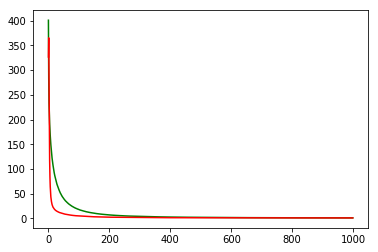

working on d,u and l,le 0.5 128 0.01 0.001


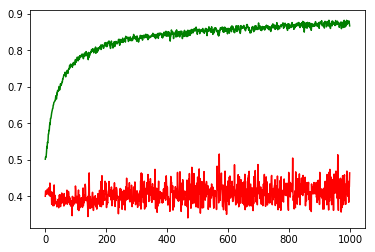

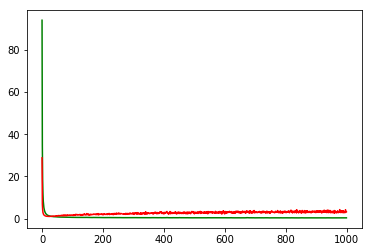

working on d,u and l,le 0.5 128 0.01 0.0001


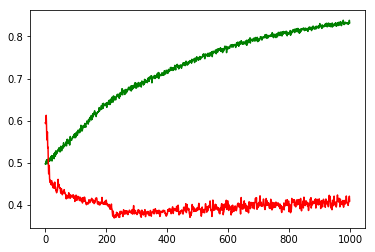

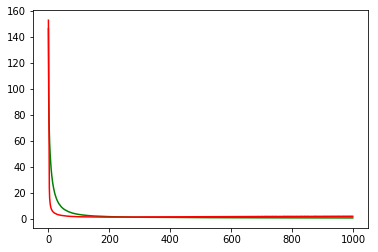

working on d,u and l,le 0.5 128 0.01 1e-05


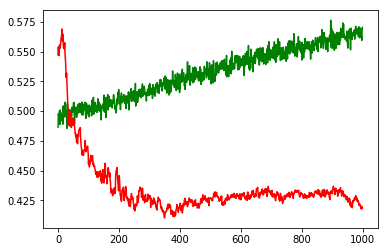

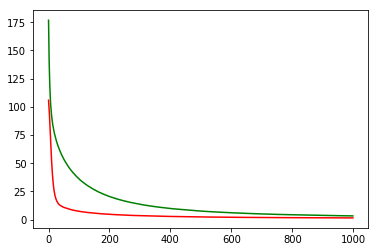

working on d,u and l,le 0.5 128 0.05 0.001


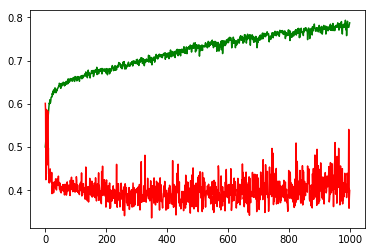

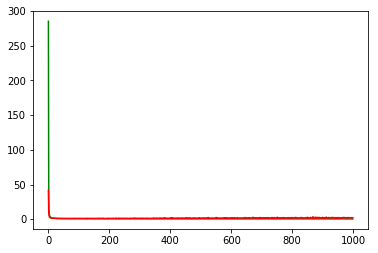

working on d,u and l,le 0.5 128 0.05 0.0001


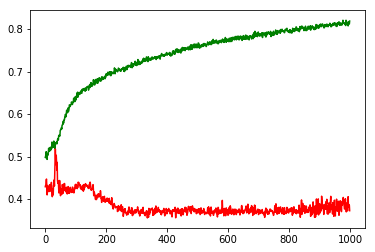

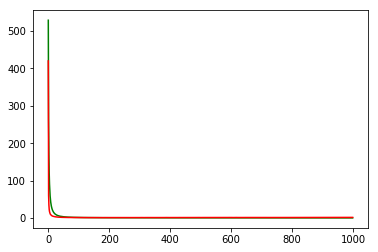

working on d,u and l,le 0.5 128 0.05 1e-05


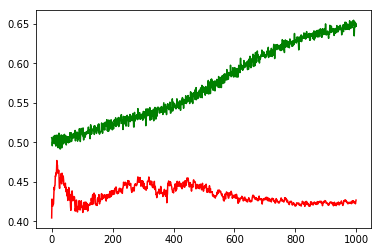

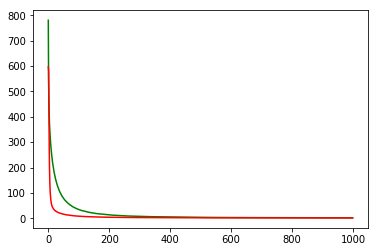

working on d,u and l,le 0.5 256 0.01 0.001


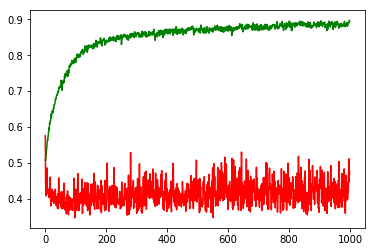

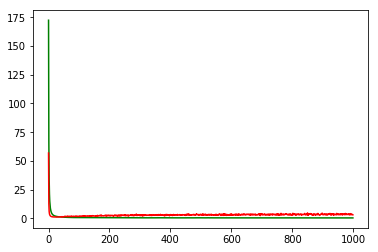

working on d,u and l,le 0.5 256 0.01 0.0001


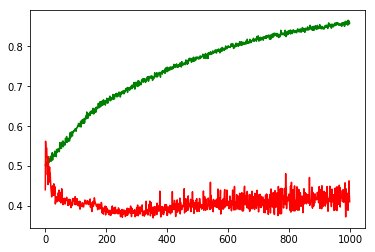

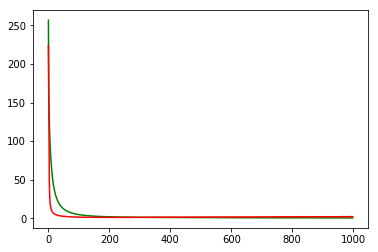

working on d,u and l,le 0.5 256 0.01 1e-05


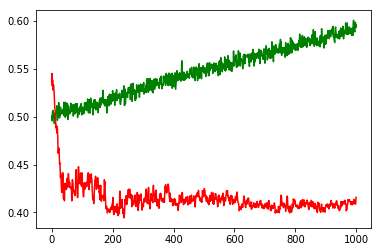

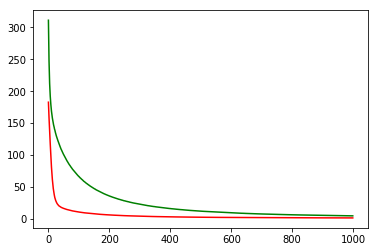

working on d,u and l,le 0.5 256 0.05 0.001


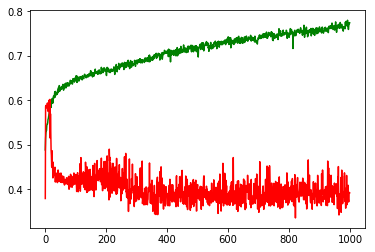

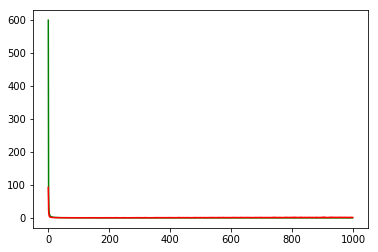

working on d,u and l,le 0.5 256 0.05 0.0001


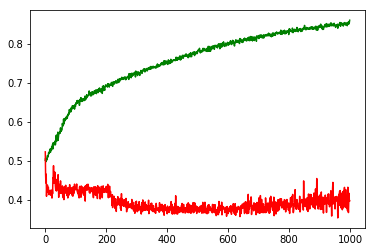

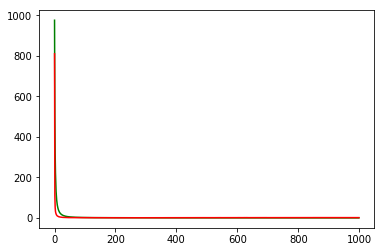

working on d,u and l,le 0.5 256 0.05 1e-05


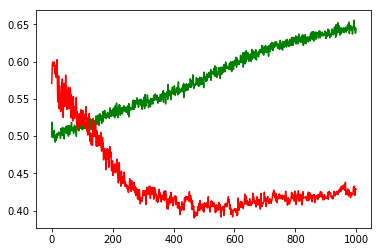

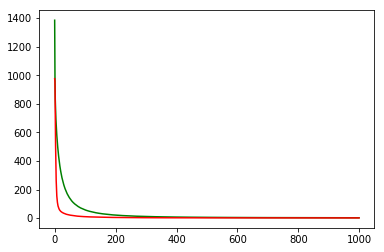

maxd,maxu,maxl,maxle: 0.5 64 0.01 1e-05
Chart for BEST MODEL FOR: PEP


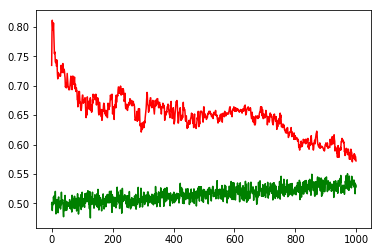

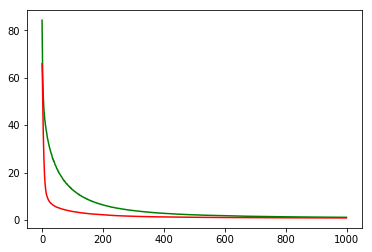

F1,score 0.7072402938090242
G-score: 0.4920587965083711
Accuracy 0.5720858893877158
Window: 140
[[ 36  53]
 [226 337]]
Vol pos 2.369762967594263
Vol neg 1.718127162610398
Real Percentage of gain: 29.996161715222964
Percentage of gain: 0.6204970989944159
Total gain: 404.5641085443591
000000000000000000000000000000000000000000000000
Percentile:  0
[[28 42]
 [50 59]]
179/179 [==============================] - 0s 36us/step
[0.7673705273500367, 0.48603352021904633]
Percentile:  1
[[ 8 11]
 [77 69]]
165/165 [==============================] - 0s 48us/step
[0.7714674747351444, 0.46666666702790693]
Percentile:  2
[[  0   0]
 [ 70 116]]
186/186 [==============================] - 0s 53us/step
[0.7403120571567167, 0.6236559178239556]
Percentile:  3
[[ 0  0]
 [22 54]]
76/76 [==============================] - 0s 65us/step
[0.7145291441365292, 0.7105263126523871]
Percentile:  4
[[ 0  0]
 [ 6 39]]
45/45 [==============================] - 0s 74us/step
[0.7019887487093608, 0.8666666706403097]
0000000000

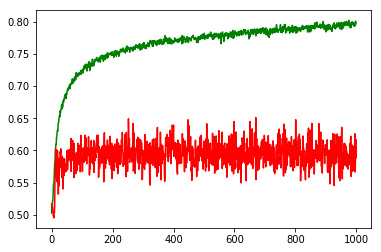

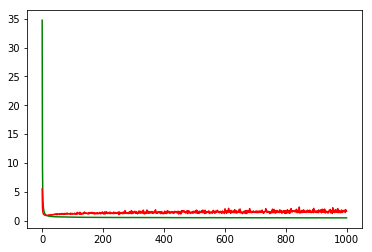

working on d,u and l,le 0.5 64 0.01 0.0001


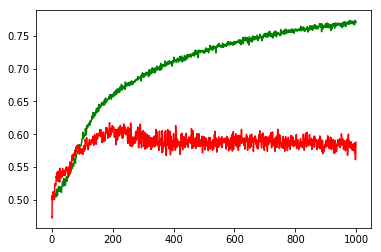

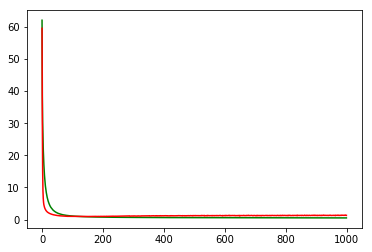

working on d,u and l,le 0.5 64 0.01 1e-05


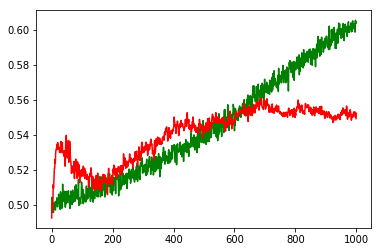

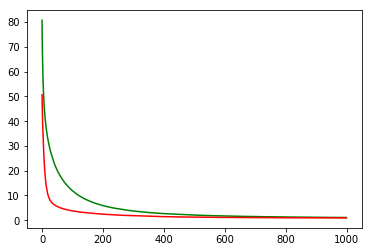

working on d,u and l,le 0.5 64 0.05 0.001


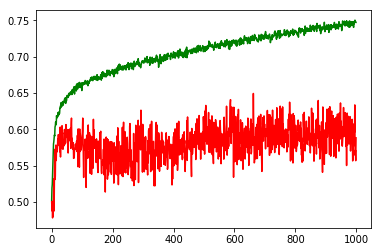

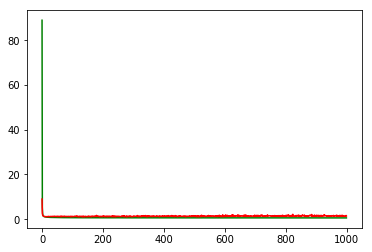

working on d,u and l,le 0.5 64 0.05 0.0001


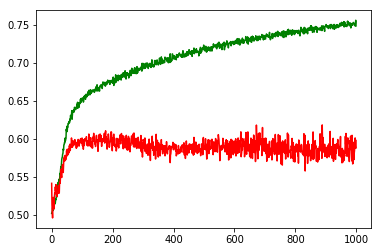

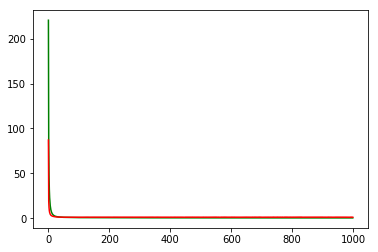

working on d,u and l,le 0.5 64 0.05 1e-05


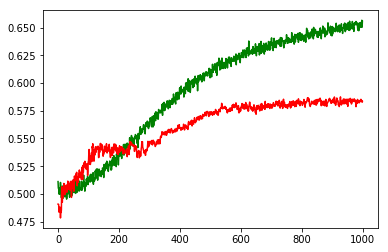

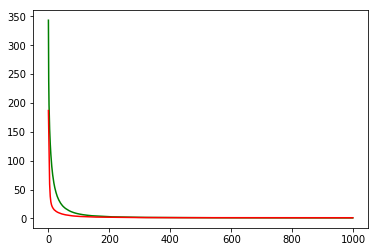

working on d,u and l,le 0.5 128 0.01 0.001


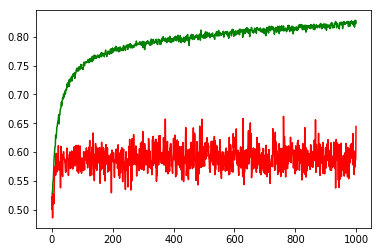

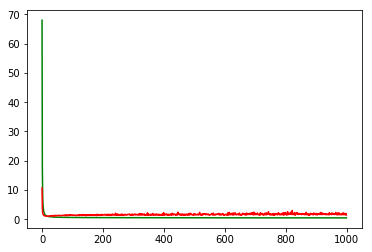

working on d,u and l,le 0.5 128 0.01 0.0001


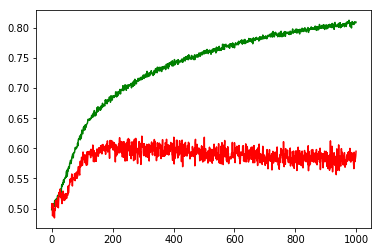

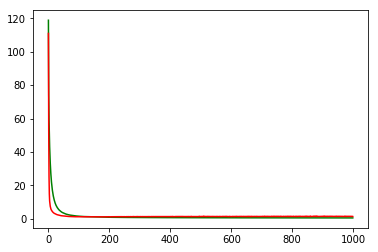

working on d,u and l,le 0.5 128 0.01 1e-05


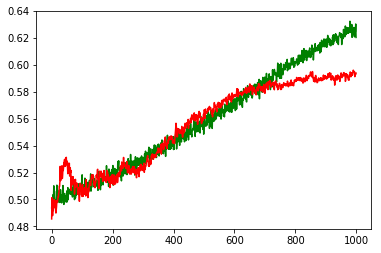

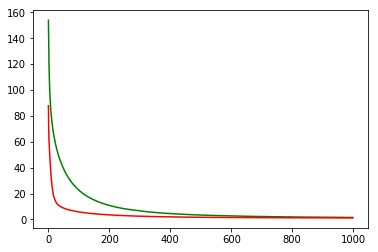

working on d,u and l,le 0.5 128 0.05 0.001


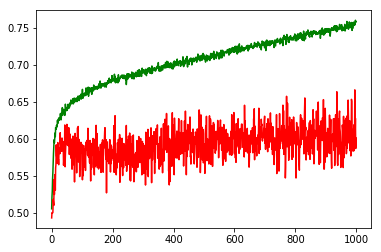

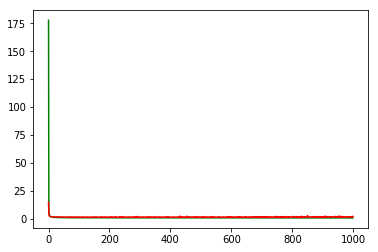

working on d,u and l,le 0.5 128 0.05 0.0001


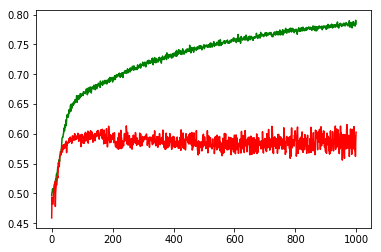

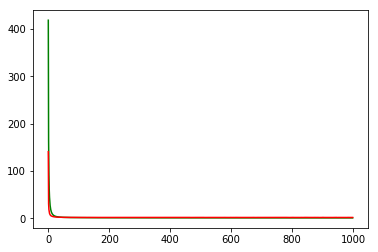

working on d,u and l,le 0.5 128 0.05 1e-05


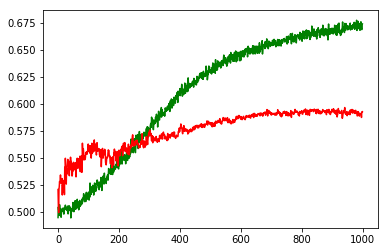

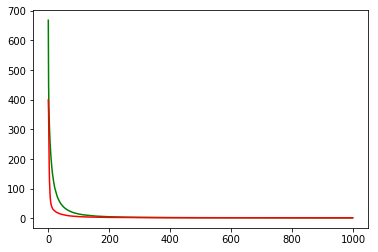

working on d,u and l,le 0.5 256 0.01 0.001


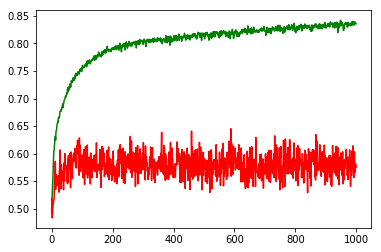

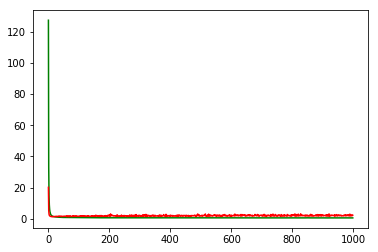

working on d,u and l,le 0.5 256 0.01 0.0001


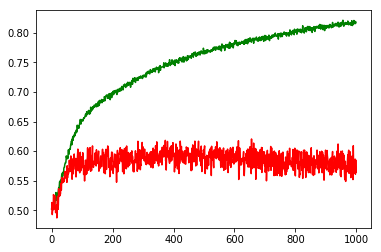

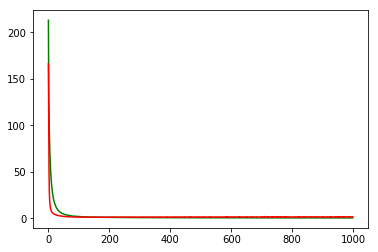

working on d,u and l,le 0.5 256 0.01 1e-05


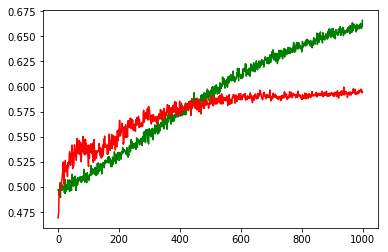

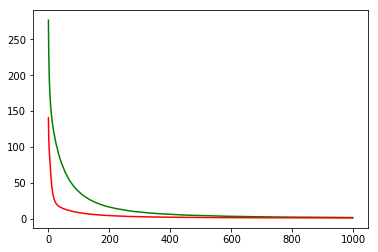

working on d,u and l,le 0.5 256 0.05 0.001


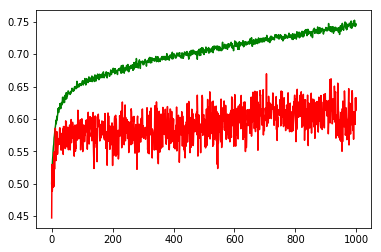

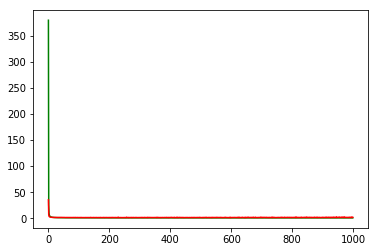

working on d,u and l,le 0.5 256 0.05 0.0001


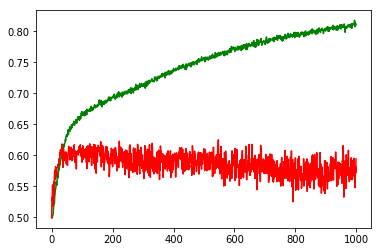

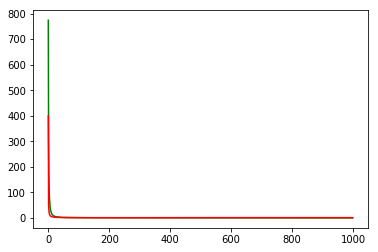

working on d,u and l,le 0.5 256 0.05 1e-05


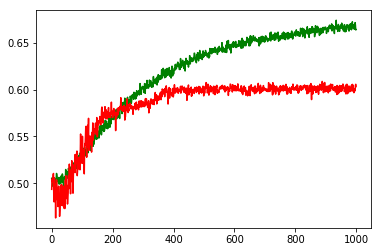

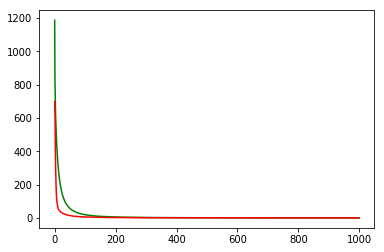

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: GOOGL


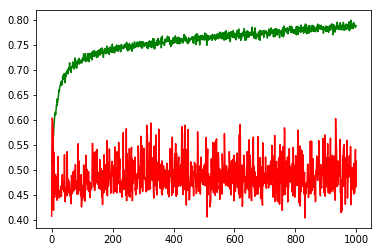

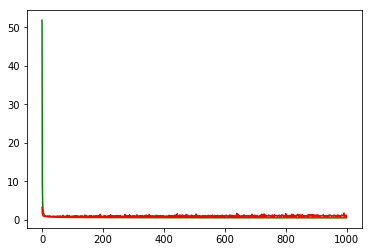

F1,score 0.6203059805285118
G-score: 0.45038993208733025
Accuracy 0.5176678455760538
Window: 140
[[140 314]
 [232 446]]
Vol pos 3.177947385123495
Vol neg 2.697147285119598
Real Percentage of gain: 31.804034889367607
Percentage of gain: 0.34420030919352246
Total gain: 389.6347500070674
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 75 156]
 [ 81 104]]
416/416 [==============================] - 0s 45us/step
[0.8834503361812005, 0.43028846153846156]
Percentile:  1
[[ 28  83]
 [ 76 173]]
360/360 [==============================] - 0s 28us/step
[0.715001916885376, 0.5583333333333333]
Percentile:  2
[[37 60]
 [19 90]]
206/206 [==============================] - 0s 41us/step
[0.7036638677988237, 0.616504854368932]
Percentile:  3
[[ 0 14]
 [46 41]]
101/101 [==============================] - 0s 34us/step
[0.8648682159952598, 0.40594059435447843]
Percentile:  4
[[ 0  0]
 [10 37]]
47/47 [==============================] - 0s 48us/step
[0.5041328465684931, 0.7872340488941112]
0000

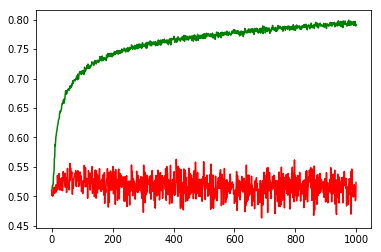

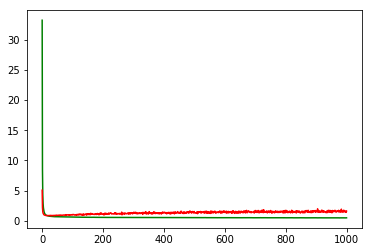

working on d,u and l,le 0.5 64 0.01 0.0001


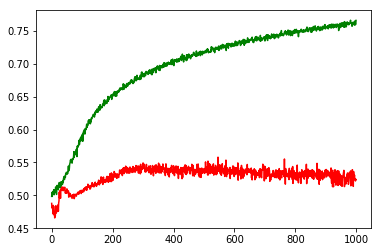

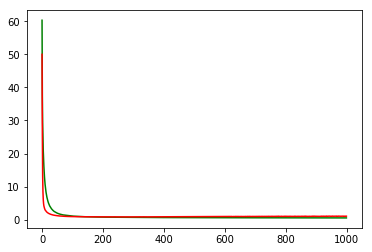

working on d,u and l,le 0.5 64 0.01 1e-05


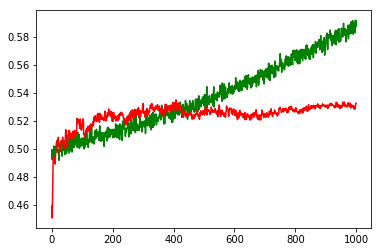

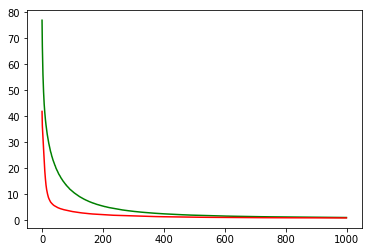

working on d,u and l,le 0.5 64 0.05 0.001


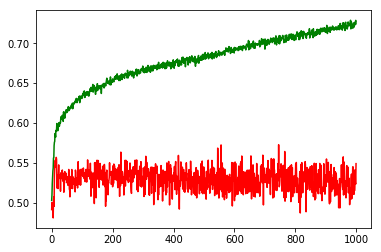

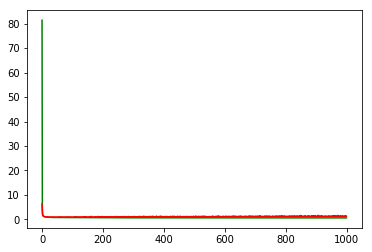

working on d,u and l,le 0.5 64 0.05 0.0001


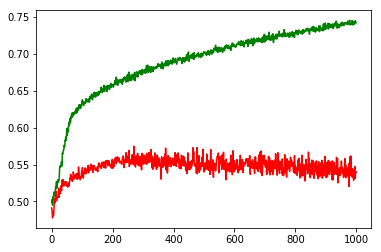

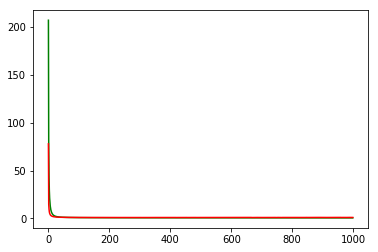

working on d,u and l,le 0.5 64 0.05 1e-05


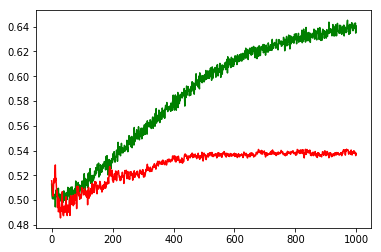

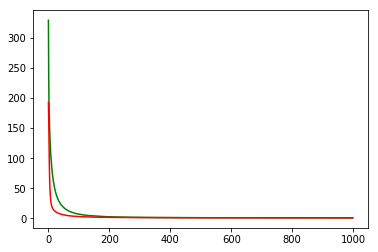

working on d,u and l,le 0.5 128 0.01 0.001


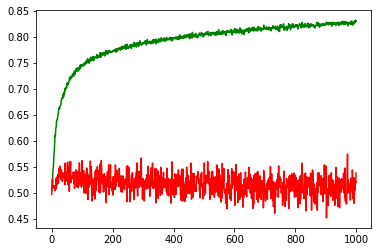

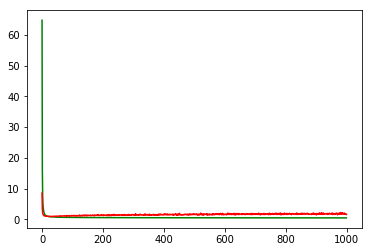

working on d,u and l,le 0.5 128 0.01 0.0001


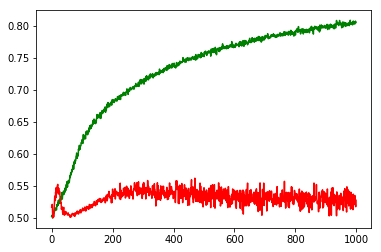

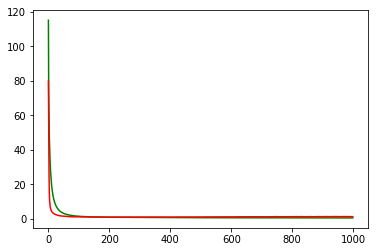

working on d,u and l,le 0.5 128 0.01 1e-05


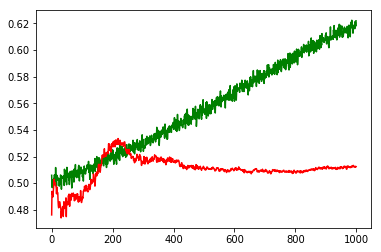

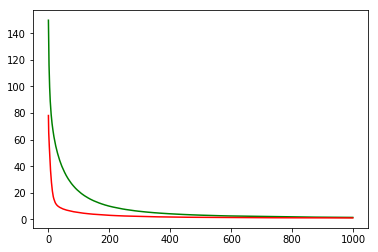

working on d,u and l,le 0.5 128 0.05 0.001


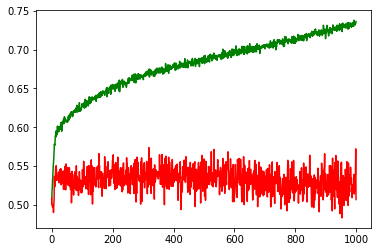

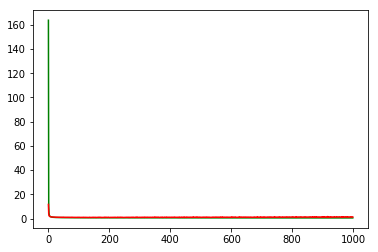

working on d,u and l,le 0.5 128 0.05 0.0001


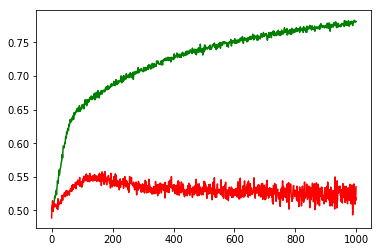

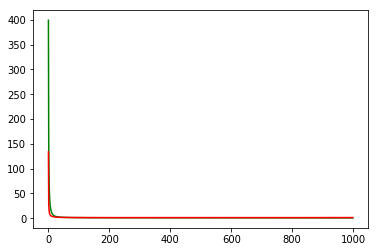

working on d,u and l,le 0.5 128 0.05 1e-05


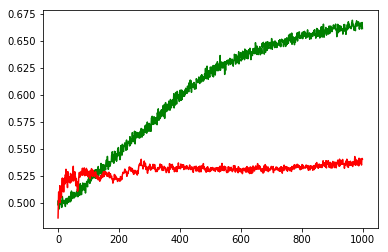

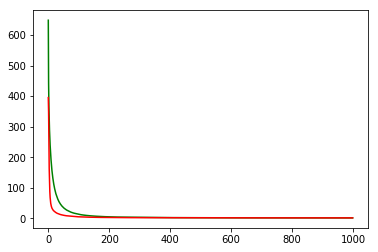

working on d,u and l,le 0.5 256 0.01 0.001


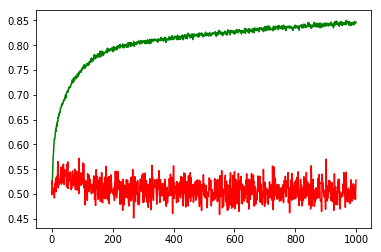

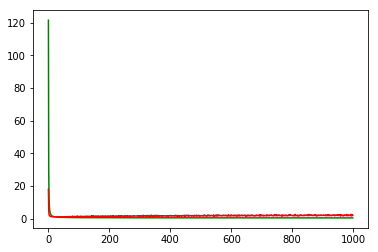

working on d,u and l,le 0.5 256 0.01 0.0001


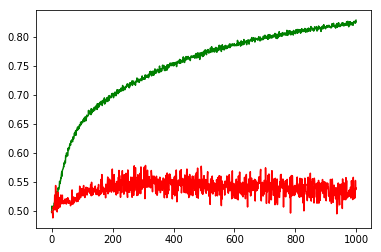

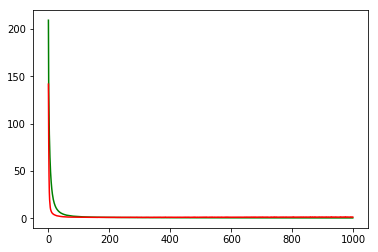

working on d,u and l,le 0.5 256 0.01 1e-05


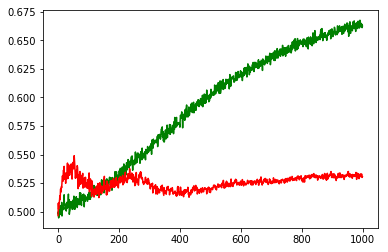

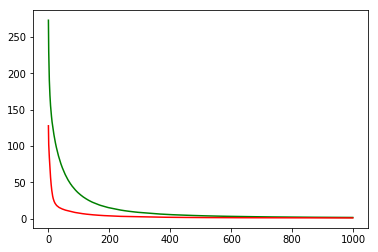

working on d,u and l,le 0.5 256 0.05 0.001


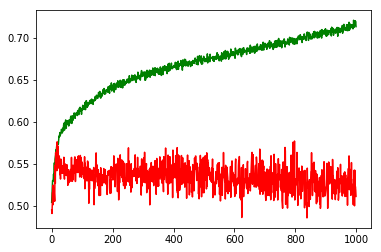

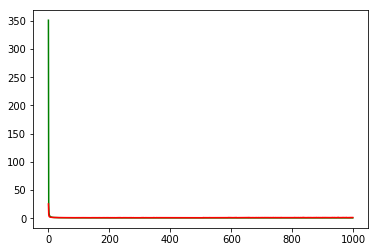

working on d,u and l,le 0.5 256 0.05 0.0001


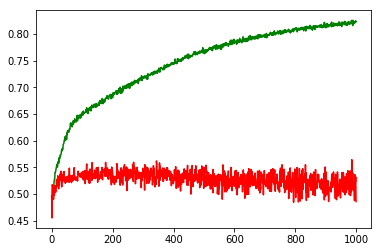

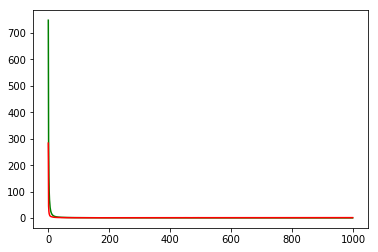

working on d,u and l,le 0.5 256 0.05 1e-05


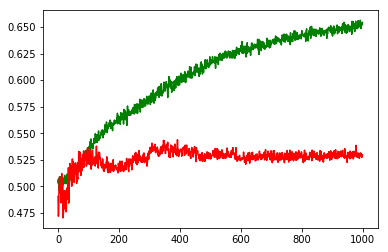

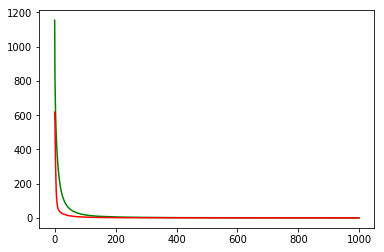

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: MSFT


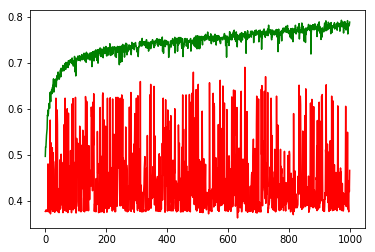

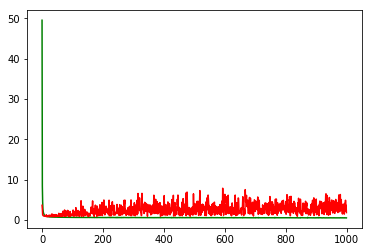

F1,score 0.40158259149357073
G-score: 0.46742509831230045
Accuracy 0.46554770044218946
Window: 140
[[324 103]
 [502 203]]
Vol pos 1.405650019762088
Vol neg 1.7078220034877616
Real Percentage of gain: -11.211242289309133
Percentage of gain: -0.25835225414794644
Total gain: -292.45475169547535
000000000000000000000000000000000000000000000000
Percentile:  0
[[241  59]
 [199  50]]
549/549 [==============================] - 0s 29us/step
[1.8228302642546987, 0.5300546448087432]
Percentile:  1
[[ 55  19]
 [164  72]]
310/310 [==============================] - 0s 30us/step
[1.4037461096240629, 0.4096774197393848]
Percentile:  2
[[19  4]
 [87 53]]
163/163 [==============================] - 0s 37us/step
[1.7404912220188444, 0.44171779141104295]
Percentile:  3
[[ 6 14]
 [40 21]]
81/81 [==============================] - 0s 43us/step
[2.5059228355501904, 0.3333333333793246]
Percentile:  4
[[ 3  7]
 [11  7]]
28/28 [==============================] - 0s 24us/step
[1.4687377214431763, 0.3571428656578064

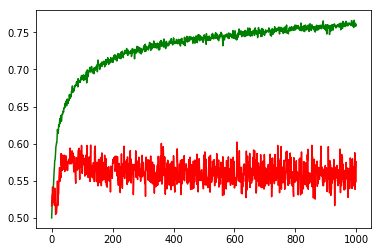

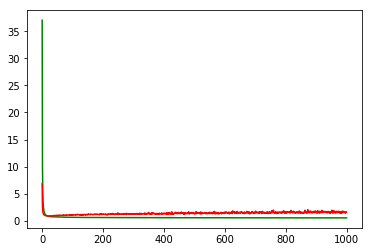

working on d,u and l,le 0.5 64 0.01 0.0001


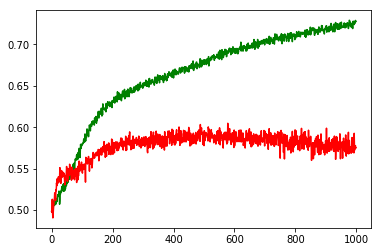

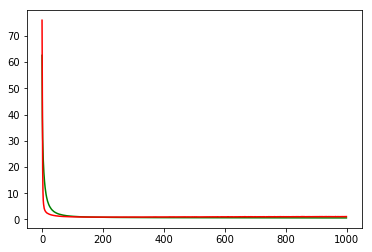

working on d,u and l,le 0.5 64 0.01 1e-05


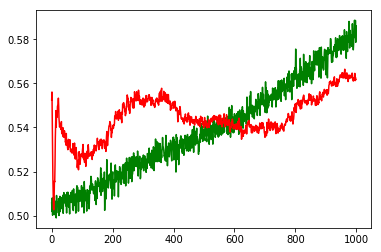

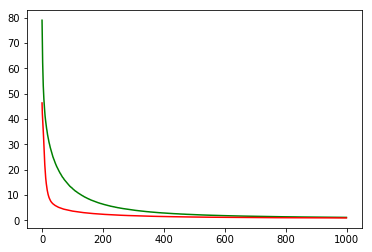

working on d,u and l,le 0.5 64 0.05 0.001


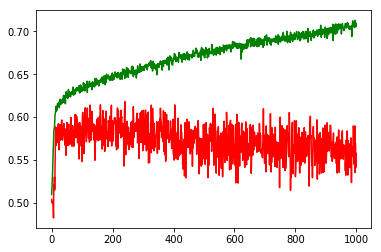

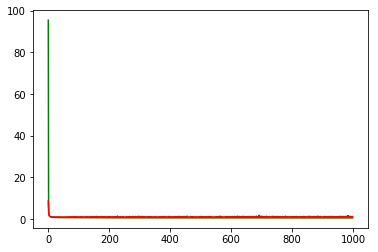

working on d,u and l,le 0.5 64 0.05 0.0001


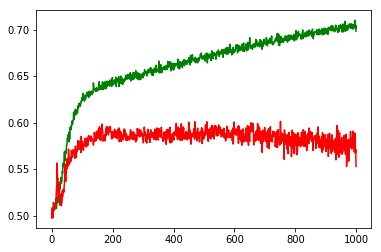

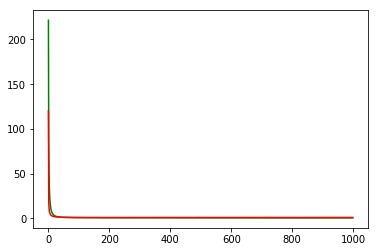

working on d,u and l,le 0.5 64 0.05 1e-05


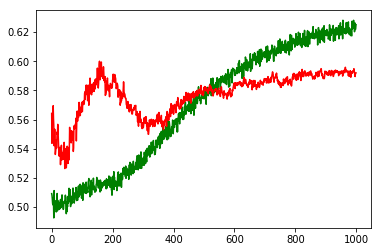

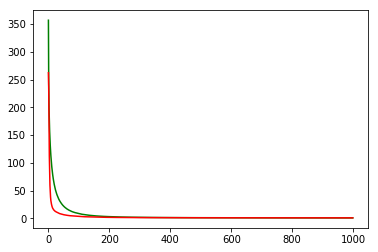

working on d,u and l,le 0.5 128 0.01 0.001


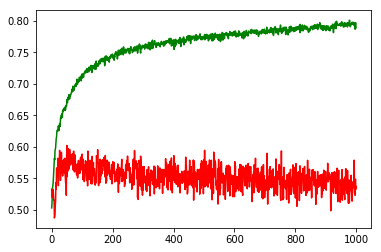

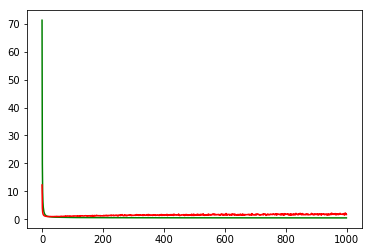

working on d,u and l,le 0.5 128 0.01 0.0001


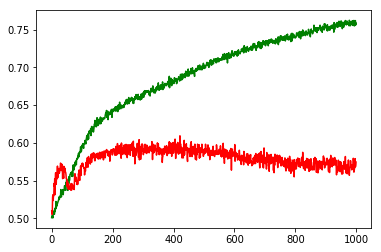

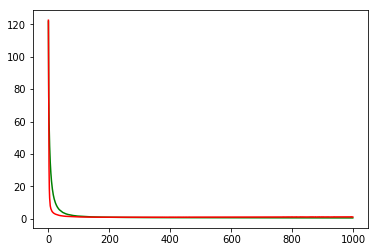

working on d,u and l,le 0.5 128 0.01 1e-05


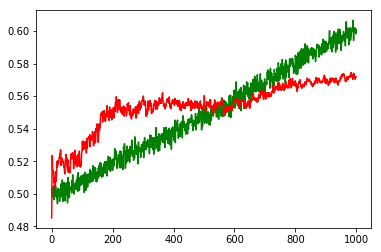

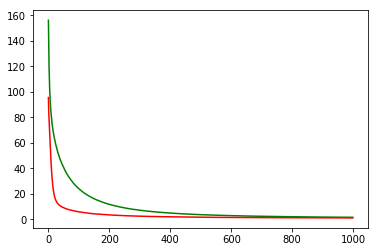

working on d,u and l,le 0.5 128 0.05 0.001


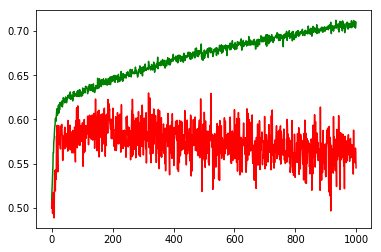

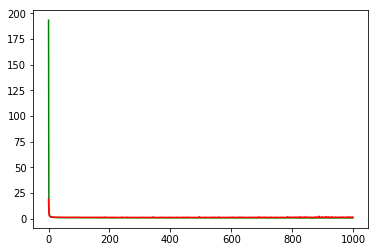

working on d,u and l,le 0.5 128 0.05 0.0001


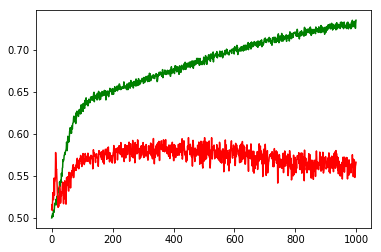

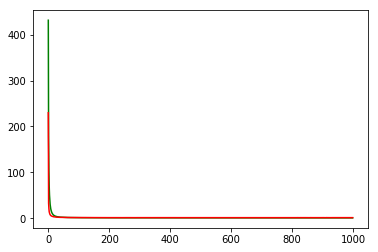

working on d,u and l,le 0.5 128 0.05 1e-05


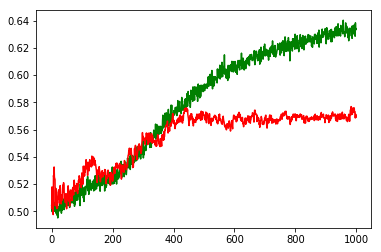

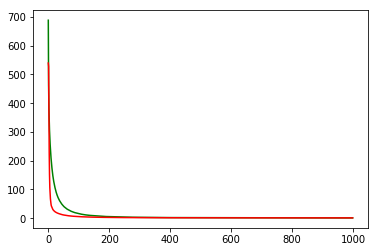

working on d,u and l,le 0.5 256 0.01 0.001


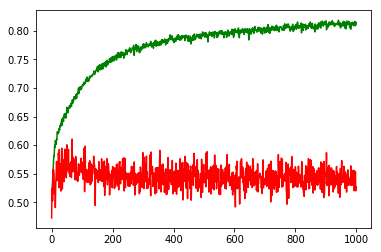

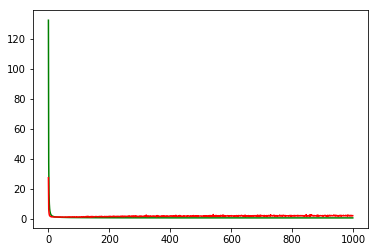

working on d,u and l,le 0.5 256 0.01 0.0001


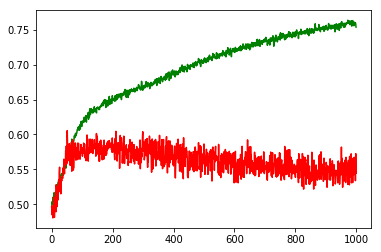

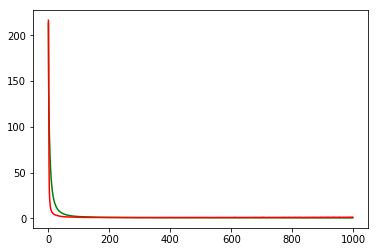

working on d,u and l,le 0.5 256 0.01 1e-05


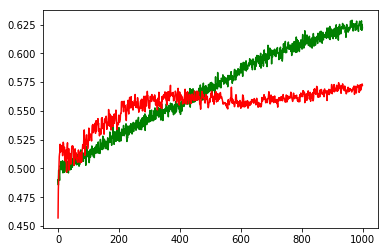

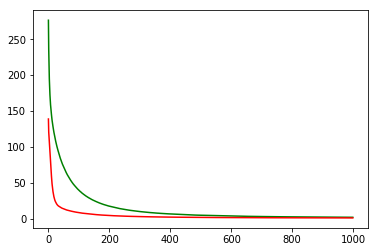

working on d,u and l,le 0.5 256 0.05 0.001


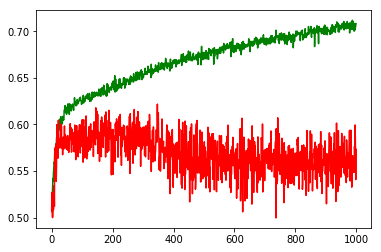

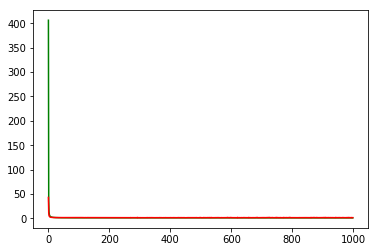

working on d,u and l,le 0.5 256 0.05 0.0001


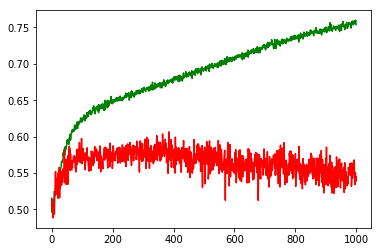

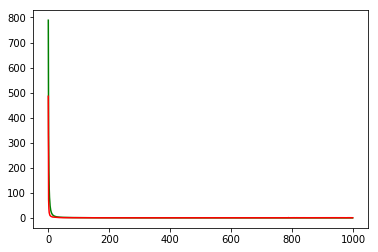

working on d,u and l,le 0.5 256 0.05 1e-05


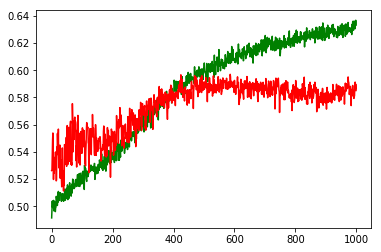

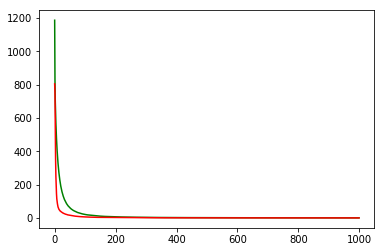

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.001
Chart for BEST MODEL FOR: FB


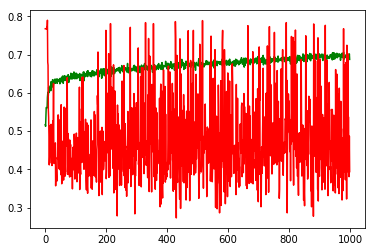

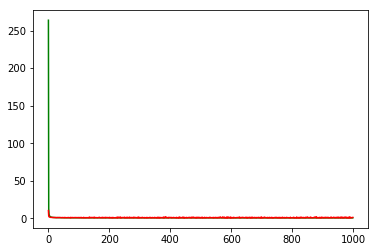

F1,score 0.4096385542168674
G-score: 0.46540643470153986
Accuracy 0.39399293286219084
Window: 140
[[208  55]
 [631 238]]
Vol pos 3.12334747596732
Vol neg 3.0513144314316882
Real Percentage of gain: -139.5287472163798
Percentage of gain: -0.6185412771031038
Total gain: -700.1887256807136
000000000000000000000000000000000000000000000000
Percentile:  0
[[204   8]
 [271  39]]
522/522 [==============================] - 0s 29us/step
[1.1086866636385864, 0.46551724137931033]
Percentile:  1
[[  3  34]
 [310 121]]
468/468 [==============================] - 0s 30us/step
[1.4841369156144624, 0.26495726495726496]
Percentile:  2
[[ 0 13]
 [50 42]]
105/105 [==============================] - 0s 43us/step
[0.9220925535474505, 0.4]
Percentile:  3
[[ 0  0]
 [ 0 14]]
14/14 [==============================] - 0s 67us/step
[0.150973841547966, 1.0]
Percentile:  4
[[ 0  0]
 [ 0 21]]
21/21 [==============================] - 0s 83us/step
[0.10363385081291199, 1.0]
00000000000000000000000000000000000000000000000

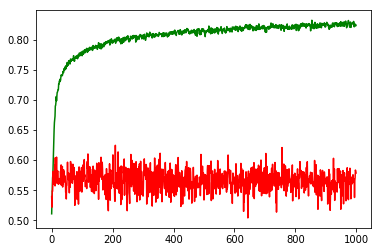

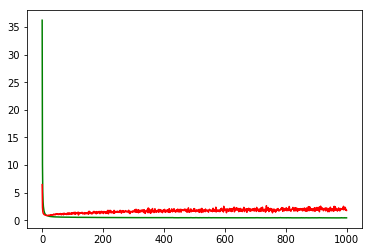

working on d,u and l,le 0.5 64 0.01 0.0001


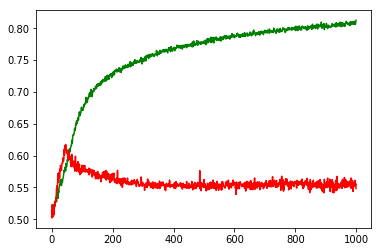

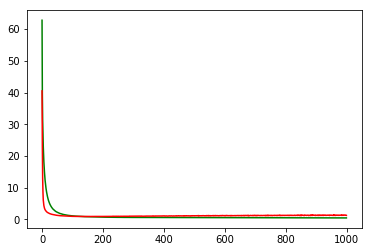

working on d,u and l,le 0.5 64 0.01 1e-05


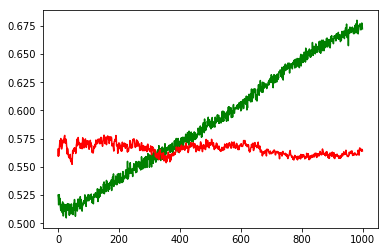

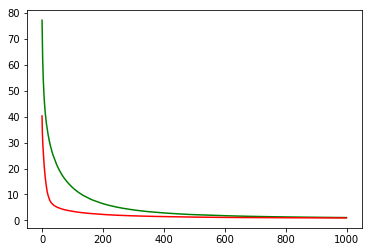

working on d,u and l,le 0.5 64 0.05 0.001


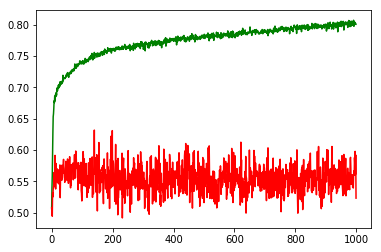

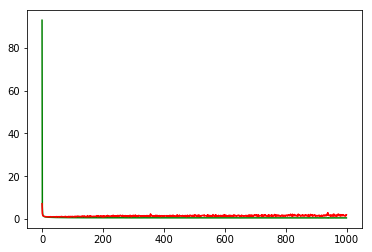

working on d,u and l,le 0.5 64 0.05 0.0001


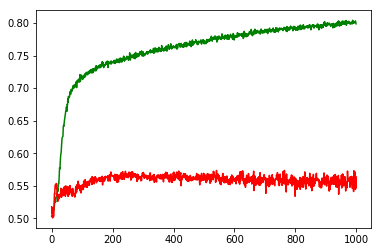

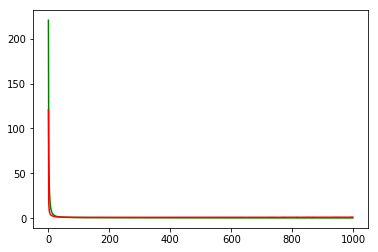

working on d,u and l,le 0.5 64 0.05 1e-05


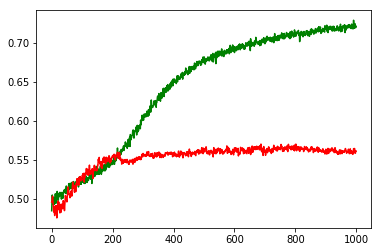

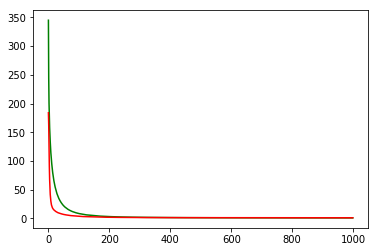

working on d,u and l,le 0.5 128 0.01 0.001


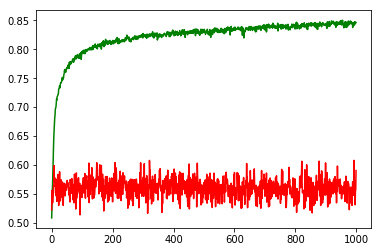

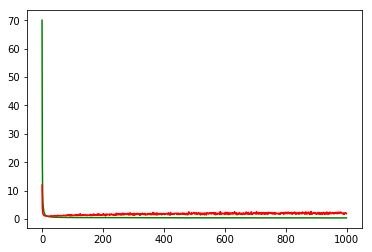

working on d,u and l,le 0.5 128 0.01 0.0001


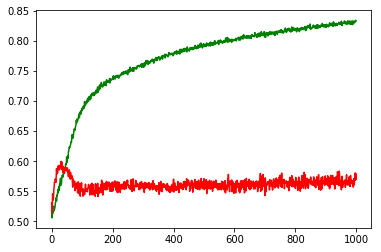

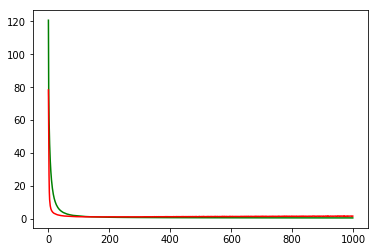

working on d,u and l,le 0.5 128 0.01 1e-05


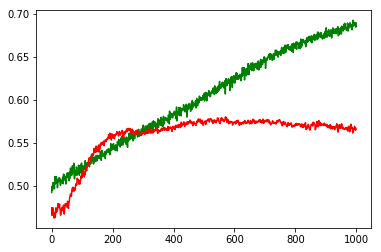

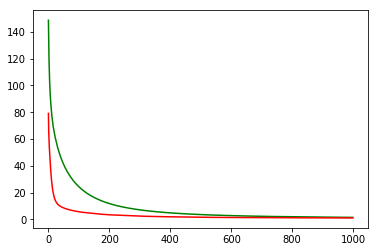

working on d,u and l,le 0.5 128 0.05 0.001


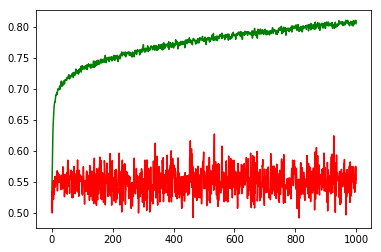

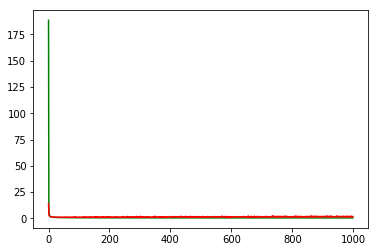

working on d,u and l,le 0.5 128 0.05 0.0001


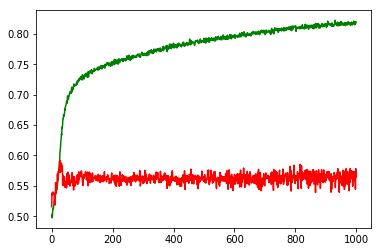

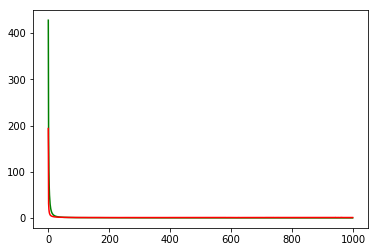

working on d,u and l,le 0.5 128 0.05 1e-05


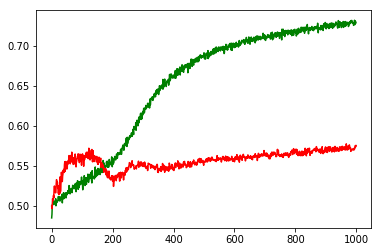

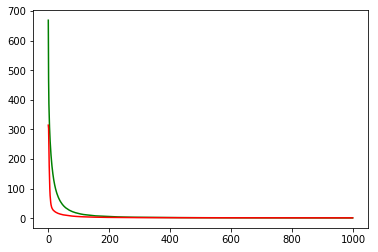

working on d,u and l,le 0.5 256 0.01 0.001


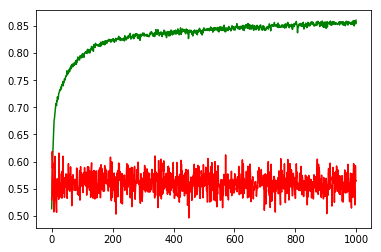

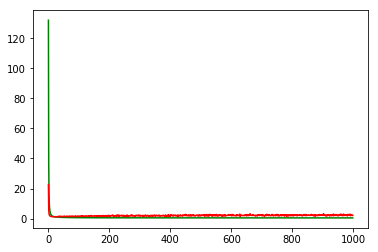

working on d,u and l,le 0.5 256 0.01 0.0001


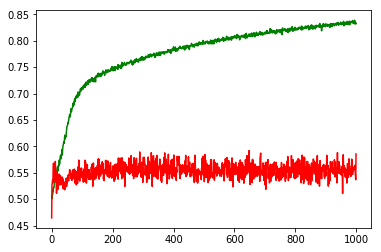

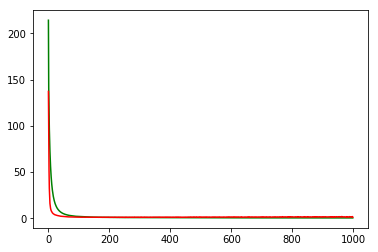

working on d,u and l,le 0.5 256 0.01 1e-05


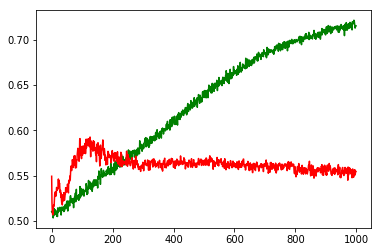

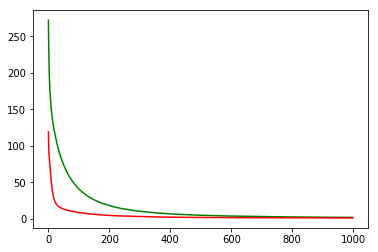

working on d,u and l,le 0.5 256 0.05 0.001


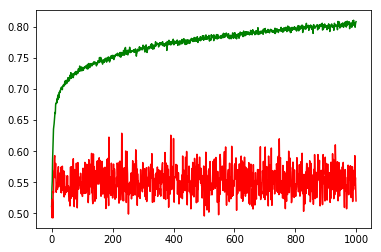

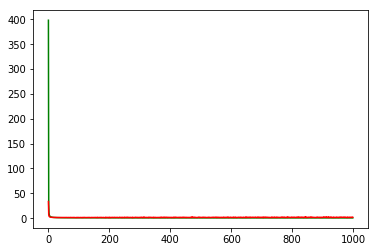

working on d,u and l,le 0.5 256 0.05 0.0001


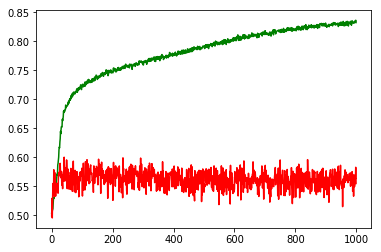

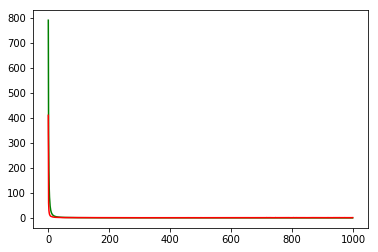

working on d,u and l,le 0.5 256 0.05 1e-05


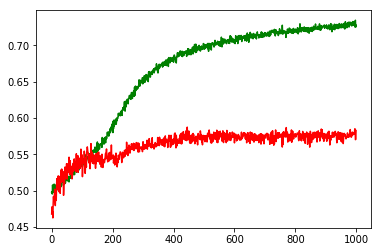

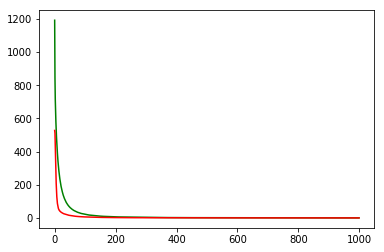

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.0001
Chart for BEST MODEL FOR: INTC


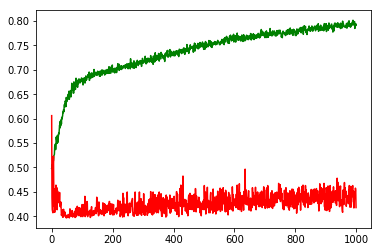

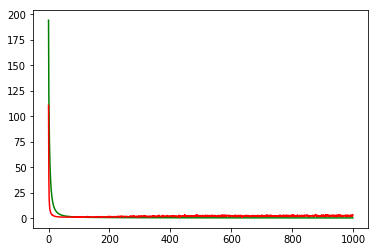

F1,score 0.08852005532503457
G-score: 0.2145165291661661
Accuracy 0.4178445229681979
Window: 140
[[441   8]
 [651  32]]
Vol pos 2.61491639422436
Vol neg 2.132879138576796
Real Percentage of gain: -92.72354801173901
Percentage of gain: -0.14903877902295612
Total gain: -168.71189785398633
000000000000000000000000000000000000000000000000
Percentile:  0
[[108   8]
 [223  15]]
354/354 [==============================] - 0s 38us/step
[4.019583548529673, 0.3474576271186441]
Percentile:  1
[[114   0]
 [217  10]]
341/341 [==============================] - 0s 30us/step
[3.623665413155584, 0.36363636363636365]
Percentile:  2
[[127   0]
 [144   7]]
278/278 [==============================] - 0s 35us/step
[2.8023391104162596, 0.48201438848920863]
Percentile:  3
[[63  0]
 [51  0]]
114/114 [==============================] - 0s 35us/step
[2.1593727971378125, 0.5526315789473685]
Percentile:  4
[[29  0]
 [14  0]]
43/43 [==============================] - 0s 101us/step
[1.1789279458394577, 0.674418604651162

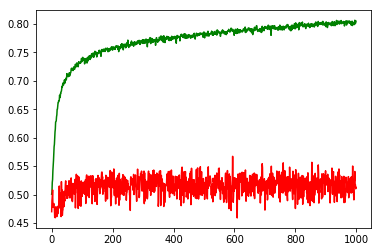

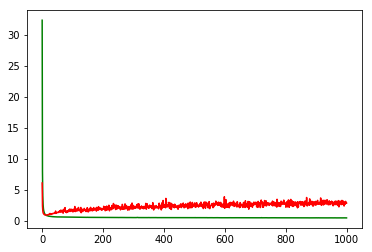

working on d,u and l,le 0.5 64 0.01 0.0001


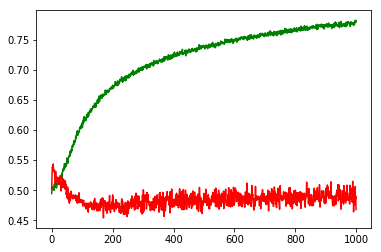

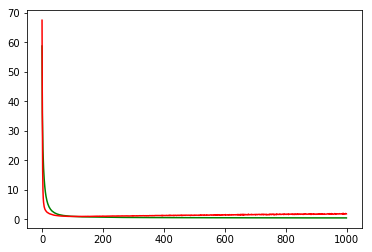

working on d,u and l,le 0.5 64 0.01 1e-05


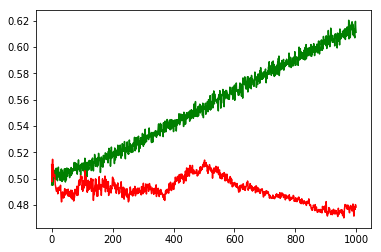

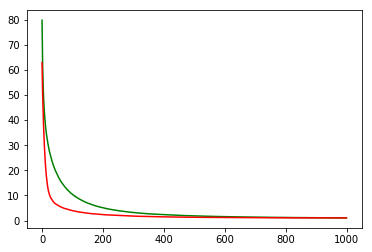

working on d,u and l,le 0.5 64 0.05 0.001


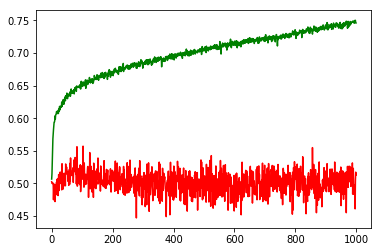

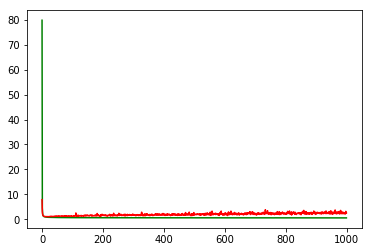

working on d,u and l,le 0.5 64 0.05 0.0001


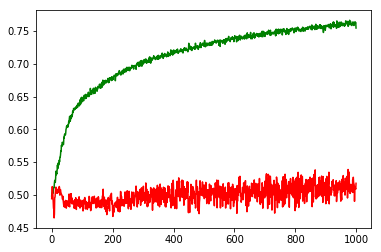

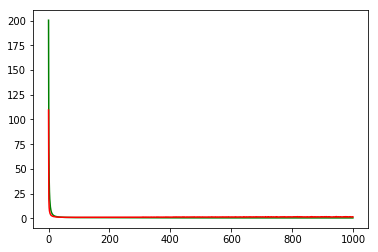

working on d,u and l,le 0.5 64 0.05 1e-05


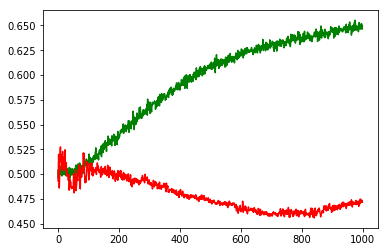

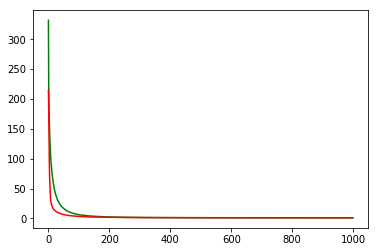

working on d,u and l,le 0.5 128 0.01 0.001


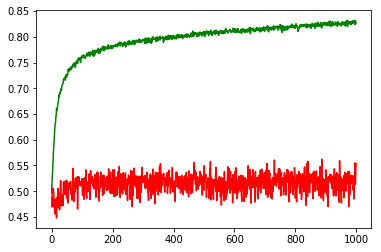

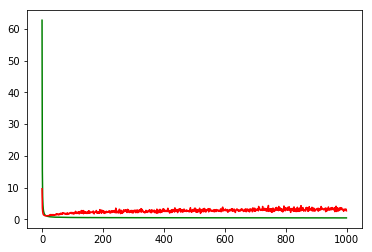

working on d,u and l,le 0.5 128 0.01 0.0001


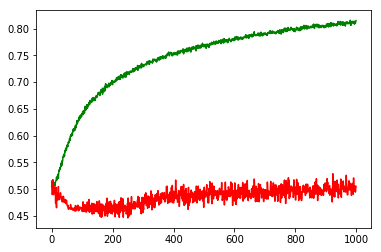

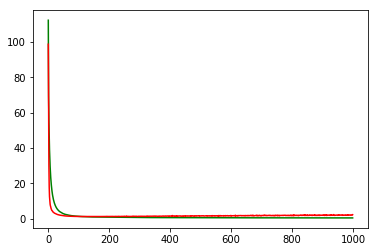

working on d,u and l,le 0.5 128 0.01 1e-05


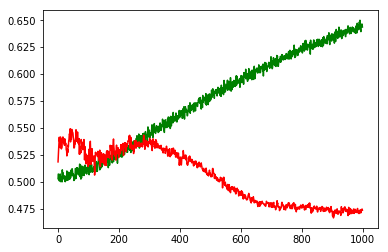

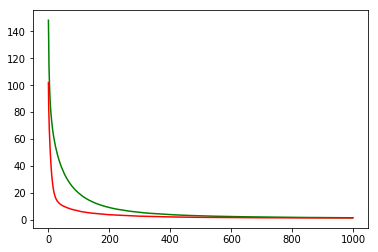

working on d,u and l,le 0.5 128 0.05 0.001


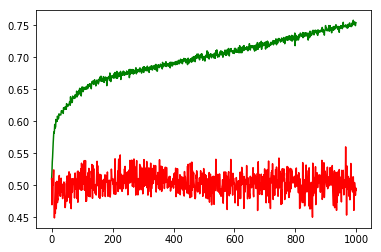

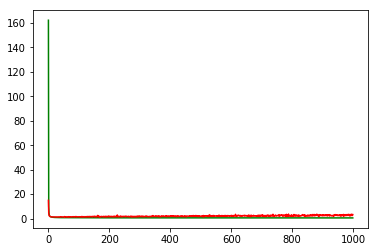

working on d,u and l,le 0.5 128 0.05 0.0001


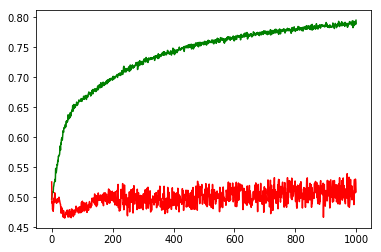

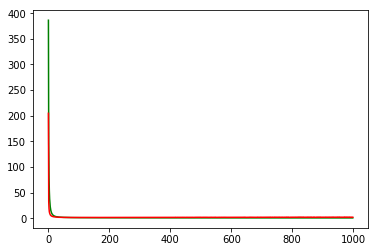

working on d,u and l,le 0.5 128 0.05 1e-05


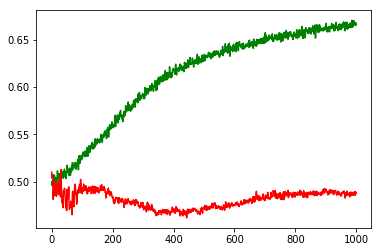

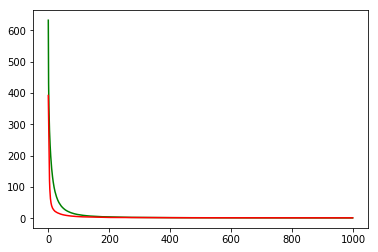

working on d,u and l,le 0.5 256 0.01 0.001


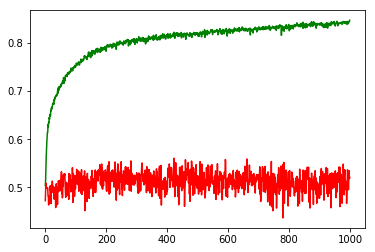

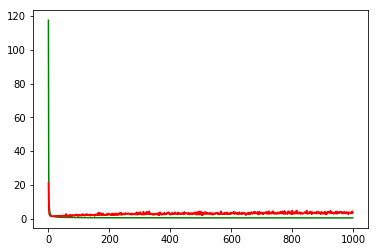

working on d,u and l,le 0.5 256 0.01 0.0001


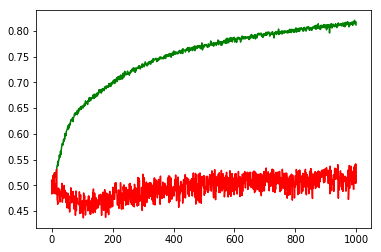

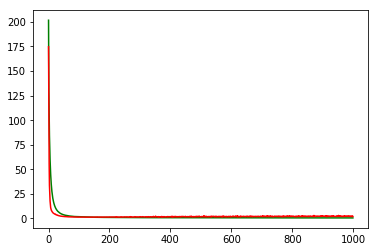

working on d,u and l,le 0.5 256 0.01 1e-05


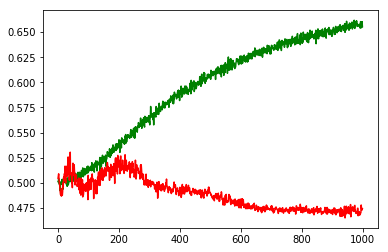

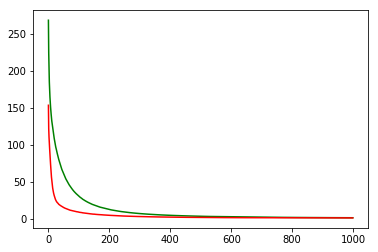

working on d,u and l,le 0.5 256 0.05 0.001


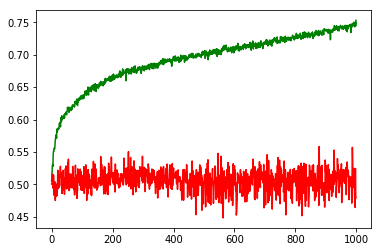

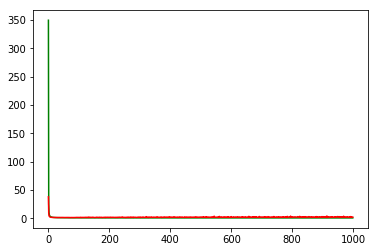

working on d,u and l,le 0.5 256 0.05 0.0001


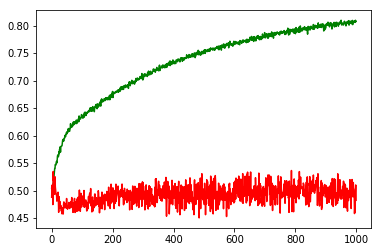

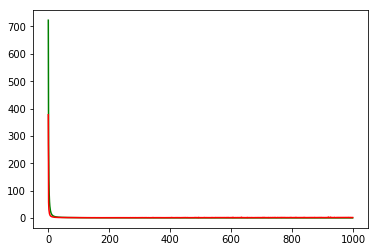

working on d,u and l,le 0.5 256 0.05 1e-05


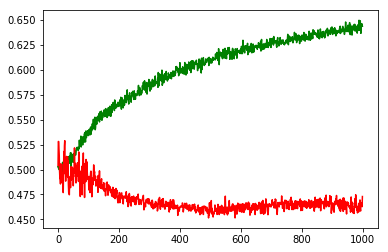

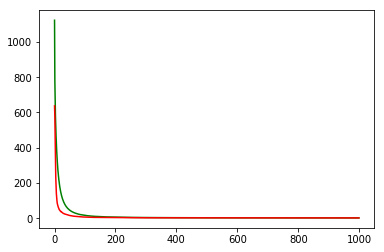

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: CSCO


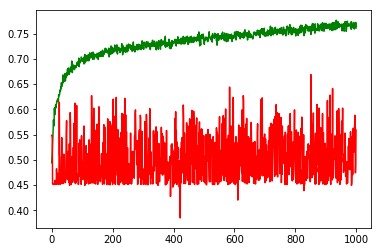

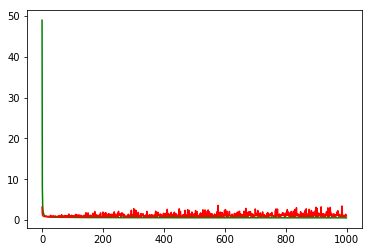

F1,score 0.434881087202718
G-score: 0.5165515379552239
Accuracy 0.559187281889966
Window: 140
[[441  70]
 [429 192]]
Vol pos 2.057599516668441
Vol neg 1.5732996831357249
Real Percentage of gain: 80.80793411291346
Percentage of gain: 0.4570529612777353
Total gain: 517.3839521663964
000000000000000000000000000000000000000000000000
Percentile:  0
[[186  45]
 [188 102]]
521/521 [==============================] - 0s 33us/step
[1.1756866149561418, 0.5527831095193947]
Percentile:  1
[[ 83  22]
 [147  66]]
318/318 [==============================] - 0s 29us/step
[0.9665324826660396, 0.46855346099385675]
Percentile:  2
[[61  3]
 [59 22]]
145/145 [==============================] - 0s 46us/step
[0.701470594981621, 0.5724137943366479]
Percentile:  3
[[58  0]
 [26  2]]
86/86 [==============================] - 0s 37us/step
[0.4808861672185188, 0.6976744186046512]
Percentile:  4
[[52  0]
 [ 6  0]]
58/58 [==============================] - 0s 66us/step
[0.1760646354021697, 0.896551724137931]
00000000000

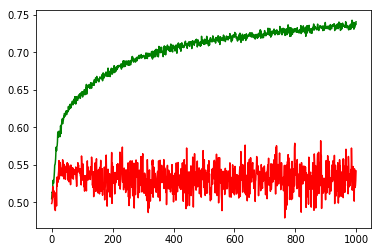

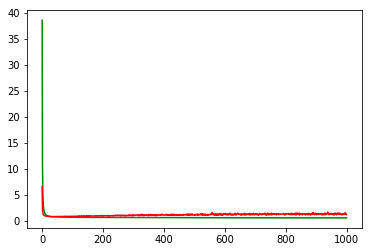

working on d,u and l,le 0.5 64 0.01 0.0001


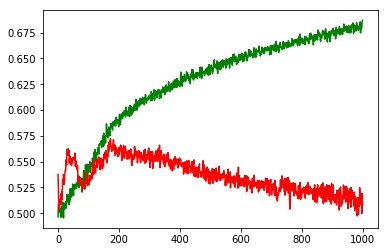

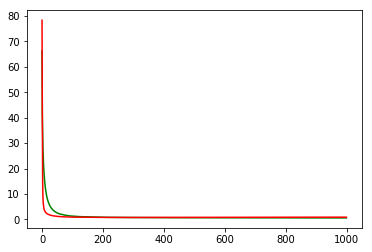

working on d,u and l,le 0.5 64 0.01 1e-05


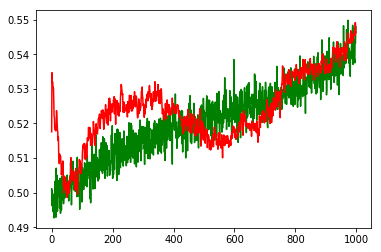

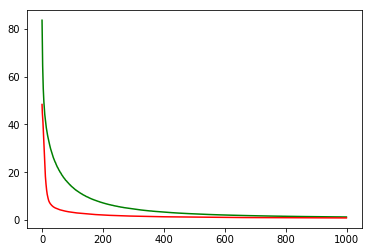

working on d,u and l,le 0.5 64 0.05 0.001


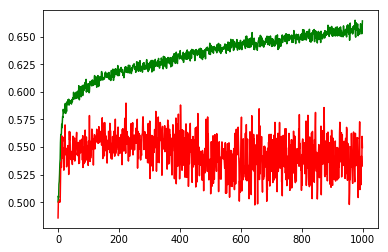

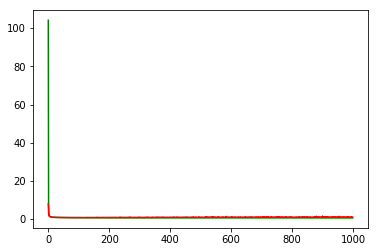

working on d,u and l,le 0.5 64 0.05 0.0001


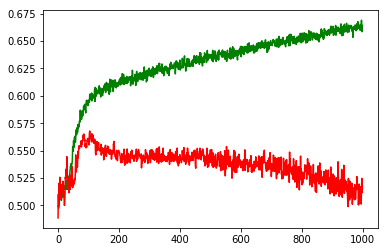

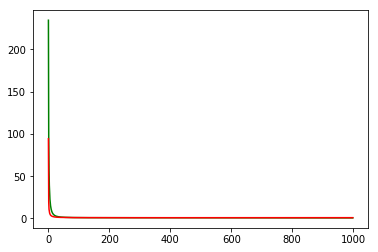

working on d,u and l,le 0.5 64 0.05 1e-05


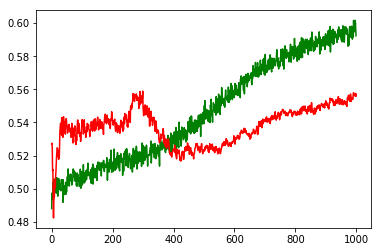

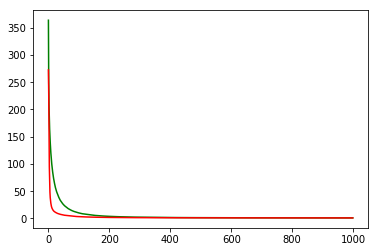

working on d,u and l,le 0.5 128 0.01 0.001


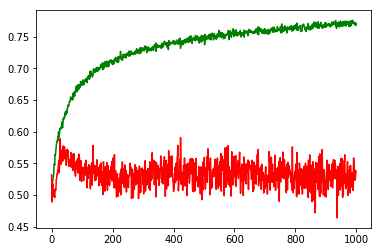

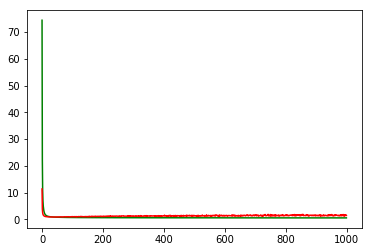

working on d,u and l,le 0.5 128 0.01 0.0001


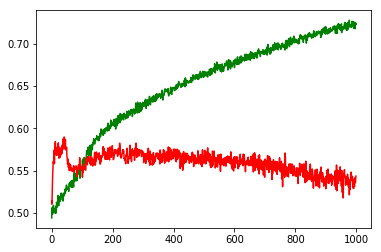

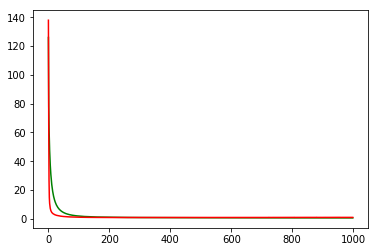

working on d,u and l,le 0.5 128 0.01 1e-05


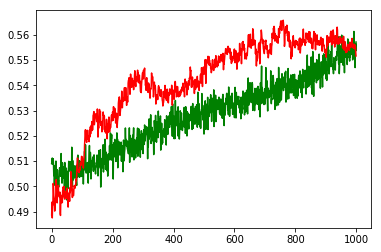

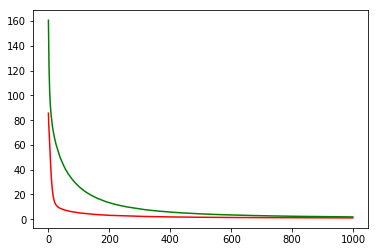

working on d,u and l,le 0.5 128 0.05 0.001


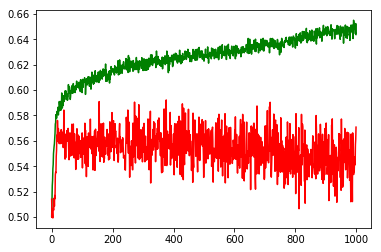

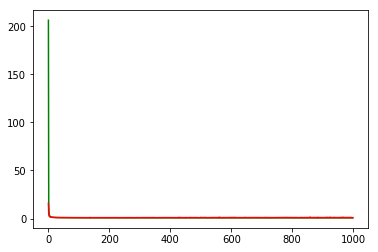

working on d,u and l,le 0.5 128 0.05 0.0001


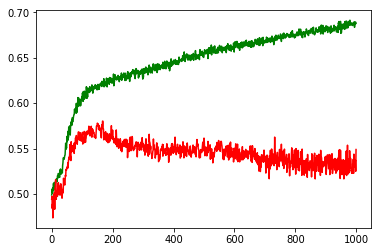

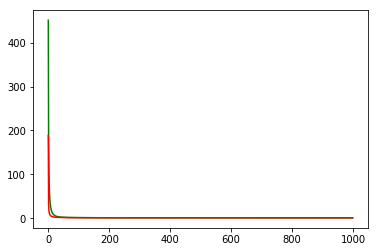

working on d,u and l,le 0.5 128 0.05 1e-05


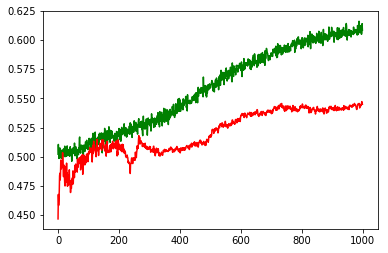

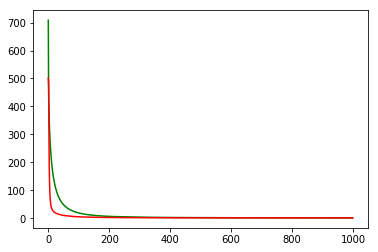

working on d,u and l,le 0.5 256 0.01 0.001


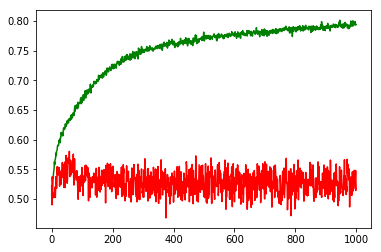

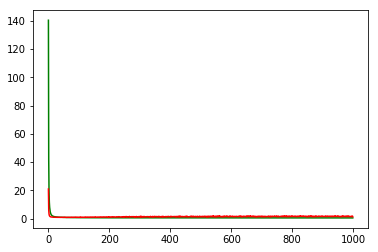

working on d,u and l,le 0.5 256 0.01 0.0001


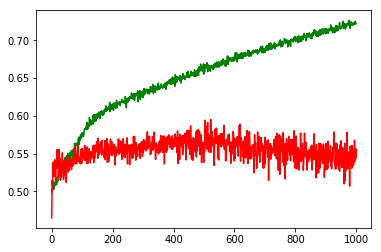

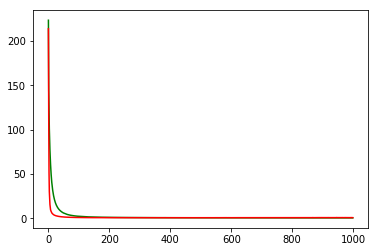

working on d,u and l,le 0.5 256 0.01 1e-05


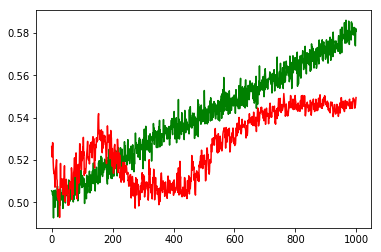

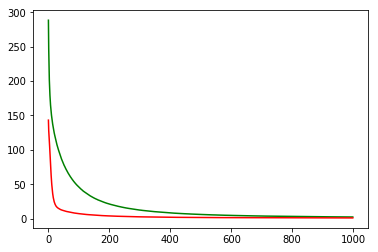

working on d,u and l,le 0.5 256 0.05 0.001


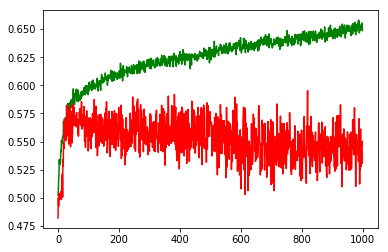

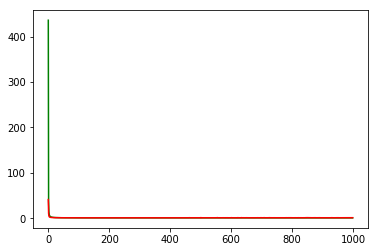

working on d,u and l,le 0.5 256 0.05 0.0001


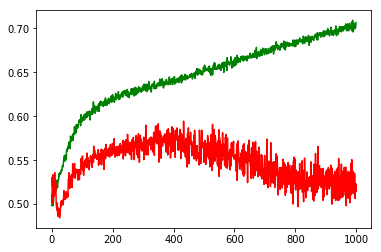

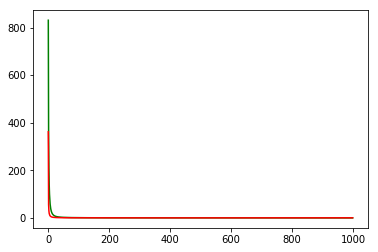

working on d,u and l,le 0.5 256 0.05 1e-05


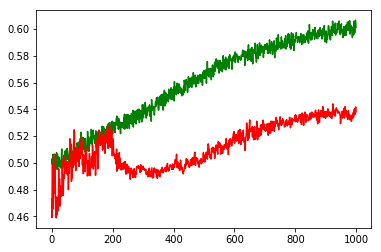

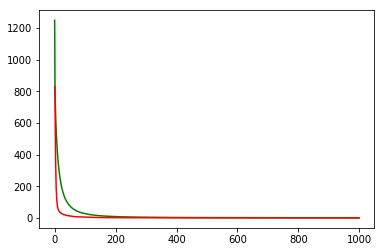

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: CMCSA


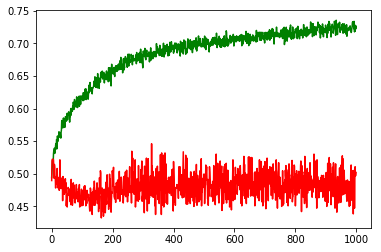

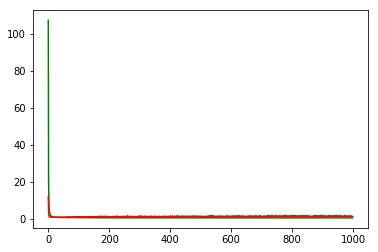

F1,score 0.5473515248796148
G-score: 0.4920369809687911
Accuracy 0.5017667829779769
Window: 140
[[227 314]
 [250 341]]
Vol pos 2.958955899896427
Vol neg 2.7572621795355974
Real Percentage of gain: 94.09238218514784
Percentage of gain: 0.11094618540909337
Total gain: 125.59108188309371
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 80 147]
 [ 88 112]]
427/427 [==============================] - 0s 32us/step
[1.4389338672021512, 0.4496487119437939]
Percentile:  1
[[106  92]
 [146 158]]
502/502 [==============================] - 0s 30us/step
[1.2687006108314394, 0.5258964150550356]
Percentile:  2
[[18 24]
 [15 59]]
116/116 [==============================] - 0s 39us/step
[0.6271470826247643, 0.6637930993376107]
Percentile:  3
[[23 37]
 [ 1 11]]
72/72 [==============================] - 0s 63us/step
[1.5623473061455622, 0.4722222222222222]
Percentile:  4
[[ 0 13]
 [ 0  0]]
13/13 [==============================] - 0s 100us/step
[2.3845624923706055, 0.0]
00000000000000000000

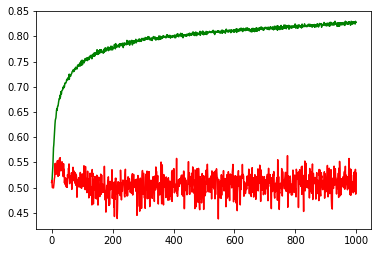

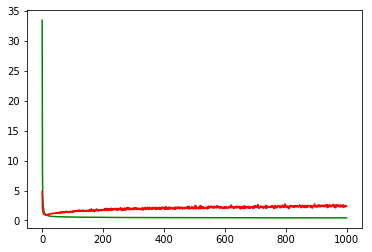

working on d,u and l,le 0.5 64 0.01 0.0001


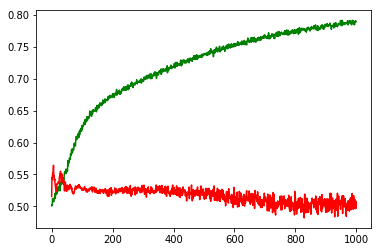

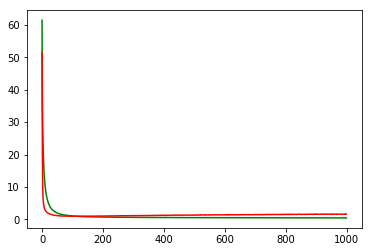

working on d,u and l,le 0.5 64 0.01 1e-05


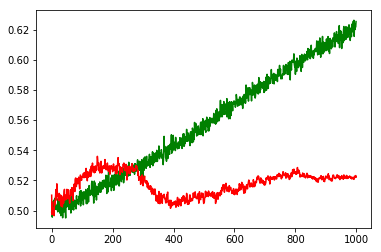

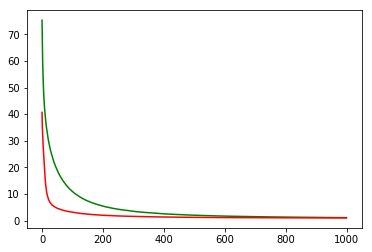

working on d,u and l,le 0.5 64 0.05 0.001


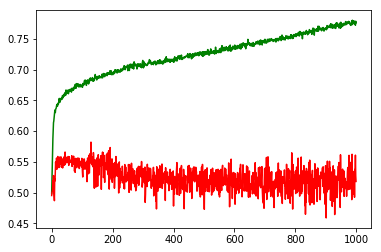

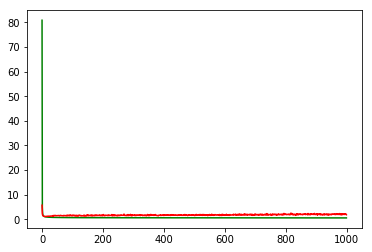

working on d,u and l,le 0.5 64 0.05 0.0001


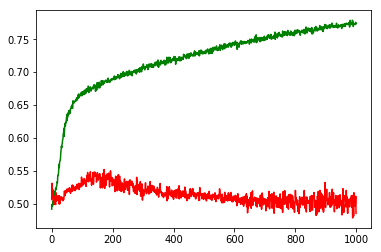

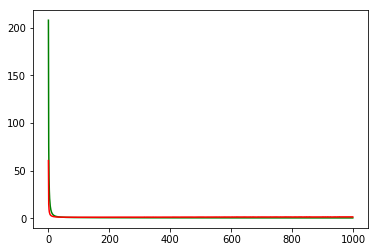

working on d,u and l,le 0.5 64 0.05 1e-05


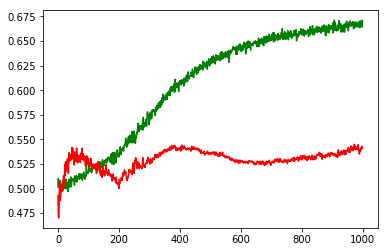

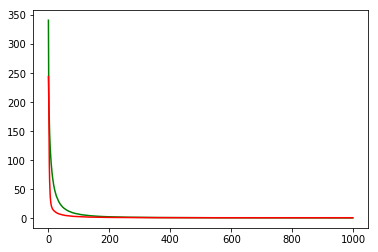

working on d,u and l,le 0.5 128 0.01 0.001


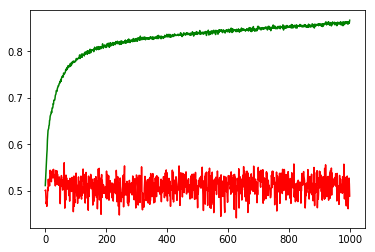

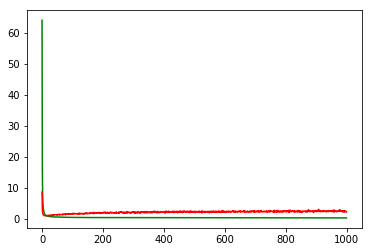

working on d,u and l,le 0.5 128 0.01 0.0001


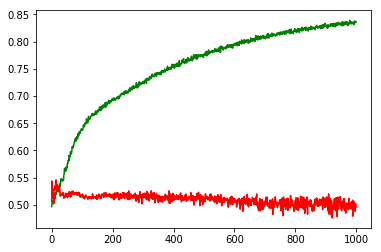

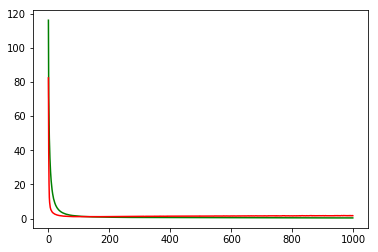

working on d,u and l,le 0.5 128 0.01 1e-05


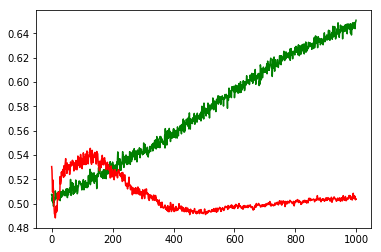

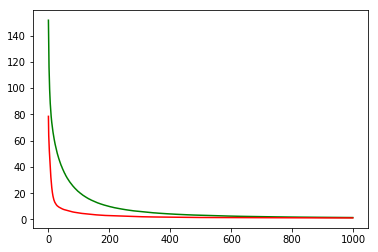

working on d,u and l,le 0.5 128 0.05 0.001


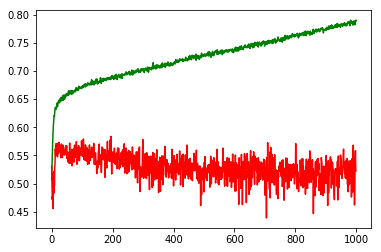

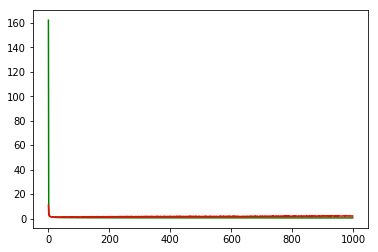

working on d,u and l,le 0.5 128 0.05 0.0001


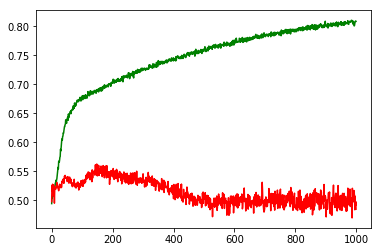

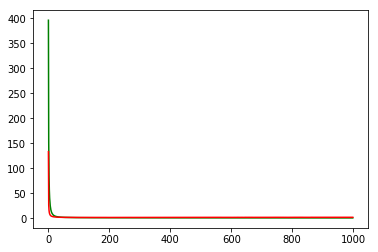

working on d,u and l,le 0.5 128 0.05 1e-05


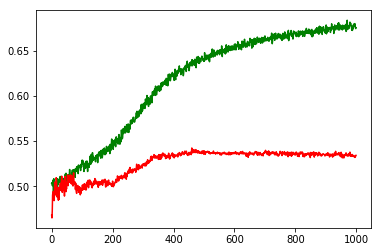

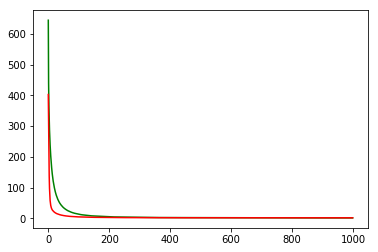

working on d,u and l,le 0.5 256 0.01 0.001


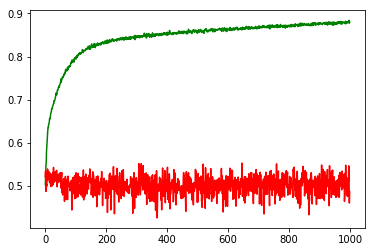

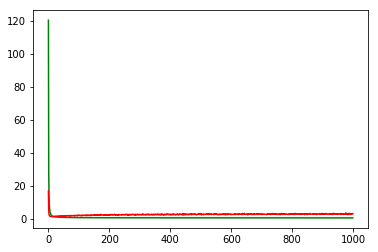

working on d,u and l,le 0.5 256 0.01 0.0001


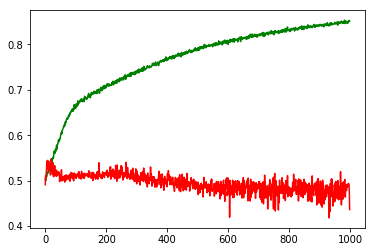

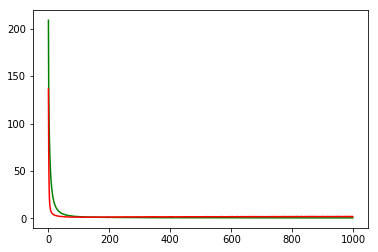

working on d,u and l,le 0.5 256 0.01 1e-05


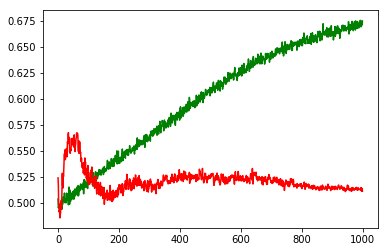

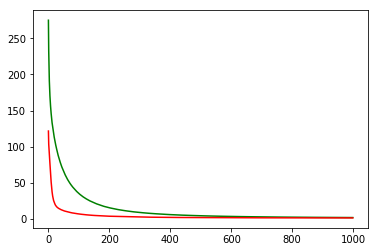

working on d,u and l,le 0.5 256 0.05 0.001


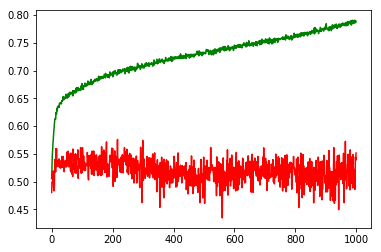

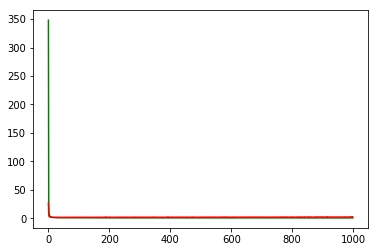

working on d,u and l,le 0.5 256 0.05 0.0001


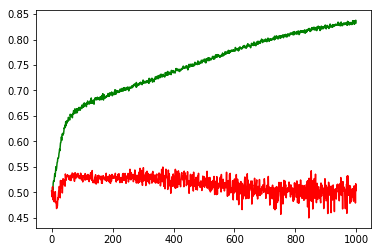

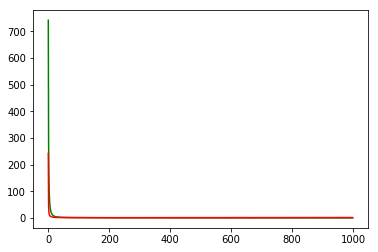

working on d,u and l,le 0.5 256 0.05 1e-05


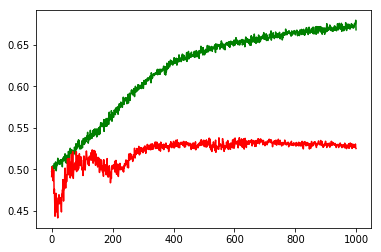

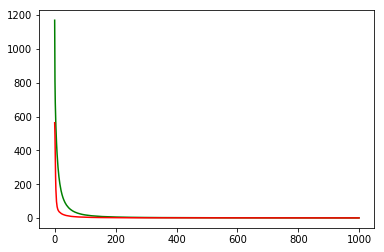

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: NVDA


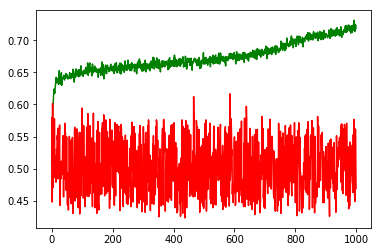

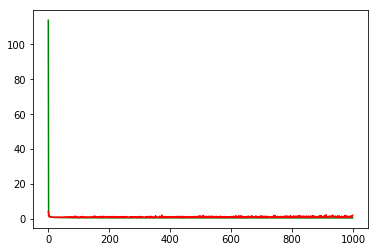

F1,score 0.1547116736990155
G-score: 0.2895539041605797
Accuracy 0.46908127082110296
Window: 140
[[476   0]
 [601  55]]
Vol pos 2.86311271884151
Vol neg 4.574762220545542
Real Percentage of gain: 12.59995050423797
Percentage of gain: -1.0857943823701666
Total gain: -1229.1192408430286
000000000000000000000000000000000000000000000000
Percentile:  0
[[312   0]
 [239   7]]
558/558 [==============================] - 0s 31us/step
[2.156811669629107, 0.5716845871727099]
Percentile:  1
[[118   0]
 [190  30]]
338/338 [==============================] - 0s 35us/step
[1.7995364449521494, 0.4378698224852071]
Percentile:  2
[[31  0]
 [70  2]]
103/103 [==============================] - 0s 32us/step
[2.2572994139587994, 0.32038834951456313]
Percentile:  3
[[15  0]
 [52 13]]
80/80 [==============================] - 0s 56us/step
[1.0242463946342468, 0.35]
Percentile:  4
[[ 0  0]
 [48  3]]
51/51 [==============================] - 0s 47us/step
[1.3287792205810547, 0.05882352970394434]
0000000000000000000

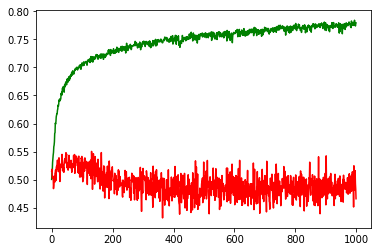

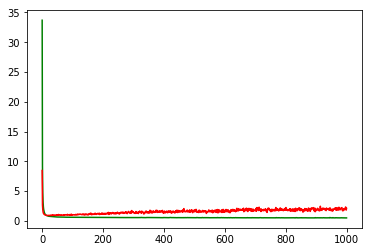

working on d,u and l,le 0.5 64 0.01 0.0001


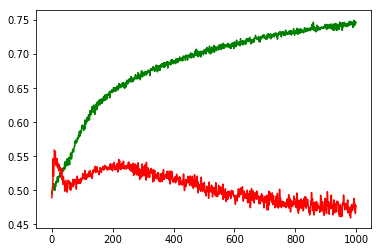

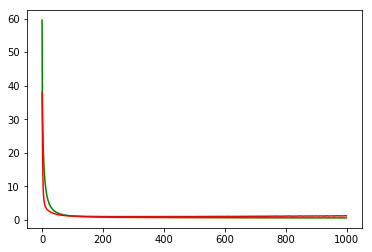

working on d,u and l,le 0.5 64 0.01 1e-05


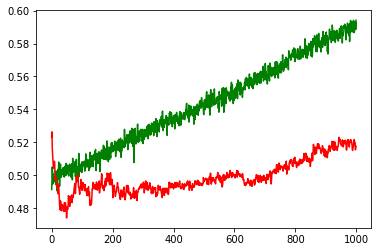

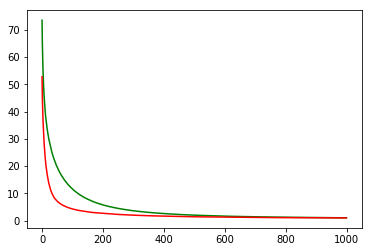

working on d,u and l,le 0.5 64 0.05 0.001


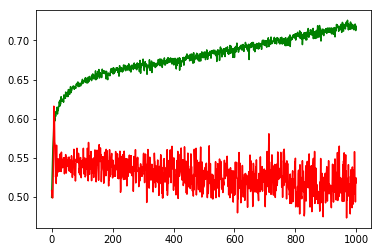

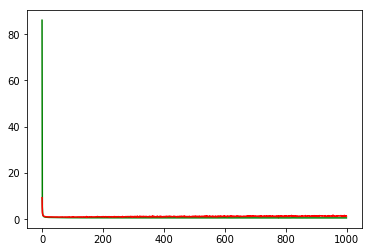

working on d,u and l,le 0.5 64 0.05 0.0001


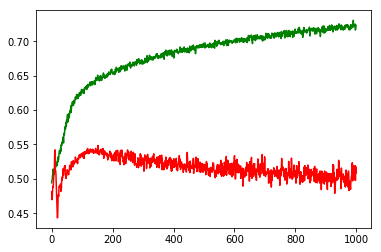

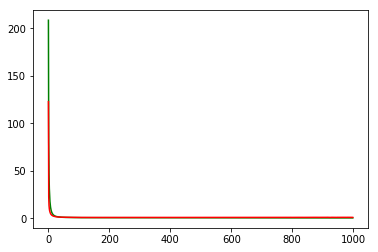

working on d,u and l,le 0.5 64 0.05 1e-05


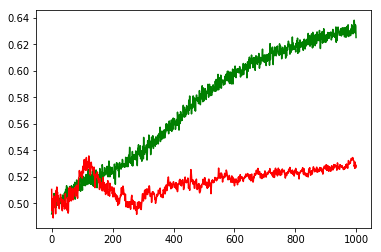

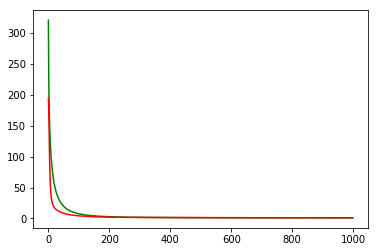

working on d,u and l,le 0.5 128 0.01 0.001


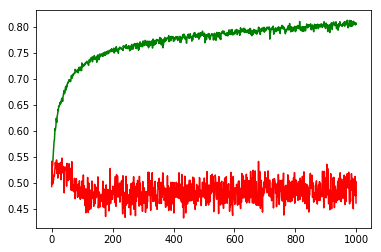

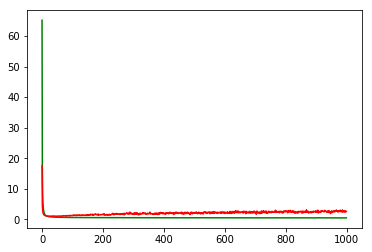

working on d,u and l,le 0.5 128 0.01 0.0001


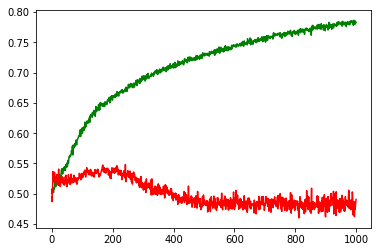

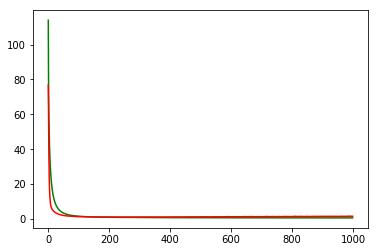

working on d,u and l,le 0.5 128 0.01 1e-05


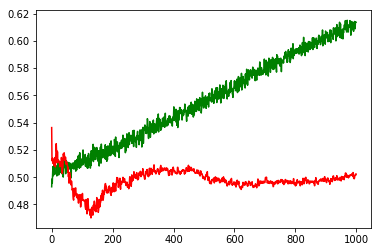

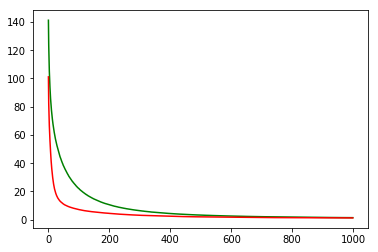

working on d,u and l,le 0.5 128 0.05 0.001


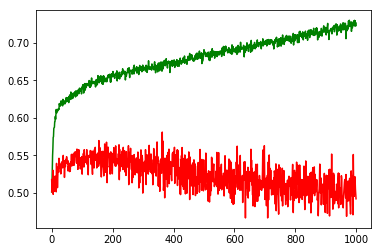

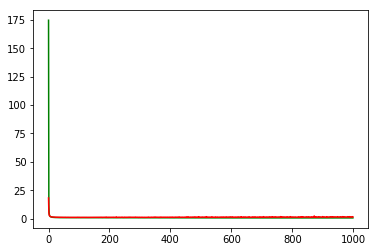

working on d,u and l,le 0.5 128 0.05 0.0001


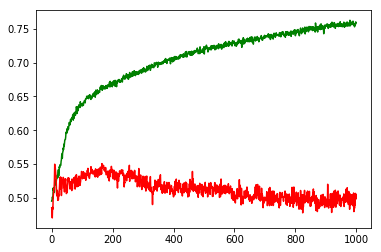

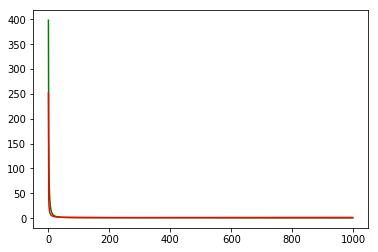

working on d,u and l,le 0.5 128 0.05 1e-05


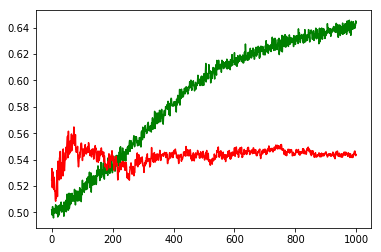

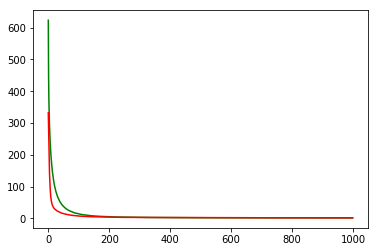

working on d,u and l,le 0.5 256 0.01 0.001


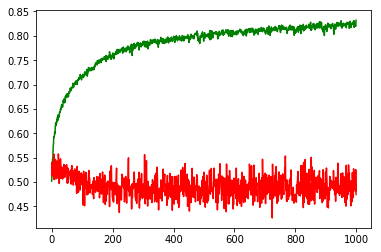

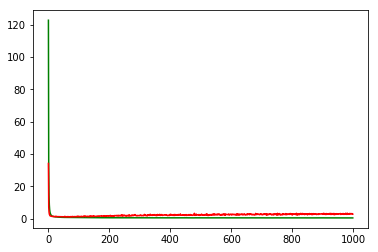

working on d,u and l,le 0.5 256 0.01 0.0001


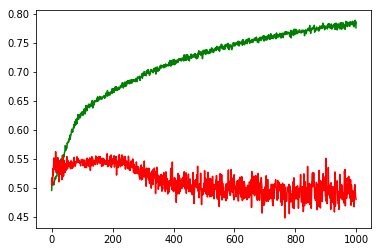

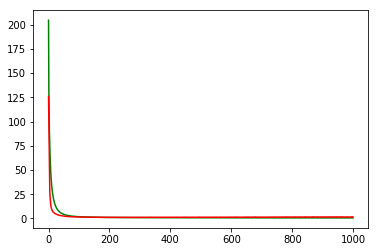

working on d,u and l,le 0.5 256 0.01 1e-05


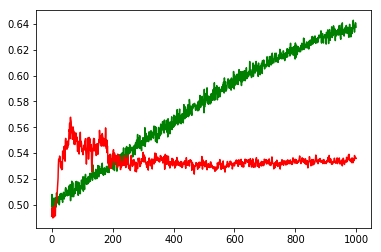

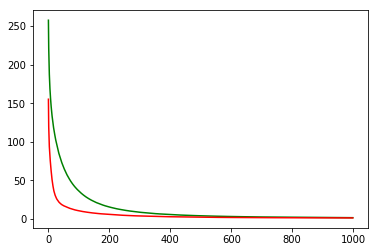

working on d,u and l,le 0.5 256 0.05 0.001


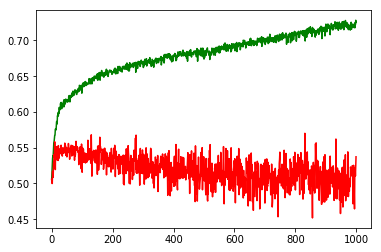

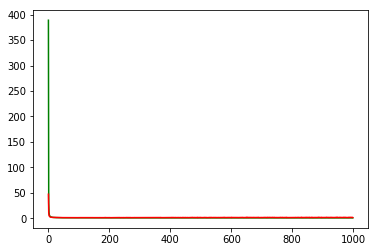

working on d,u and l,le 0.5 256 0.05 0.0001


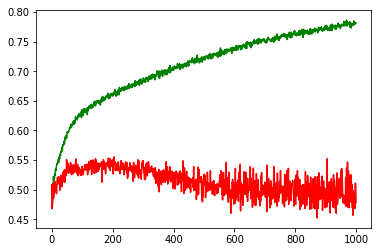

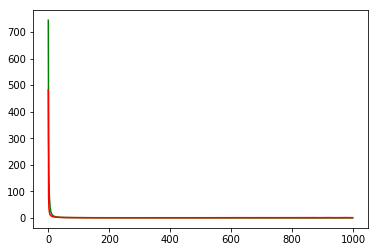

working on d,u and l,le 0.5 256 0.05 1e-05


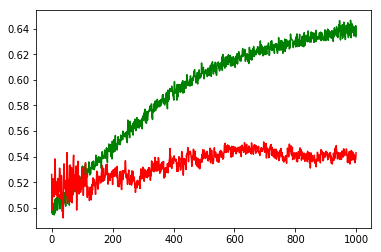

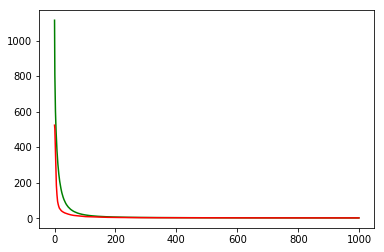

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.0001
Chart for BEST MODEL FOR: NFLX


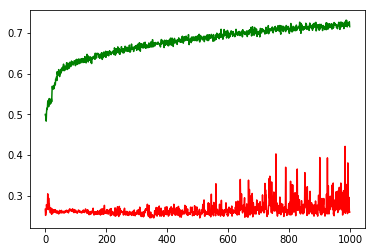

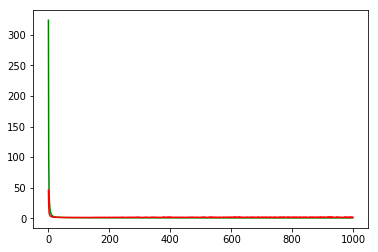

F1,score 0.13250517598343686
G-score: 0.24363094098233828
Accuracy 0.2597173145007961
Window: 140
[[230  67]
 [771  64]]
Vol pos 2.9303931712154396
Vol neg 4.832528640716101
Real Percentage of gain: -388.34606062538256
Percentage of gain: -2.816363435143775
Total gain: -3188.1234085827537
000000000000000000000000000000000000000000000000
Percentile:  0
[[132  38]
 [243  47]]
460/460 [==============================] - 0s 42us/step
[1.4816683012506235, 0.38913043484739634]
Percentile:  1
[[ 55   5]
 [253  15]]
328/328 [==============================] - 0s 29us/step
[1.6416794236113386, 0.21341463414634146]
Percentile:  2
[[ 22  16]
 [194   1]]
233/233 [==============================] - 0s 28us/step
[2.461320058470632, 0.09871244635193133]
Percentile:  3
[[19  8]
 [69  1]]
97/97 [==============================] - 0s 107us/step
[2.2609272113780388, 0.20618556701030927]
Percentile:  4
[[ 1  0]
 [11  0]]
12/12 [==============================] - 0s 67us/step
[2.744516134262085, 0.0833333358168

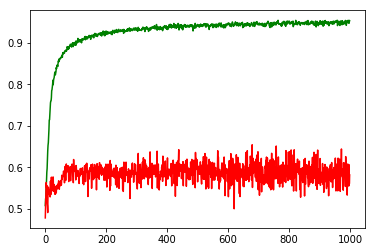

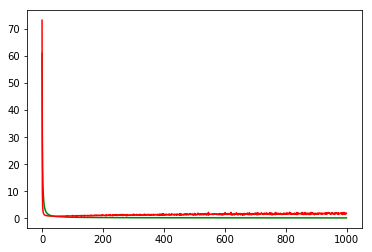

working on d,u and l,le 0.5 64 0.01 0.0001


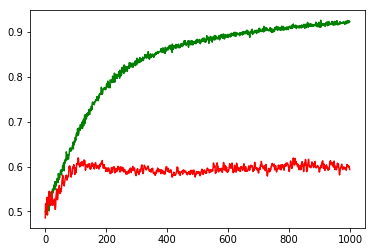

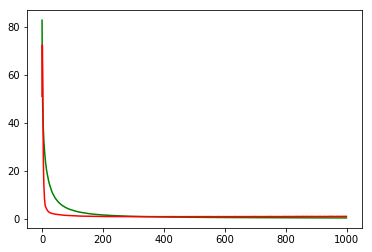

working on d,u and l,le 0.5 64 0.01 1e-05


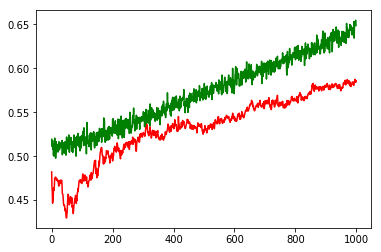

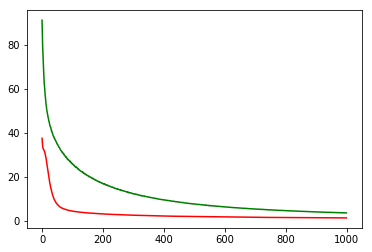

working on d,u and l,le 0.5 64 0.05 0.001


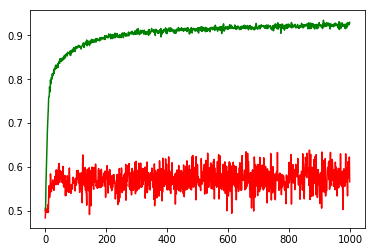

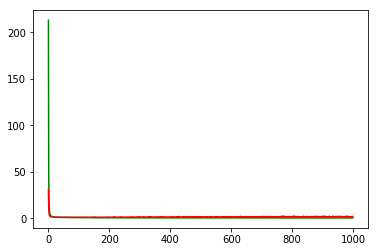

working on d,u and l,le 0.5 64 0.05 0.0001


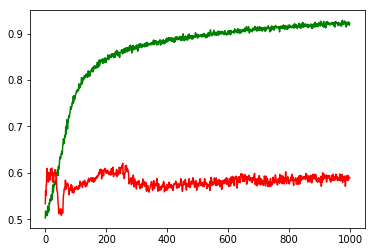

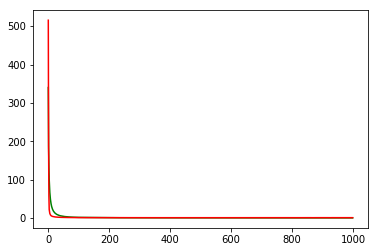

working on d,u and l,le 0.5 64 0.05 1e-05


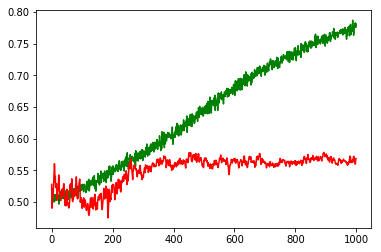

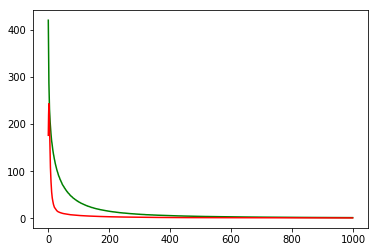

working on d,u and l,le 0.5 128 0.01 0.001


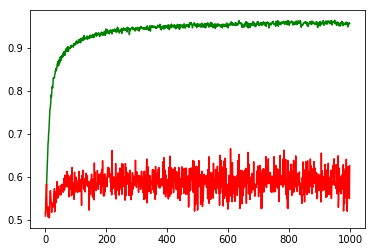

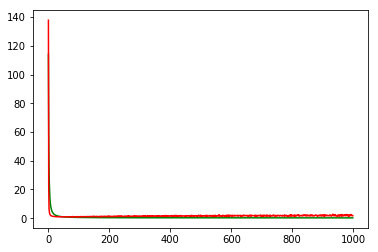

working on d,u and l,le 0.5 128 0.01 0.0001


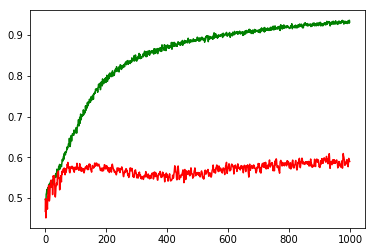

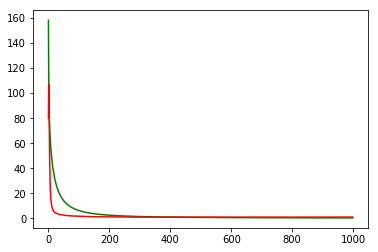

working on d,u and l,le 0.5 128 0.01 1e-05


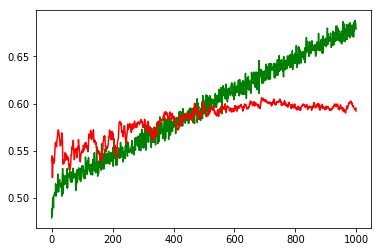

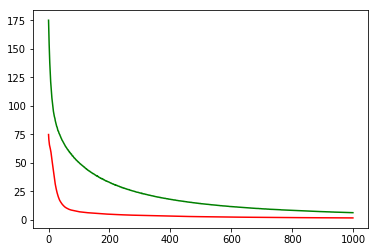

working on d,u and l,le 0.5 128 0.05 0.001


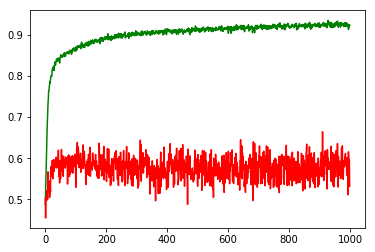

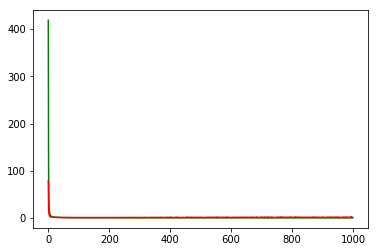

working on d,u and l,le 0.5 128 0.05 0.0001


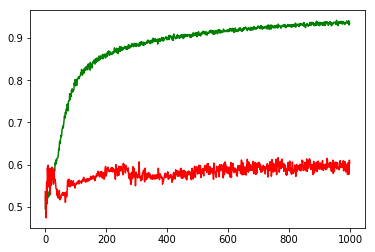

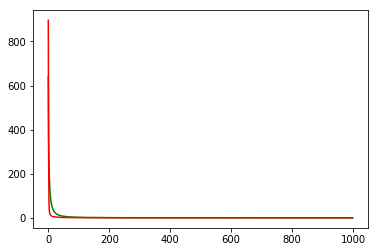

working on d,u and l,le 0.5 128 0.05 1e-05


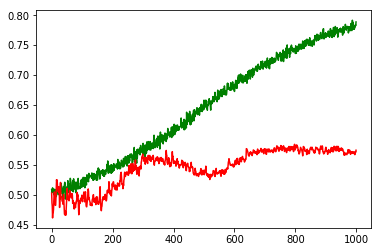

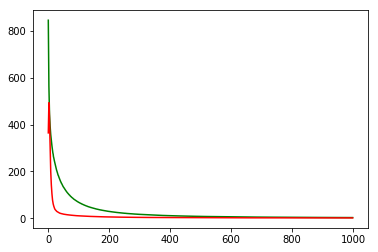

working on d,u and l,le 0.5 256 0.01 0.001


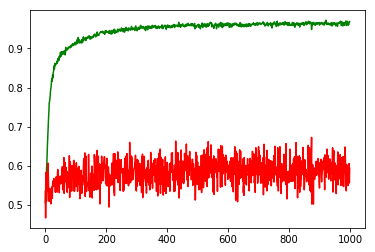

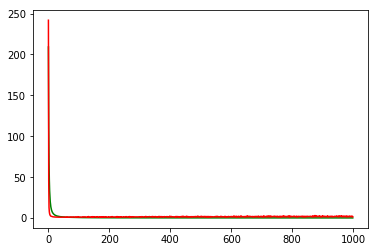

working on d,u and l,le 0.5 256 0.01 0.0001


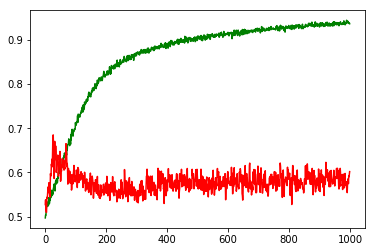

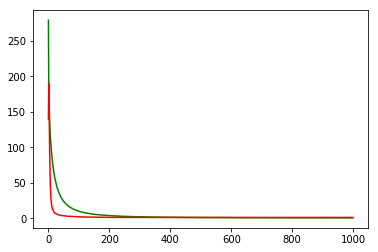

working on d,u and l,le 0.5 256 0.01 1e-05


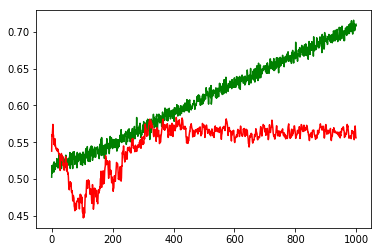

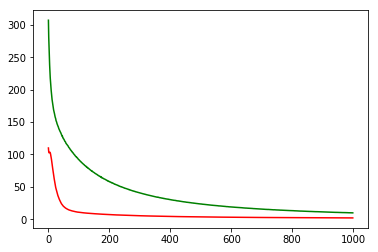

working on d,u and l,le 0.5 256 0.05 0.001


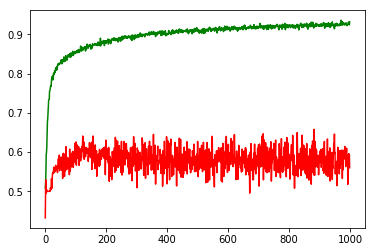

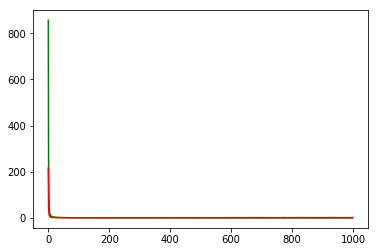

working on d,u and l,le 0.5 256 0.05 0.0001


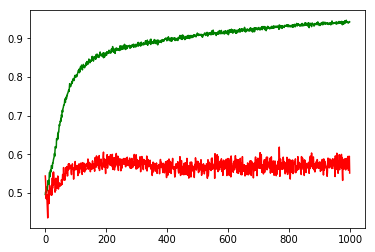

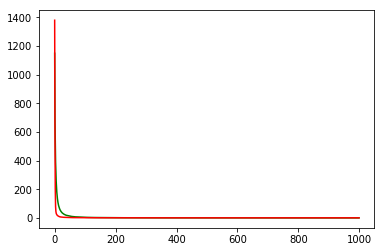

working on d,u and l,le 0.5 256 0.05 1e-05


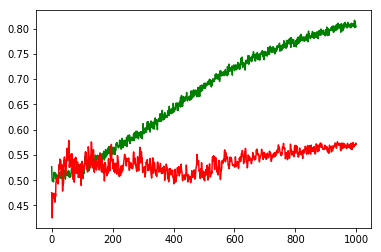

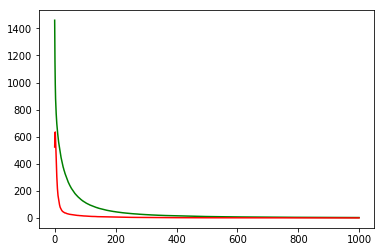

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: BKNG


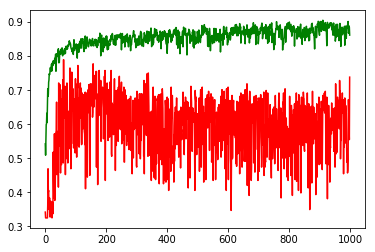

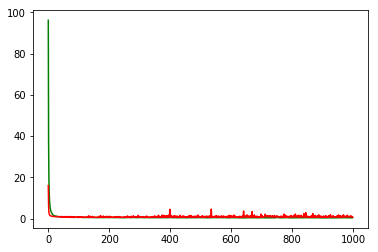

F1,score 0.8207705192629816
G-score: 0.6167939547439611
Accuracy 0.738386309088588
Window: 140
[[ 57  76]
 [ 31 245]]
Vol pos 1.2759914431046362
Vol neg 0.5988927543673911
Real Percentage of gain: 205.49200847681064
Percentage of gain: 0.7854960662598759
Total gain: 321.26789110028926
000000000000000000000000000000000000000000000000
Percentile:  0
[[40 59]
 [22 75]]
196/196 [==============================] - 0s 33us/step
[0.8604028449983013, 0.5867346938775511]
Percentile:  1
[[12 14]
 [ 6 66]]
98/98 [==============================] - 0s 40us/step
[0.5222815600584965, 0.7959183673469388]
Percentile:  2
[[ 4  3]
 [ 3 72]]
82/82 [==============================] - 0s 47us/step
[0.26944488650415, 0.9268292639313674]
Percentile:  3
[[ 0  0]
 [ 0 19]]
19/19 [==============================] - 0s 60us/step
[0.11102510988712311, 1.0]
Percentile:  4
[[ 0  0]
 [ 0 12]]
12/12 [==============================] - 0s 98us/step
[0.038796789944171906, 1.0]
00000000000000000000000000000000000000000000000

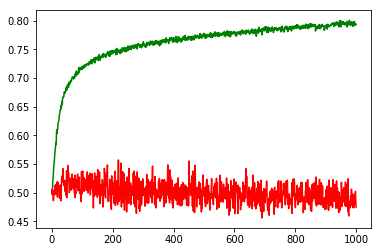

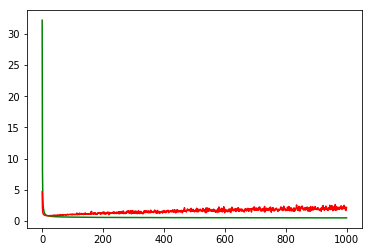

working on d,u and l,le 0.5 64 0.01 0.0001


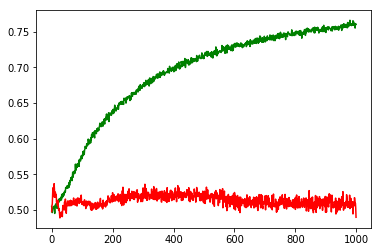

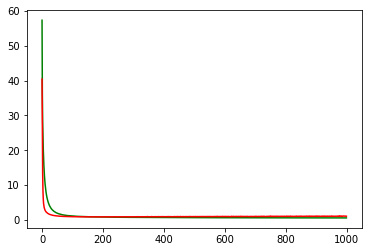

working on d,u and l,le 0.5 64 0.01 1e-05


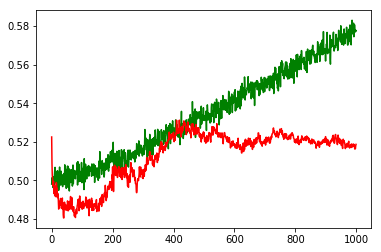

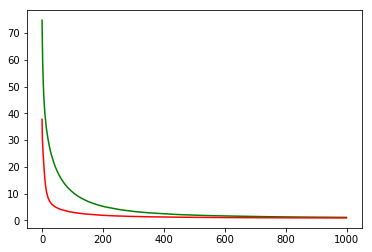

working on d,u and l,le 0.5 64 0.05 0.001


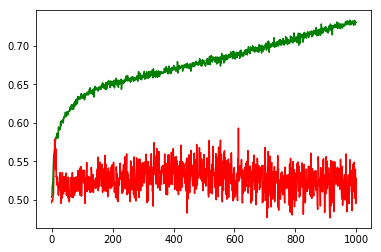

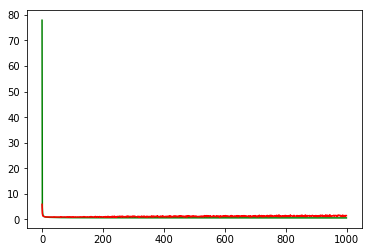

working on d,u and l,le 0.5 64 0.05 0.0001


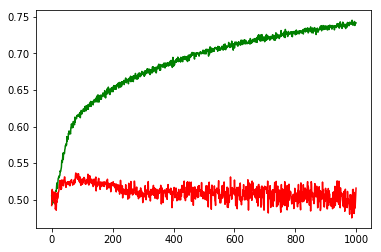

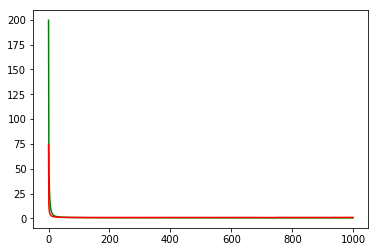

working on d,u and l,le 0.5 64 0.05 1e-05


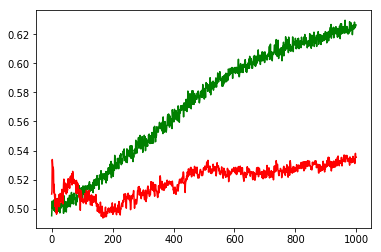

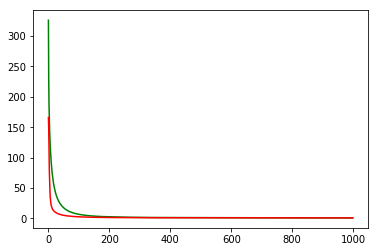

working on d,u and l,le 0.5 128 0.01 0.001


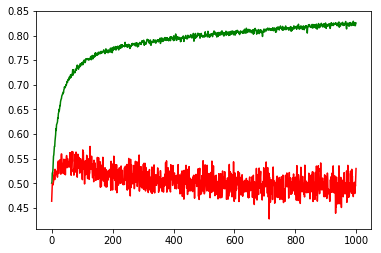

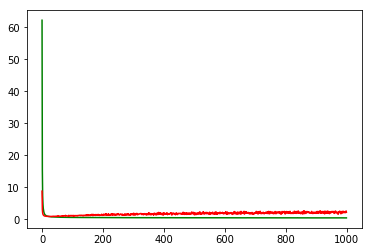

working on d,u and l,le 0.5 128 0.01 0.0001


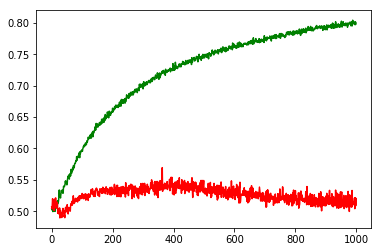

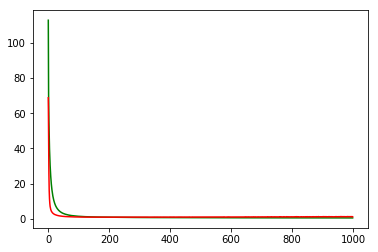

working on d,u and l,le 0.5 128 0.01 1e-05


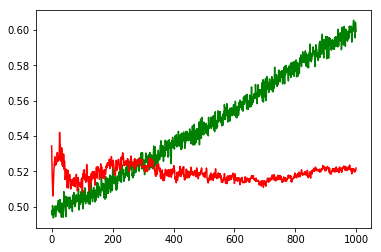

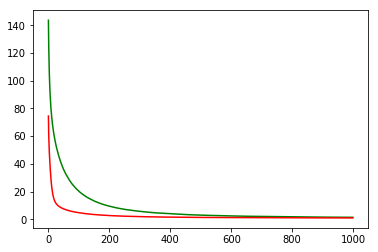

working on d,u and l,le 0.5 128 0.05 0.001


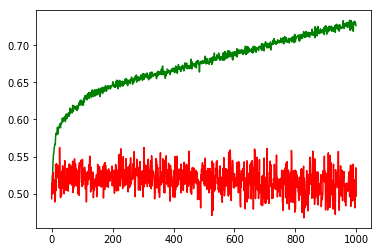

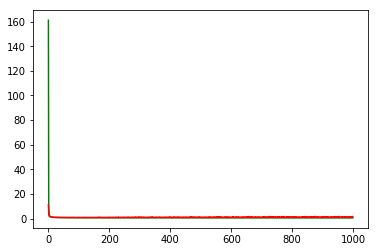

working on d,u and l,le 0.5 128 0.05 0.0001


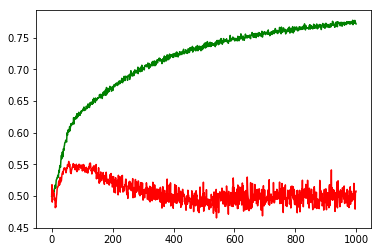

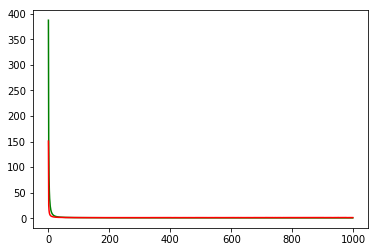

working on d,u and l,le 0.5 128 0.05 1e-05


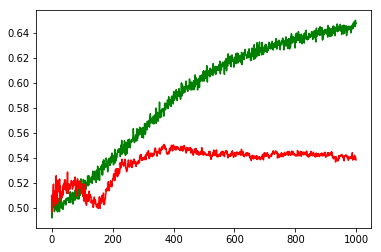

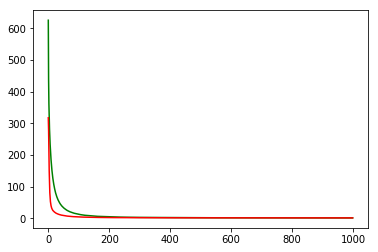

working on d,u and l,le 0.5 256 0.01 0.001


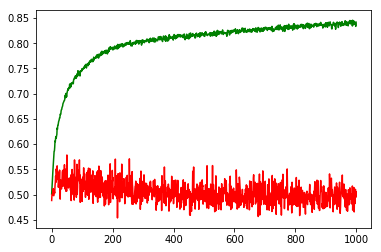

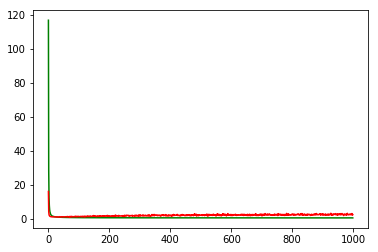

working on d,u and l,le 0.5 256 0.01 0.0001


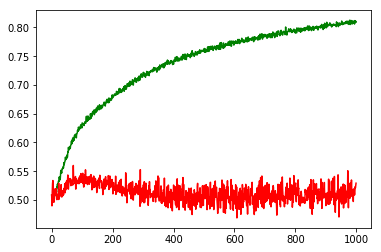

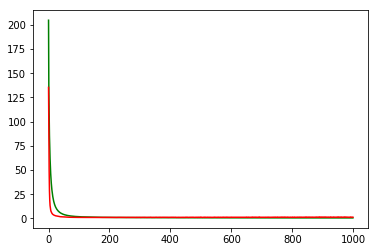

working on d,u and l,le 0.5 256 0.01 1e-05


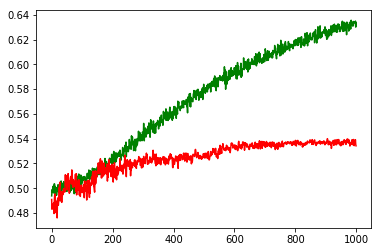

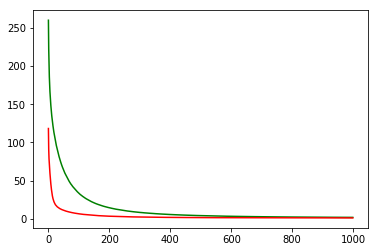

working on d,u and l,le 0.5 256 0.05 0.001


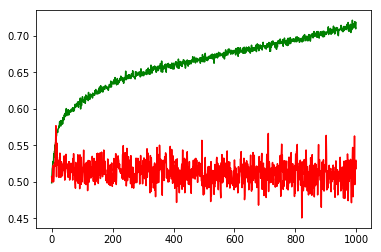

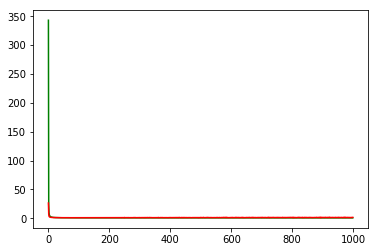

working on d,u and l,le 0.5 256 0.05 0.0001


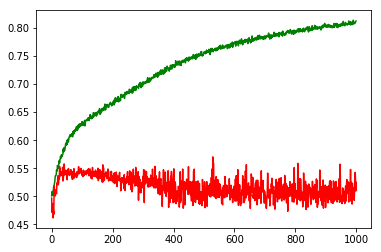

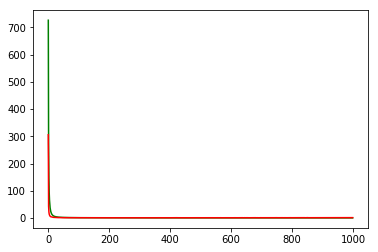

working on d,u and l,le 0.5 256 0.05 1e-05


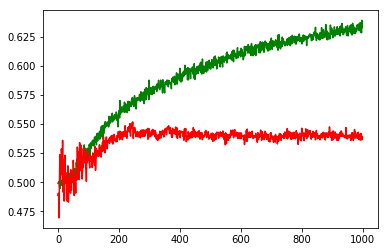

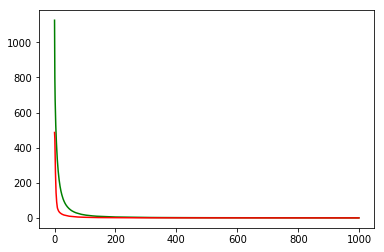

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: ADBE


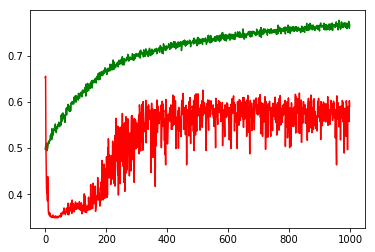

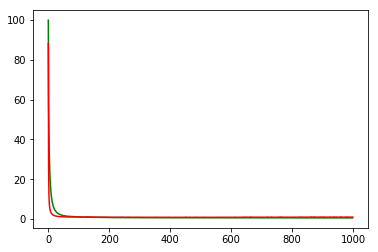

F1,score 0.7136672850958564
G-score: 0.4275267819932644
Accuracy 0.5909894002410633
Window: 140
[[ 92 301]
 [162 577]]
Vol pos 2.791372375986908
Vol neg 2.417914871205818
Real Percentage of gain: 168.23807889493742
Percentage of gain: 0.6607186697587878
Total gain: 747.9335341669478
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 58 209]
 [ 44 238]]
549/549 [==============================] - 0s 37us/step
[1.0258001225893614, 0.5391621129326047]
Percentile:  1
[[ 17  61]
 [ 79 182]]
339/339 [==============================] - 0s 38us/step
[0.778126974021439, 0.5870206489675516]
Percentile:  2
[[ 10  15]
 [ 17 116]]
158/158 [==============================] - 0s 39us/step
[0.5177532721169388, 0.7974683582028256]
Percentile:  3
[[ 7 16]
 [ 8 35]]
66/66 [==============================] - 0s 68us/step
[0.6736361140554602, 0.6363636363636364]
Percentile:  4
[[ 0  0]
 [14  4]]
18/18 [==============================] - 0s 142us/step
[0.9634149074554443, 0.2222222238779068]
0000

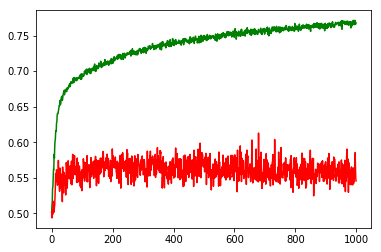

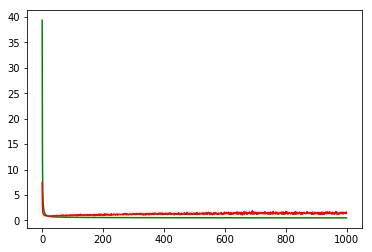

working on d,u and l,le 0.5 64 0.01 0.0001


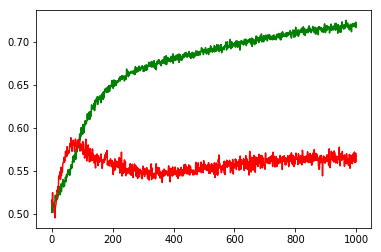

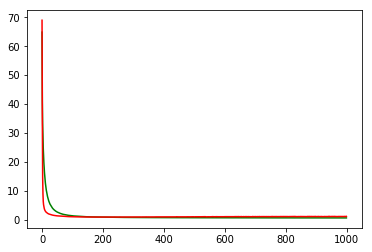

working on d,u and l,le 0.5 64 0.01 1e-05


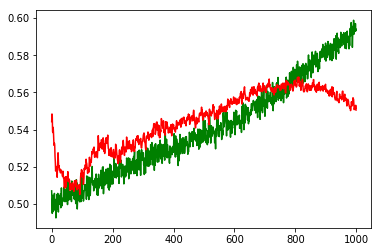

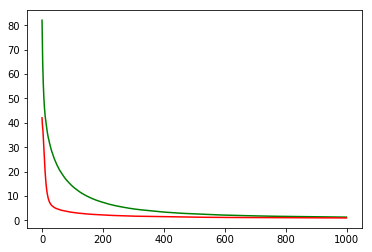

working on d,u and l,le 0.5 64 0.05 0.001


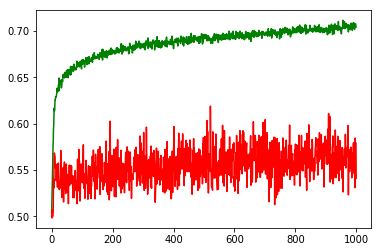

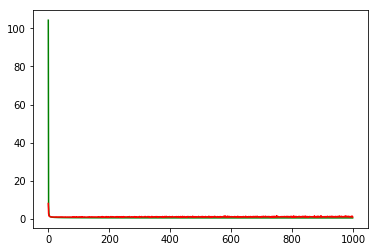

working on d,u and l,le 0.5 64 0.05 0.0001


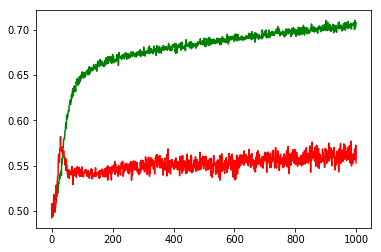

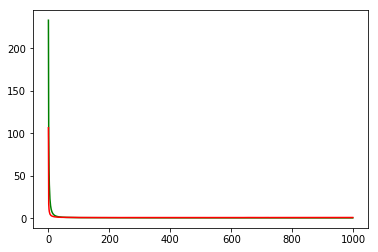

working on d,u and l,le 0.5 64 0.05 1e-05


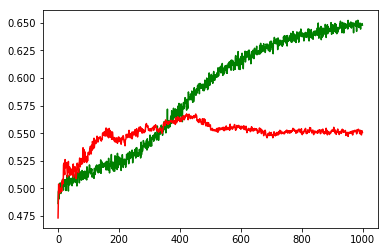

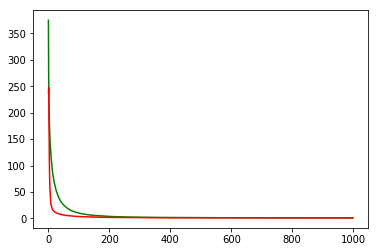

working on d,u and l,le 0.5 128 0.01 0.001


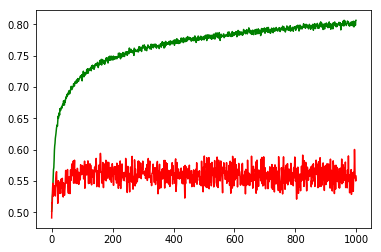

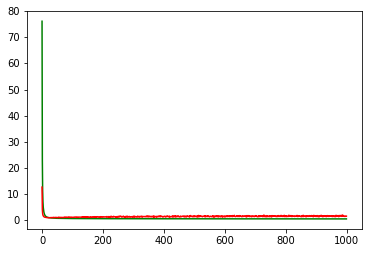

working on d,u and l,le 0.5 128 0.01 0.0001


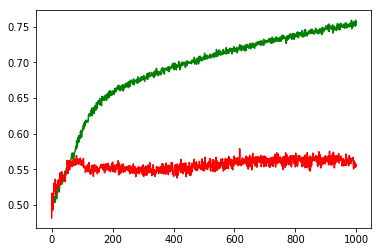

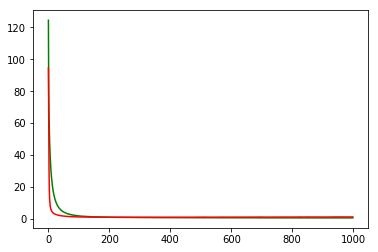

working on d,u and l,le 0.5 128 0.01 1e-05


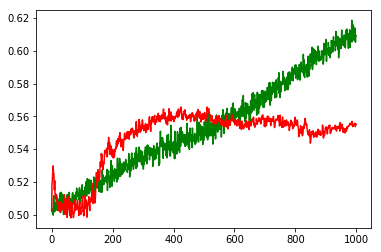

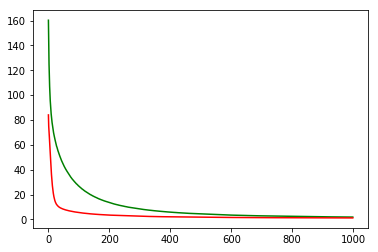

working on d,u and l,le 0.5 128 0.05 0.001


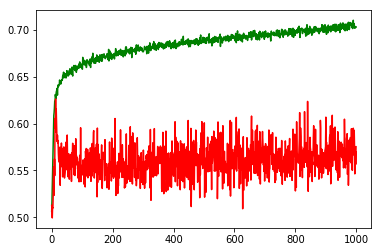

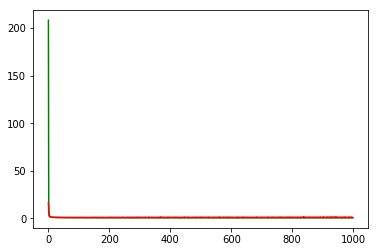

working on d,u and l,le 0.5 128 0.05 0.0001


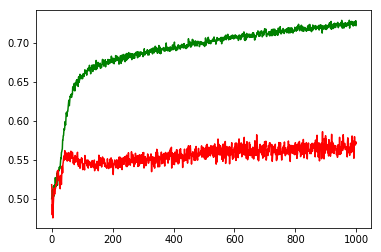

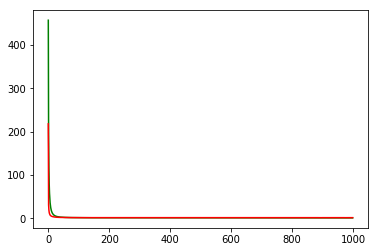

working on d,u and l,le 0.5 128 0.05 1e-05


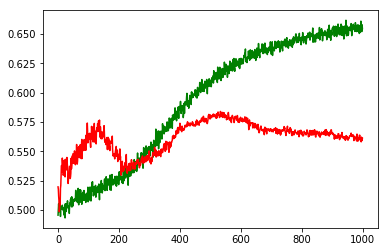

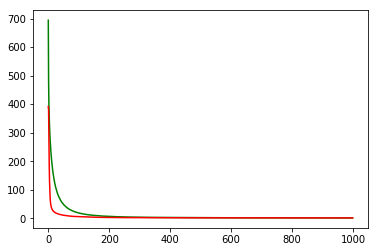

working on d,u and l,le 0.5 256 0.01 0.001


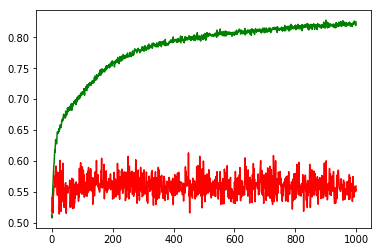

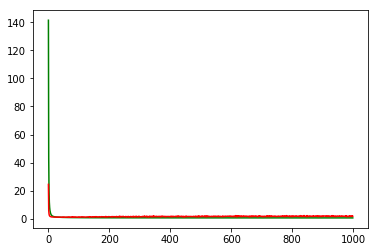

working on d,u and l,le 0.5 256 0.01 0.0001


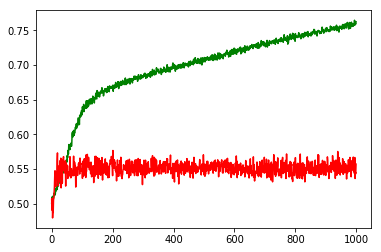

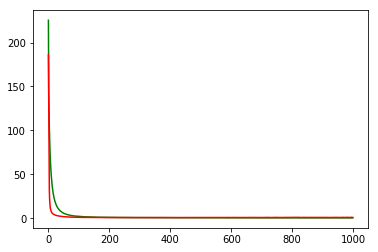

working on d,u and l,le 0.5 256 0.01 1e-05


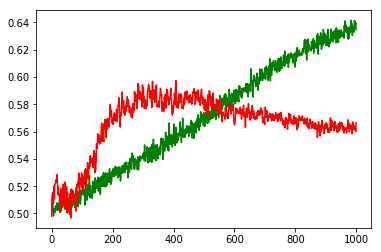

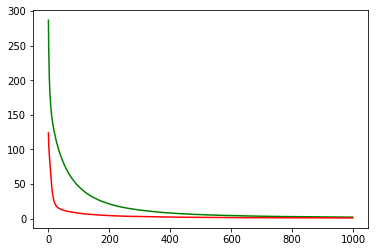

working on d,u and l,le 0.5 256 0.05 0.001


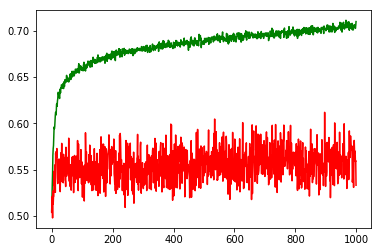

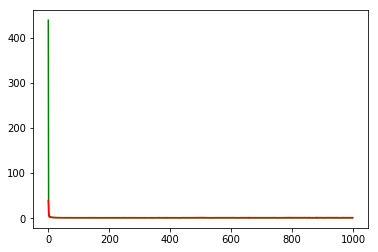

working on d,u and l,le 0.5 256 0.05 0.0001


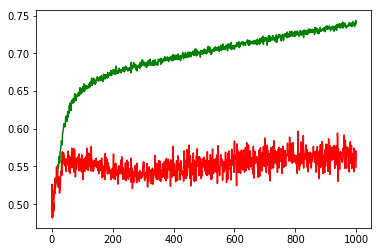

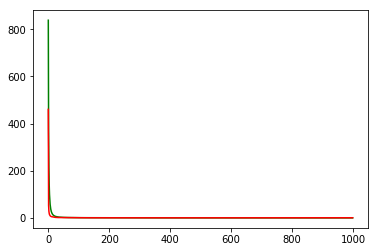

working on d,u and l,le 0.5 256 0.05 1e-05


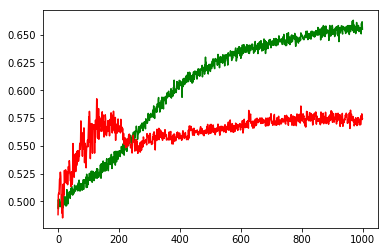

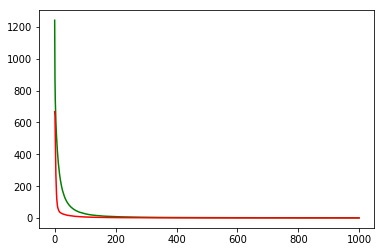

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: AMGN


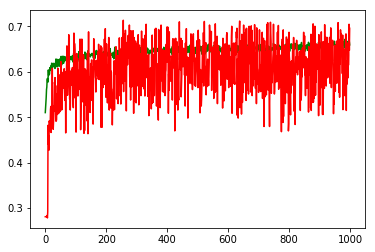

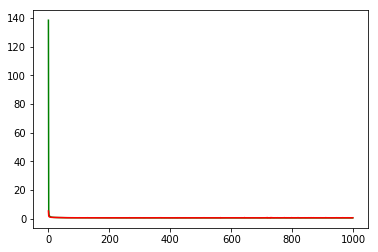

F1,score 0.8160427807486632
G-score: 0.2714604163649312
Accuracy 0.6961130761005011
Window: 140
[[ 25 293]
 [ 51 763]]
Vol pos 1.8948120111808635
Vol neg 1.904247832345589
Real Percentage of gain: 181.0998595704661
Percentage of gain: 0.7403273944201748
Total gain: 838.0506104836379
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 23 140]
 [ 30 279]]
472/472 [==============================] - 0s 38us/step
[0.7720455648535389, 0.6398305084745762]
Percentile:  1
[[  2  53]
 [ 16 229]]
300/300 [==============================] - 0s 28us/step
[0.6120319787661235, 0.7699999992052714]
Percentile:  2
[[  0  26]
 [  5 182]]
213/213 [==============================] - 0s 35us/step
[0.5516781960854508, 0.8544600944563816]
Percentile:  3
[[ 0 56]
 [ 0 69]]
125/125 [==============================] - 0s 45us/step
[0.8732281515598297, 0.552]
Percentile:  4
[[ 0 17]
 [ 0  3]]
20/20 [==============================] - 0s 40us/step
[1.5088821649551392, 0.15000000596046448]
00000000000000

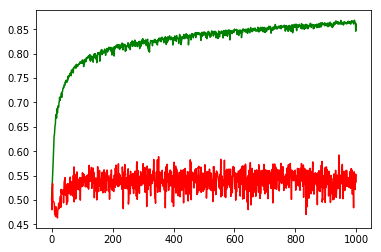

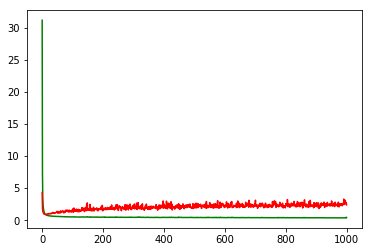

working on d,u and l,le 0.5 64 0.01 0.0001


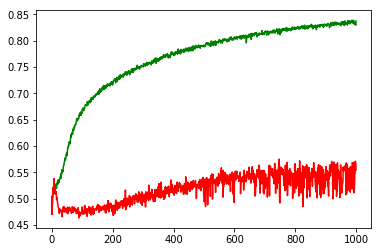

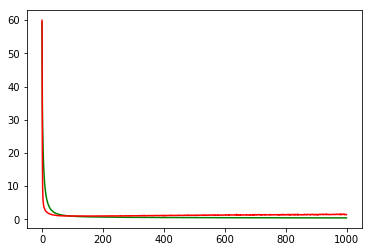

working on d,u and l,le 0.5 64 0.01 1e-05


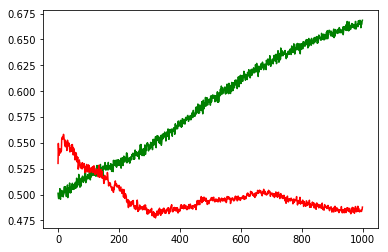

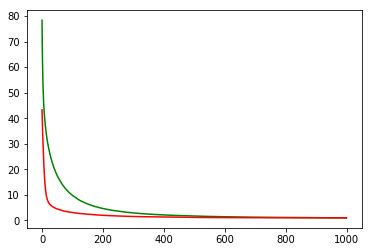

working on d,u and l,le 0.5 64 0.05 0.001


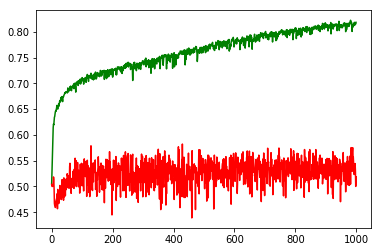

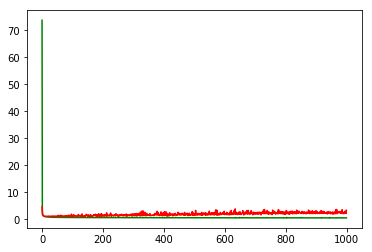

working on d,u and l,le 0.5 64 0.05 0.0001


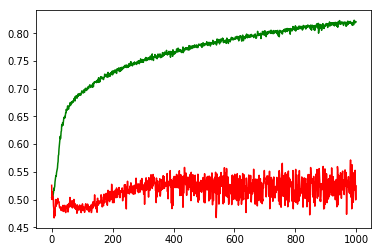

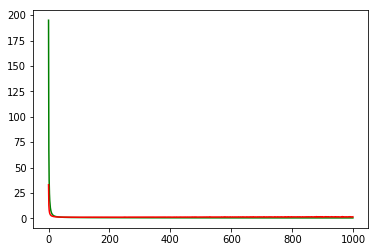

working on d,u and l,le 0.5 64 0.05 1e-05


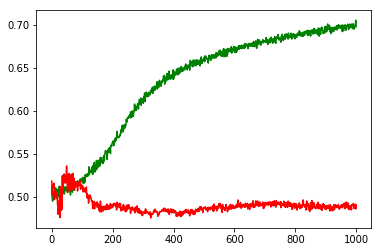

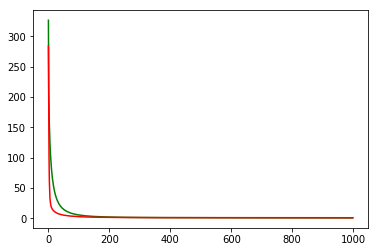

working on d,u and l,le 0.5 128 0.01 0.001


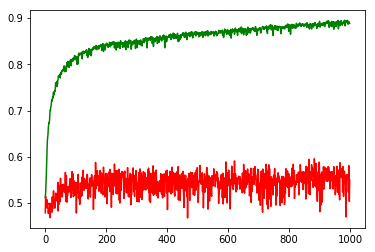

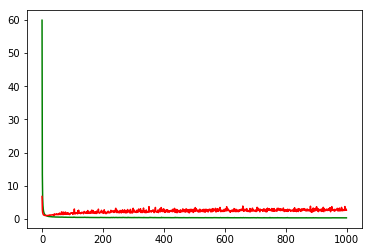

working on d,u and l,le 0.5 128 0.01 0.0001


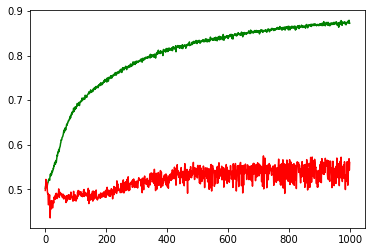

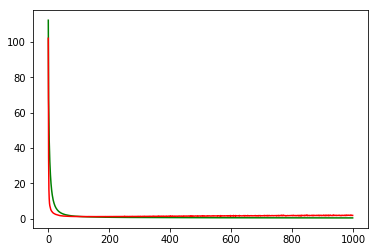

working on d,u and l,le 0.5 128 0.01 1e-05


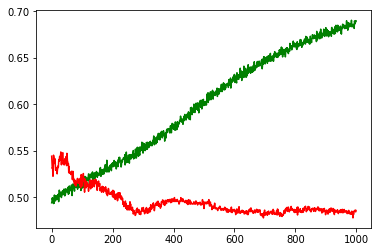

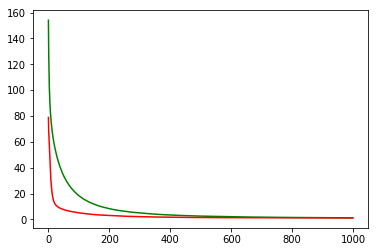

working on d,u and l,le 0.5 128 0.05 0.001


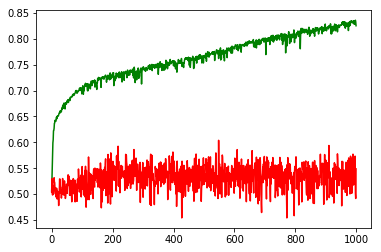

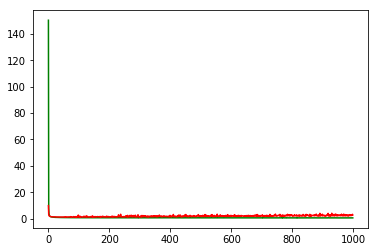

working on d,u and l,le 0.5 128 0.05 0.0001


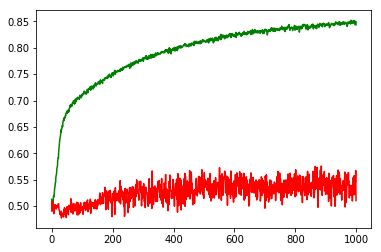

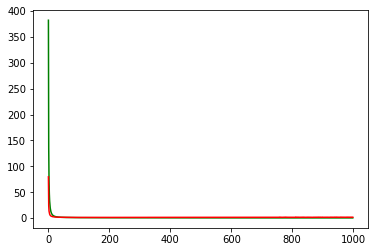

working on d,u and l,le 0.5 128 0.05 1e-05


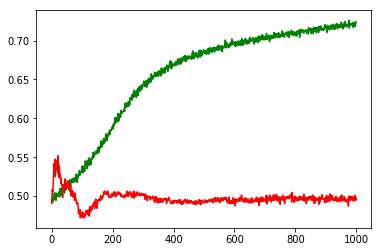

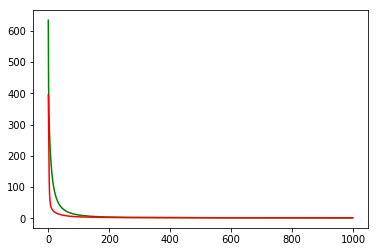

working on d,u and l,le 0.5 256 0.01 0.001


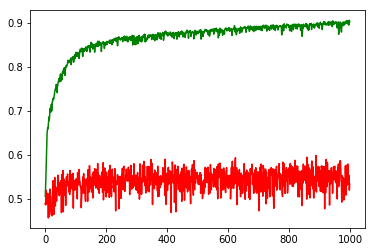

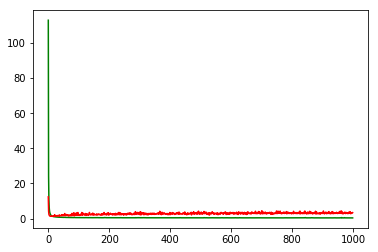

working on d,u and l,le 0.5 256 0.01 0.0001


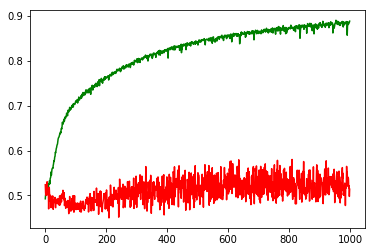

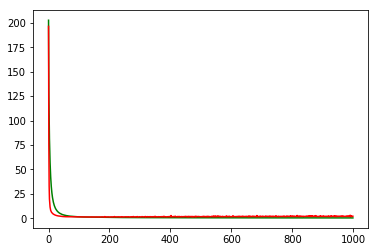

working on d,u and l,le 0.5 256 0.01 1e-05


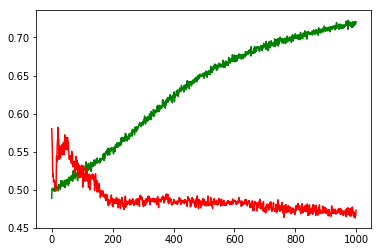

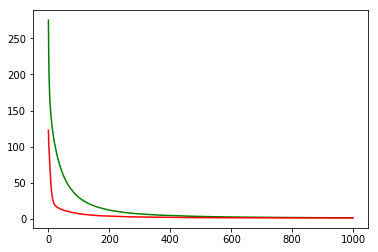

working on d,u and l,le 0.5 256 0.05 0.001


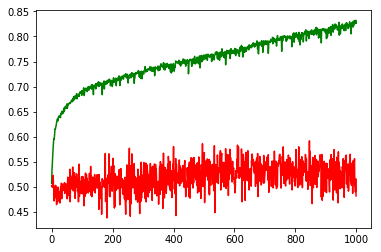

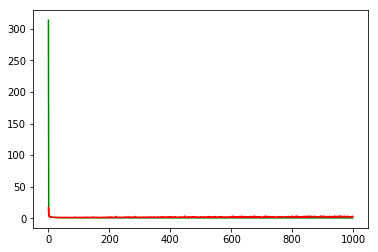

working on d,u and l,le 0.5 256 0.05 0.0001


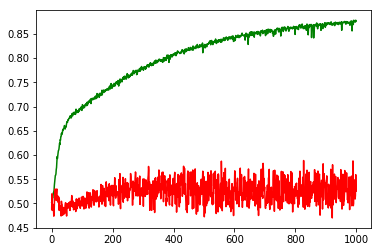

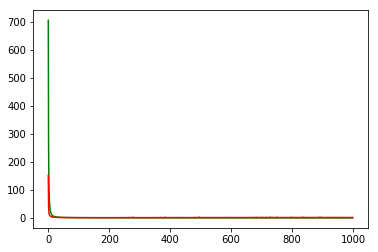

working on d,u and l,le 0.5 256 0.05 1e-05


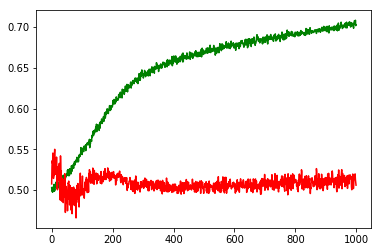

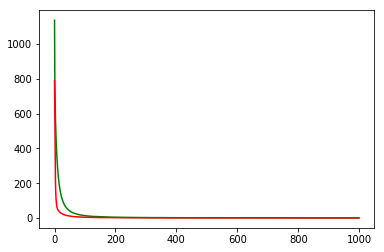

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.0001
Chart for BEST MODEL FOR: TXN


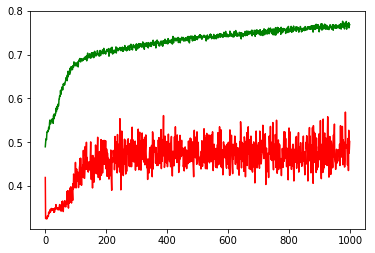

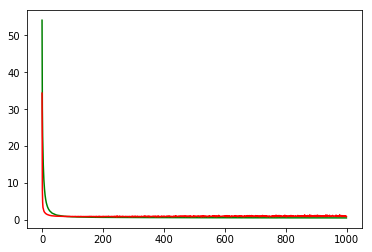

F1,score 0.5307820299500832
G-score: 0.5311529073734845
Accuracy 0.5017667867690851
Window: 140
[[249 120]
 [444 319]]
Vol pos 2.408296412043692
Vol neg 2.5825746127365803
Real Percentage of gain: -59.063720100662096
Percentage of gain: -0.07832130701644374
Total gain: -88.65971954261431
000000000000000000000000000000000000000000000000
Percentile:  0
[[144  64]
 [155  92]]
455/455 [==============================] - 0s 29us/step
[0.8993220870311444, 0.5186813189433171]
Percentile:  1
[[ 89  41]
 [108  97]]
335/335 [==============================] - 0s 27us/step
[0.7805982946904737, 0.5552238805970149]
Percentile:  2
[[  5   9]
 [112  66]]
192/192 [==============================] - 0s 34us/step
[0.981225440899531, 0.3697916666666667]
Percentile:  3
[[ 5  5]
 [60 52]]
122/122 [==============================] - 0s 32us/step
[0.8403300711365996, 0.467213114876239]
Percentile:  4
[[ 6  1]
 [ 8 11]]
26/26 [==============================] - 0s 34us/step
[0.6645235419273376, 0.6538461446762085]

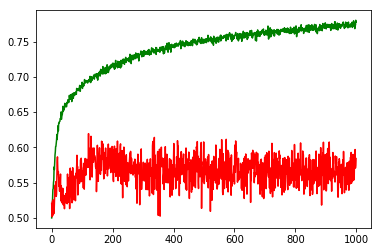

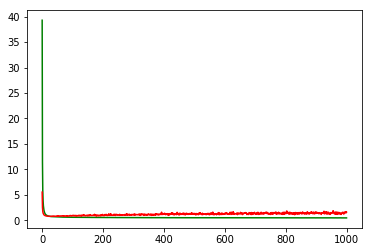

working on d,u and l,le 0.5 64 0.01 0.0001


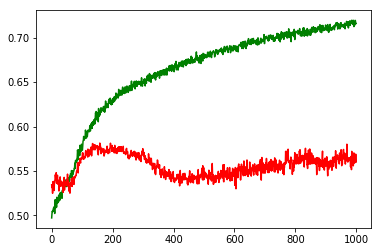

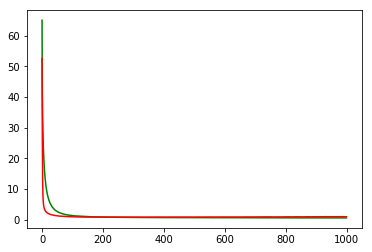

working on d,u and l,le 0.5 64 0.01 1e-05


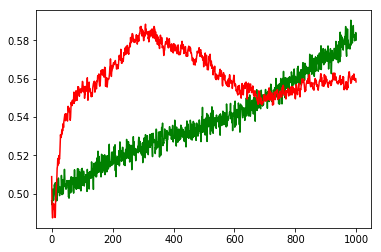

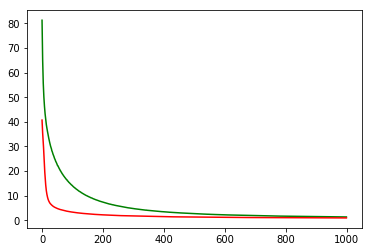

working on d,u and l,le 0.5 64 0.05 0.001


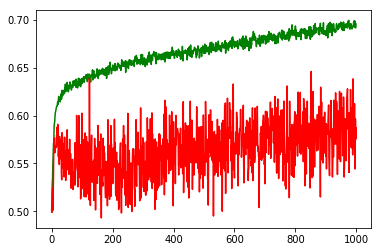

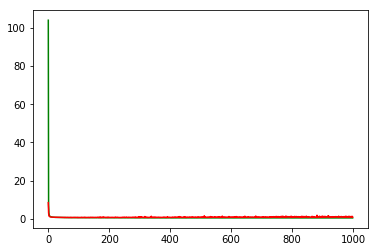

working on d,u and l,le 0.5 64 0.05 0.0001


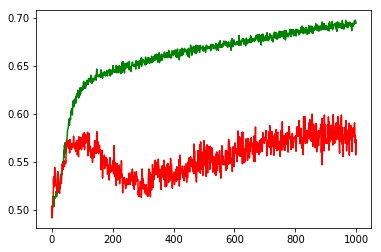

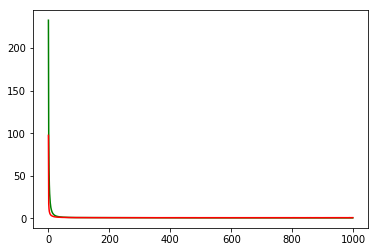

working on d,u and l,le 0.5 64 0.05 1e-05


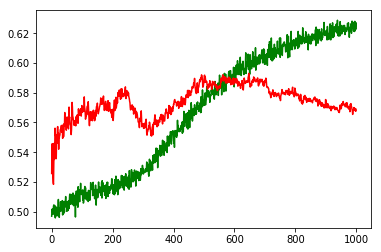

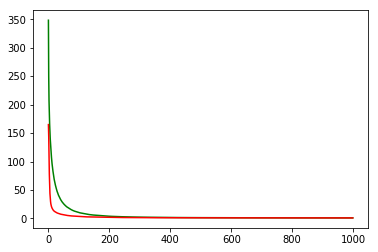

working on d,u and l,le 0.5 128 0.01 0.001


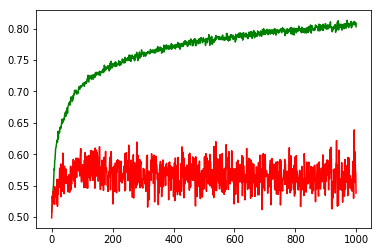

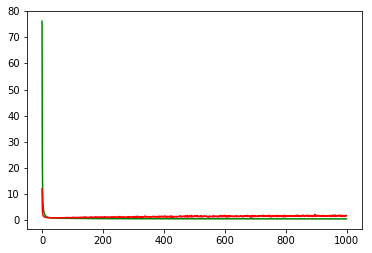

working on d,u and l,le 0.5 128 0.01 0.0001


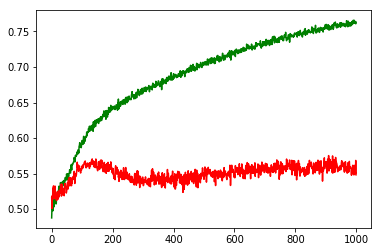

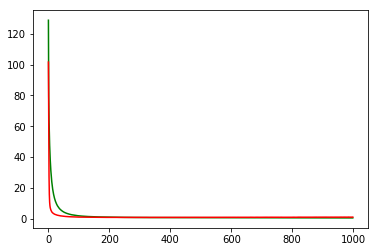

working on d,u and l,le 0.5 128 0.01 1e-05


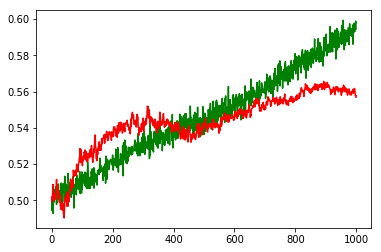

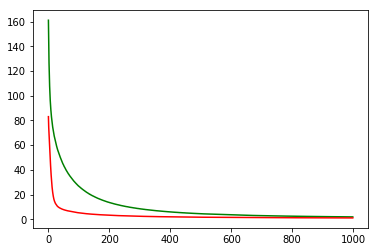

working on d,u and l,le 0.5 128 0.05 0.001


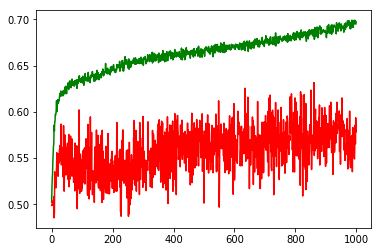

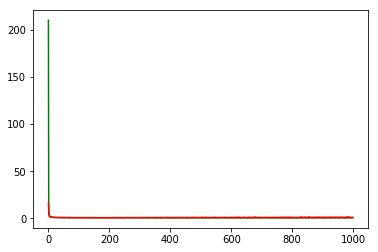

working on d,u and l,le 0.5 128 0.05 0.0001


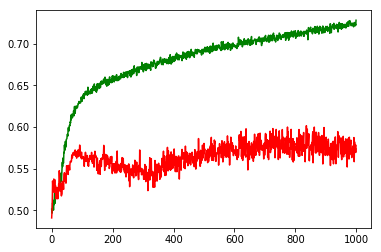

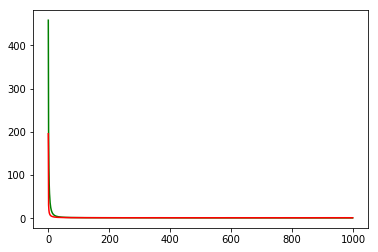

working on d,u and l,le 0.5 128 0.05 1e-05


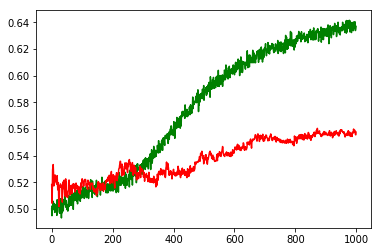

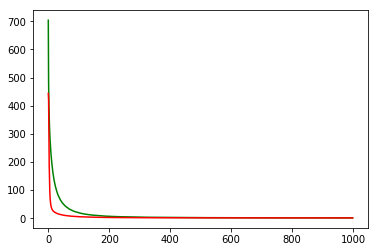

working on d,u and l,le 0.5 256 0.01 0.001


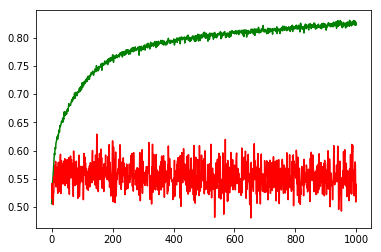

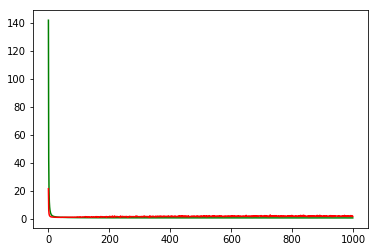

working on d,u and l,le 0.5 256 0.01 0.0001


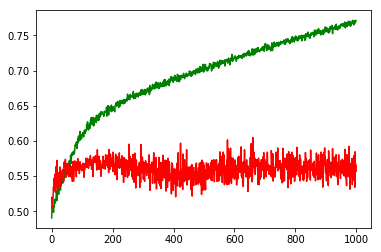

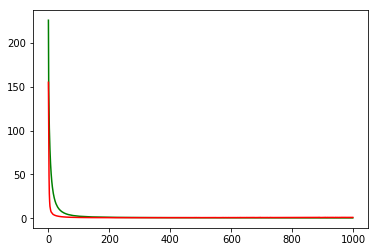

working on d,u and l,le 0.5 256 0.01 1e-05


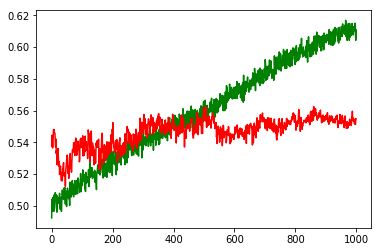

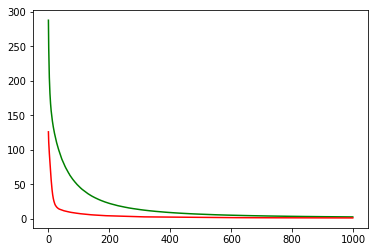

working on d,u and l,le 0.5 256 0.05 0.001


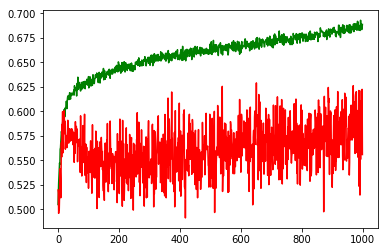

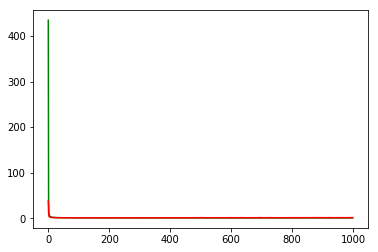

working on d,u and l,le 0.5 256 0.05 0.0001


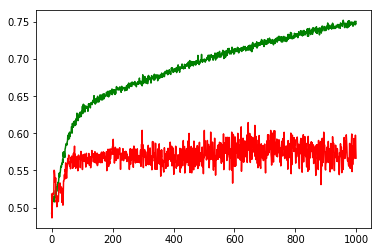

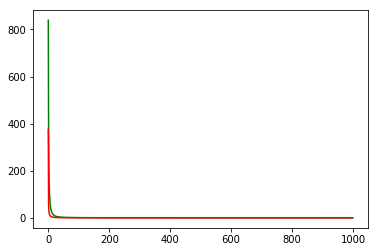

working on d,u and l,le 0.5 256 0.05 1e-05


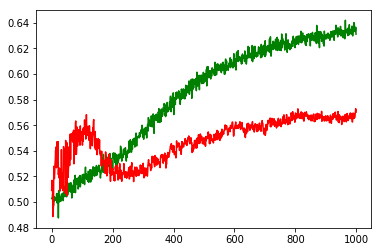

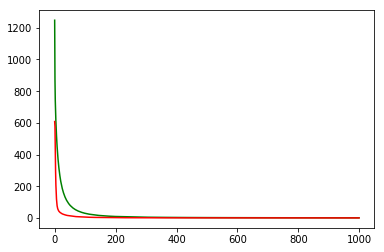

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: AVGO


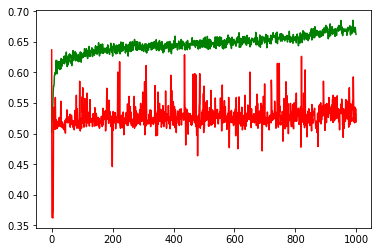

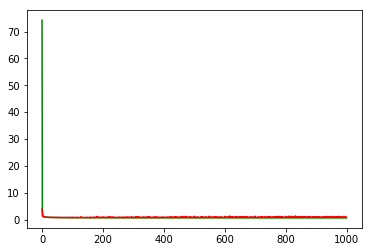

F1,score 0.6551952349437459
G-score: 0.4401929176072954
Accuracy 0.5397526497554442
Window: 140
[[116 295]
 [226 495]]
Vol pos 3.8592242471854035
Vol neg 2.3050099485966435
Real Percentage of gain: 80.98481134728978
Percentage of gain: 1.0221517948864225
Total gain: 1157.0758318114304
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 50 156]
 [147 127]]
480/480 [==============================] - 0s 23us/step
[1.1463399996360144, 0.36875]
Percentile:  1
[[ 28  97]
 [ 27 123]]
275/275 [==============================] - 0s 35us/step
[0.96679819280451, 0.5490909090909091]
Percentile:  2
[[  5  20]
 [ 48 174]]
247/247 [==============================] - 0s 32us/step
[0.4162782855362062, 0.7246963562753036]
Percentile:  3
[[ 9  8]
 [ 4 59]]
80/80 [==============================] - 0s 40us/step
[0.2961400210857391, 0.85]
Percentile:  4
[[23 14]
 [ 0 11]]
48/48 [==============================] - 0s 56us/step
[0.5303801198800405, 0.7083333333333334]
00000000000000000000000000000

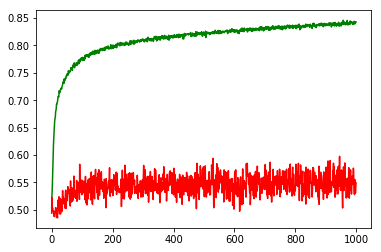

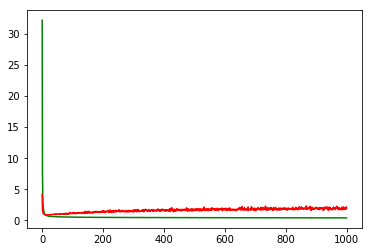

working on d,u and l,le 0.5 64 0.01 0.0001


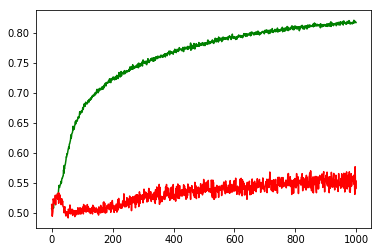

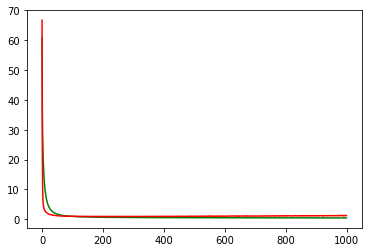

working on d,u and l,le 0.5 64 0.01 1e-05


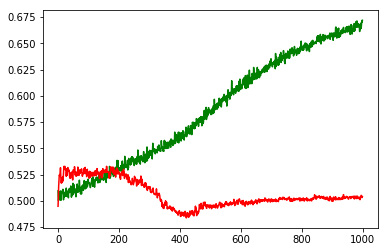

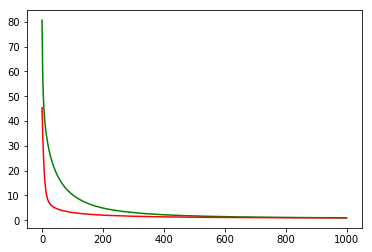

working on d,u and l,le 0.5 64 0.05 0.001


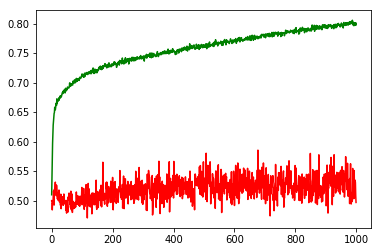

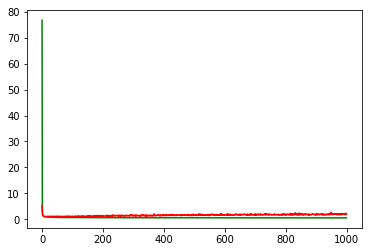

working on d,u and l,le 0.5 64 0.05 0.0001


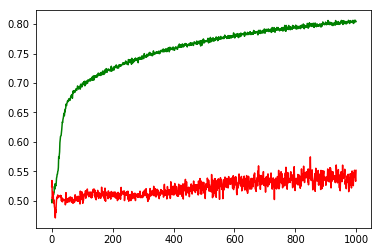

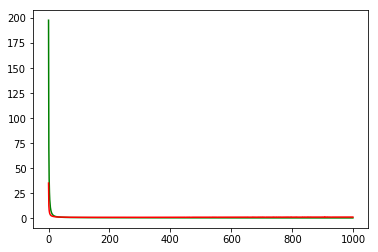

working on d,u and l,le 0.5 64 0.05 1e-05


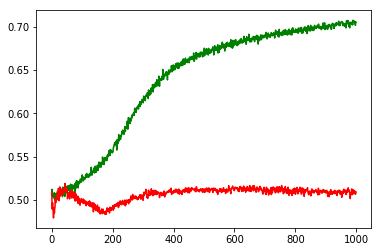

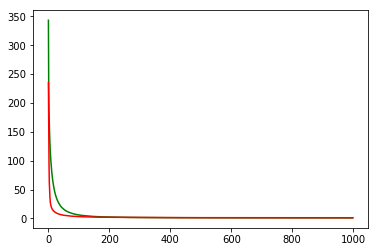

working on d,u and l,le 0.5 128 0.01 0.001


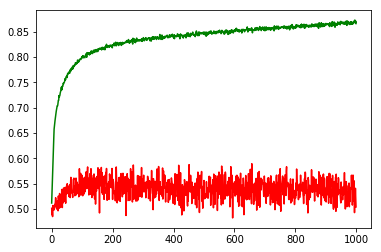

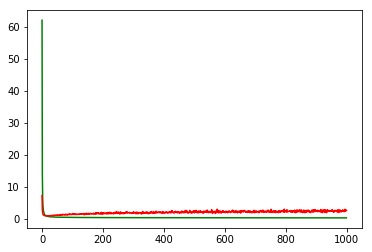

working on d,u and l,le 0.5 128 0.01 0.0001


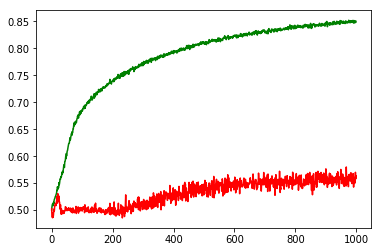

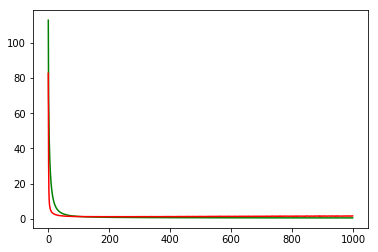

working on d,u and l,le 0.5 128 0.01 1e-05


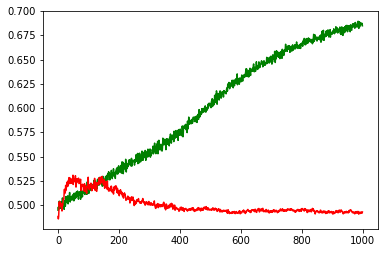

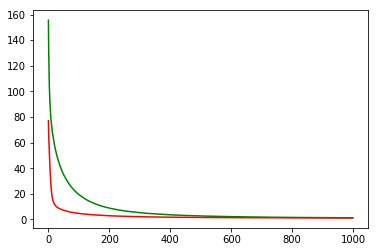

working on d,u and l,le 0.5 128 0.05 0.001


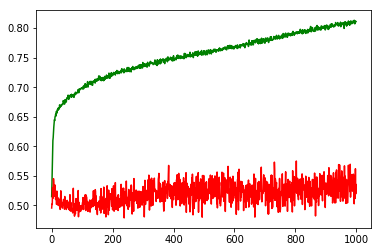

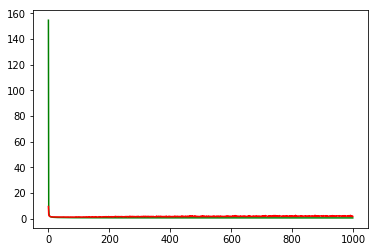

working on d,u and l,le 0.5 128 0.05 0.0001


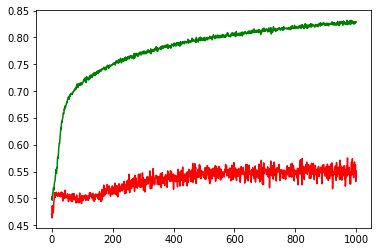

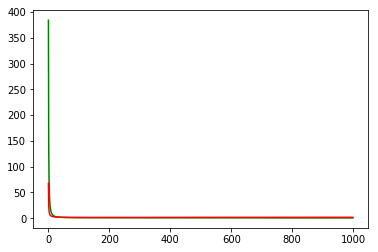

working on d,u and l,le 0.5 128 0.05 1e-05


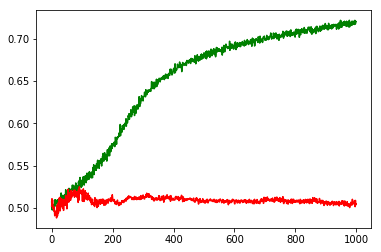

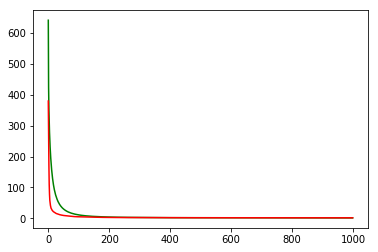

working on d,u and l,le 0.5 256 0.01 0.001


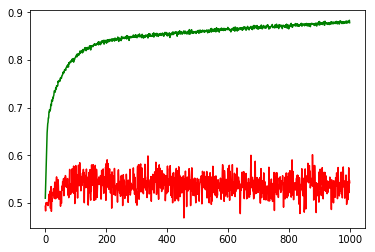

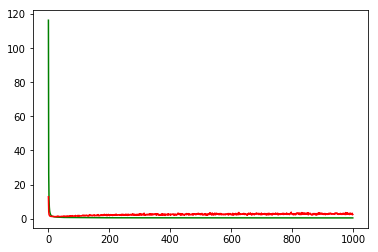

working on d,u and l,le 0.5 256 0.01 0.0001


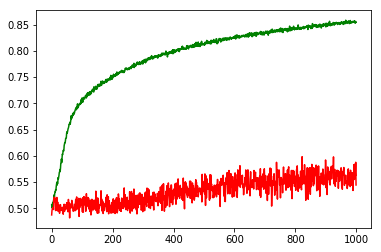

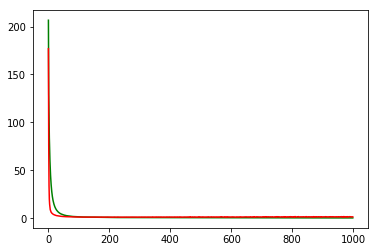

working on d,u and l,le 0.5 256 0.01 1e-05


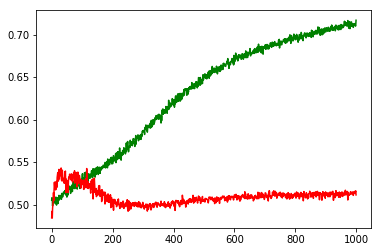

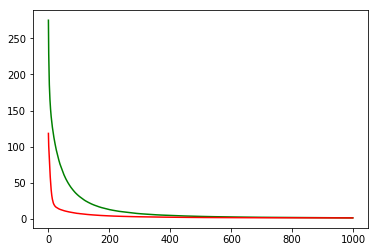

working on d,u and l,le 0.5 256 0.05 0.001


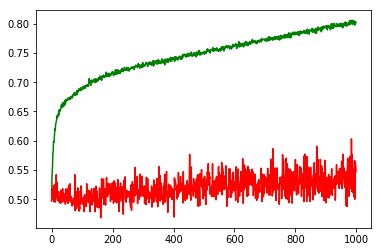

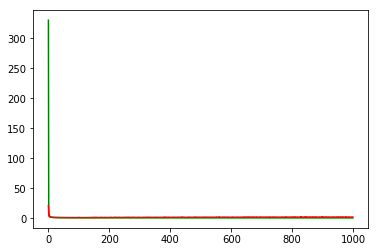

working on d,u and l,le 0.5 256 0.05 0.0001


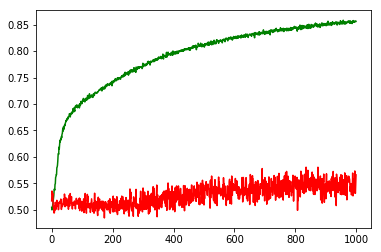

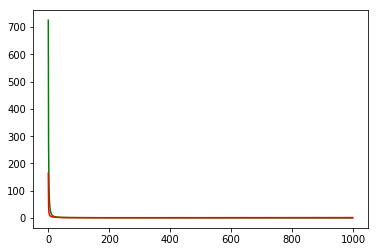

working on d,u and l,le 0.5 256 0.05 1e-05


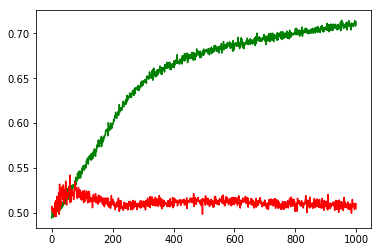

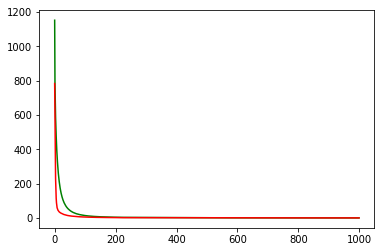

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: PYPL


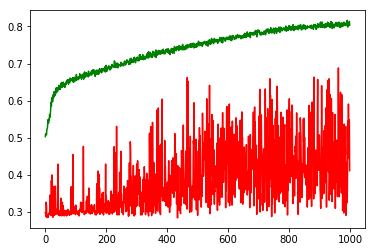

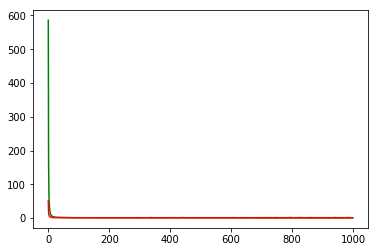

F1,score 0.4853168469860897
G-score: 0.4281773349380928
Accuracy 0.41166077759577613
Window: 140
[[152 169]
 [497 314]]
Vol pos 3.0378786042981853
Vol neg 2.805264063120835
Real Percentage of gain: -119.84095570139453
Percentage of gain: -0.3998714102787295
Total gain: -452.6544364355218
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 53  84]
 [285 160]]
582/582 [==============================] - 0s 34us/step
[1.2932518503510255, 0.3659793814945057]
Percentile:  1
[[ 37  14]
 [152 105]]
308/308 [==============================] - 0s 30us/step
[0.8153126781637018, 0.4610389618130473]
Percentile:  2
[[58 62]
 [33 31]]
184/184 [==============================] - 0s 43us/step
[0.9116141640621683, 0.4836956515260365]
Percentile:  3
[[ 4  9]
 [16 14]]
43/43 [==============================] - 0s 101us/step
[1.0595992200596387, 0.4186046497766362]
Percentile:  4
[[ 0  0]
 [10  2]]
12/12 [==============================] - 0s 80us/step
[1.4273854494094849, 0.1666666716337204]
00

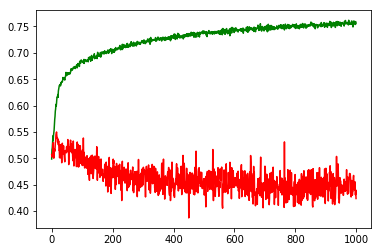

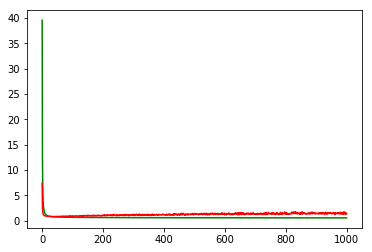

working on d,u and l,le 0.5 64 0.01 0.0001


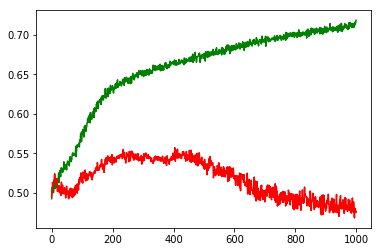

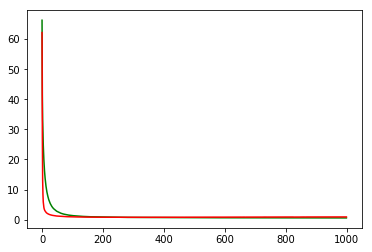

working on d,u and l,le 0.5 64 0.01 1e-05


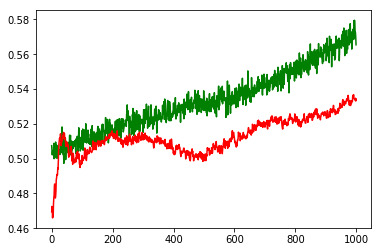

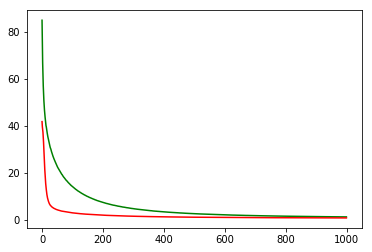

working on d,u and l,le 0.5 64 0.05 0.001


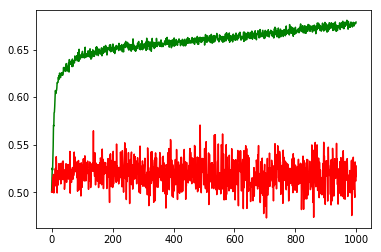

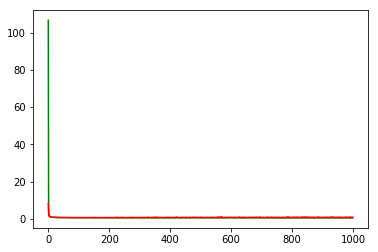

working on d,u and l,le 0.5 64 0.05 0.0001


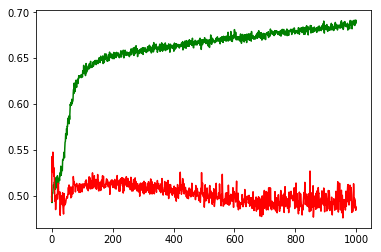

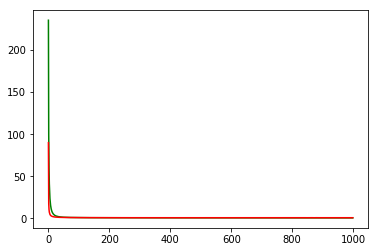

working on d,u and l,le 0.5 64 0.05 1e-05


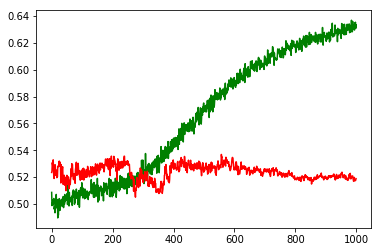

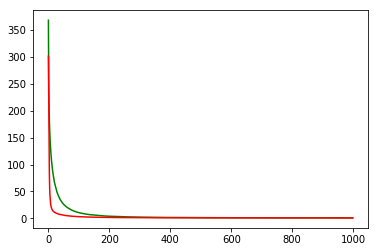

working on d,u and l,le 0.5 128 0.01 0.001


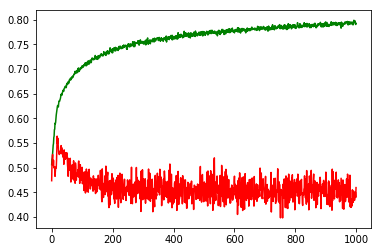

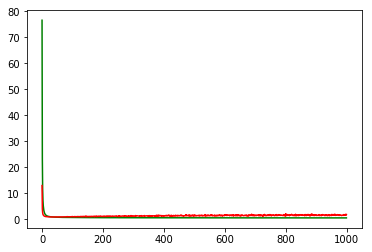

working on d,u and l,le 0.5 128 0.01 0.0001


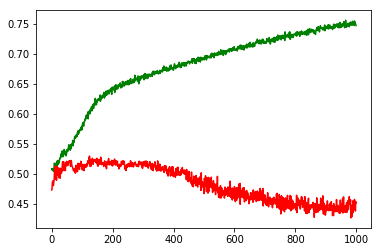

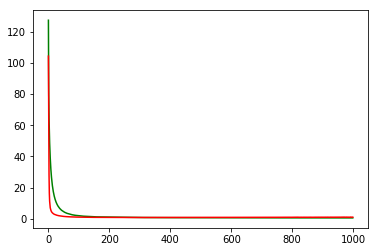

working on d,u and l,le 0.5 128 0.01 1e-05


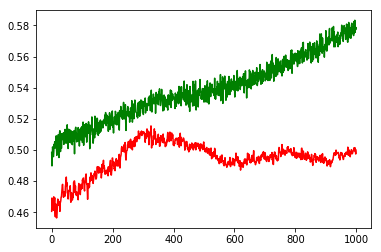

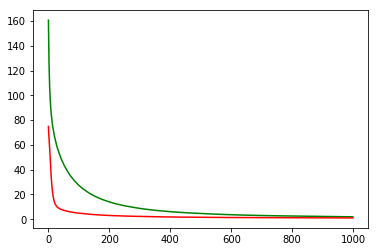

working on d,u and l,le 0.5 128 0.05 0.001


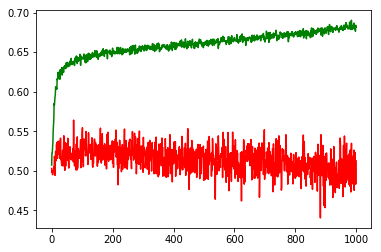

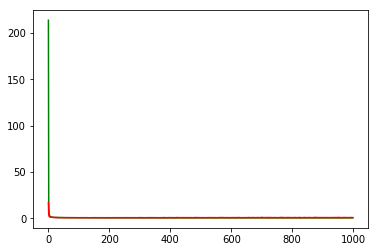

working on d,u and l,le 0.5 128 0.05 0.0001


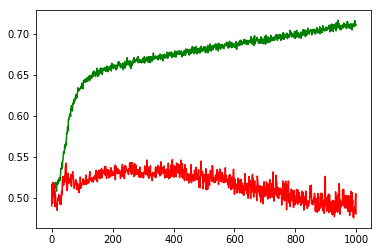

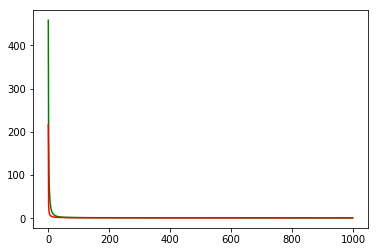

working on d,u and l,le 0.5 128 0.05 1e-05


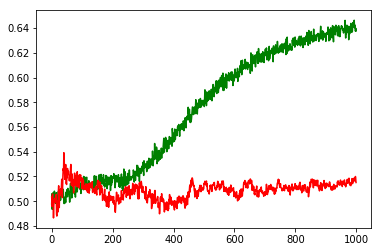

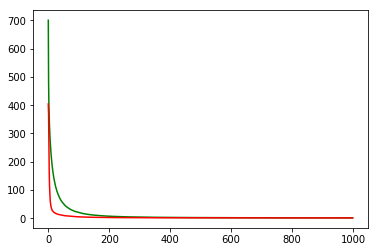

working on d,u and l,le 0.5 256 0.01 0.001


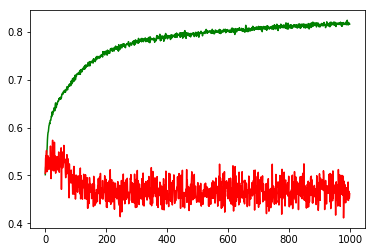

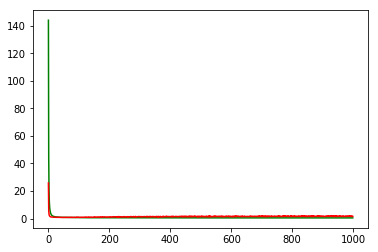

working on d,u and l,le 0.5 256 0.01 0.0001


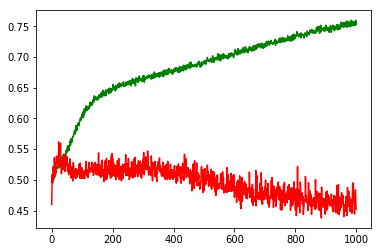

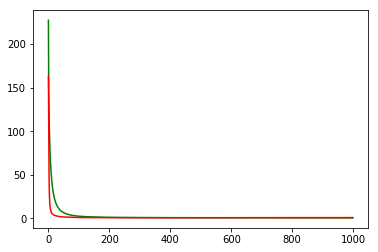

working on d,u and l,le 0.5 256 0.01 1e-05


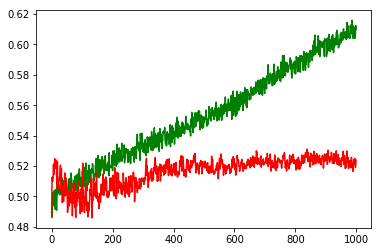

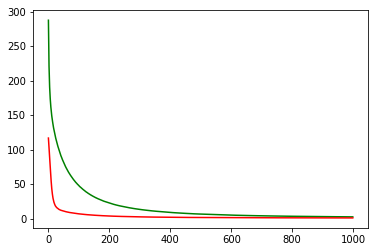

working on d,u and l,le 0.5 256 0.05 0.001


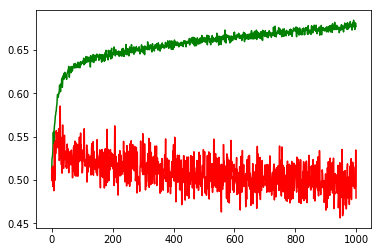

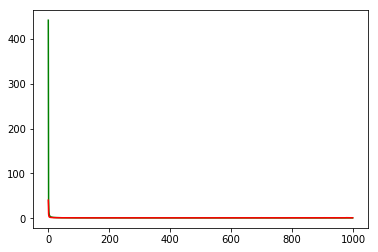

working on d,u and l,le 0.5 256 0.05 0.0001


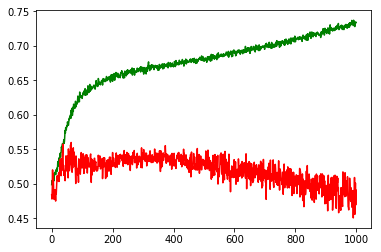

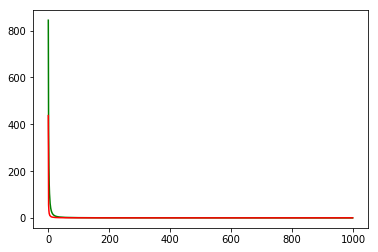

working on d,u and l,le 0.5 256 0.05 1e-05


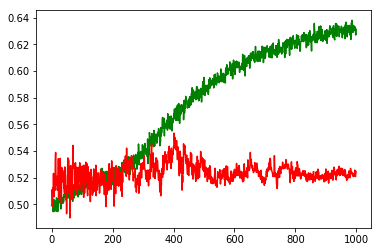

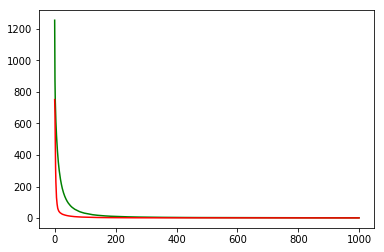

maxd,maxu,maxl,maxle: 0.5 128 0.05 0.001
Chart for BEST MODEL FOR: GILD


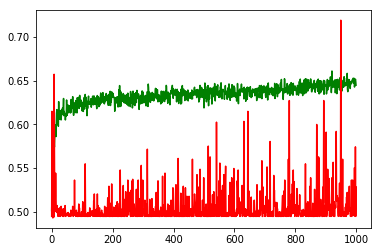

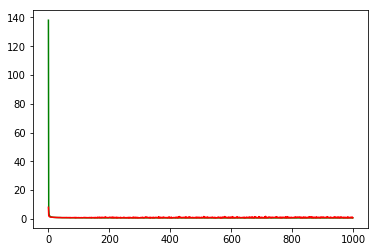

F1,score 0.6747868453105969
G-score: 0.2758602927187983
Accuracy 0.5282685519212548
Window: 140
[[ 44 528]
 [  6 554]]
Vol pos 2.771869643054299
Vol neg 3.7253464270152463
Real Percentage of gain: -168.13849281573633
Percentage of gain: -0.293071506607483
Total gain: -331.7569454796708
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 13 316]
 [  6 277]]
612/612 [==============================] - 0s 27us/step
[0.9132313954284768, 0.4738562091503268]
Percentile:  1
[[ 25  78]
 [  0 204]]
307/307 [==============================] - 0s 28us/step
[0.4333864751390215, 0.745928338762215]
Percentile:  2
[[ 1 11]
 [ 0 70]]
82/82 [==============================] - 0s 65us/step
[0.32361178717962125, 0.8658536585365854]
Percentile:  3
[[ 0 41]
 [ 0  0]]
41/41 [==============================] - 0s 77us/step
[0.8221737756961729, 0.0]
Percentile:  4
[[ 5 81]
 [ 0  0]]
86/86 [==============================] - 0s 37us/step
[0.8772910445235497, 0.05813953488372093]
000000000000000000000

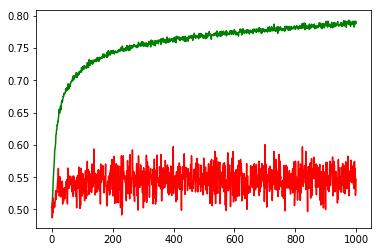

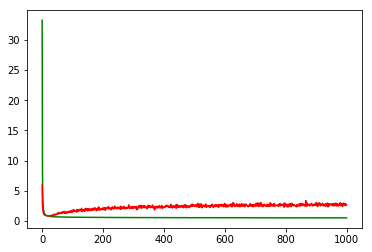

working on d,u and l,le 0.5 64 0.01 0.0001


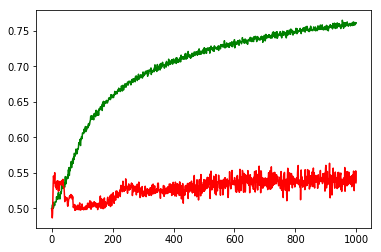

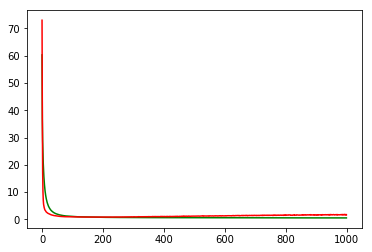

working on d,u and l,le 0.5 64 0.01 1e-05


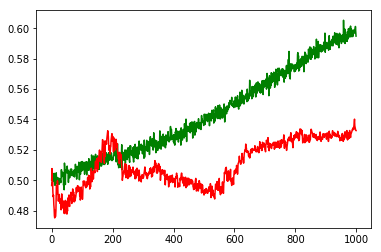

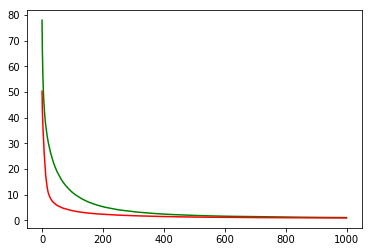

working on d,u and l,le 0.5 64 0.05 0.001


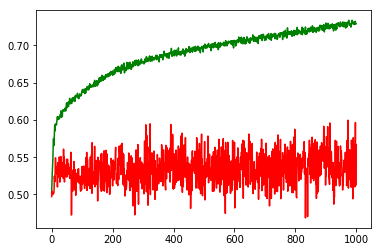

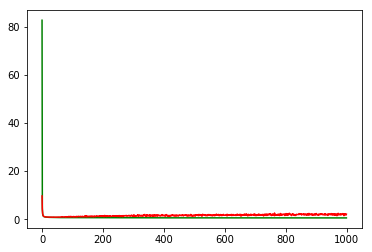

working on d,u and l,le 0.5 64 0.05 0.0001


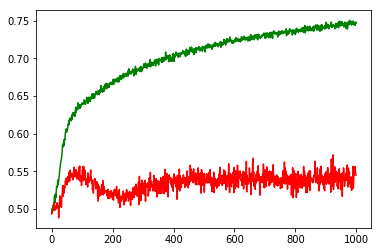

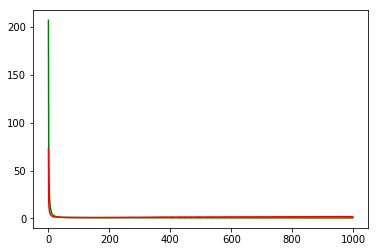

working on d,u and l,le 0.5 64 0.05 1e-05


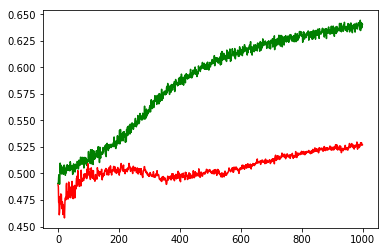

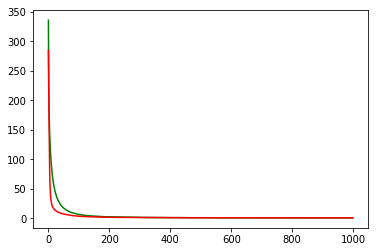

working on d,u and l,le 0.5 128 0.01 0.001


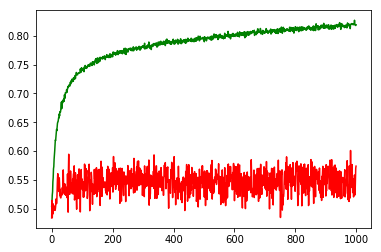

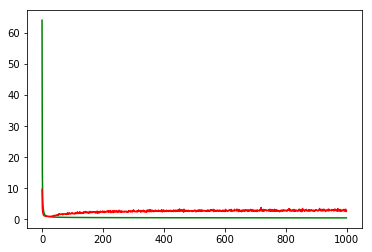

working on d,u and l,le 0.5 128 0.01 0.0001


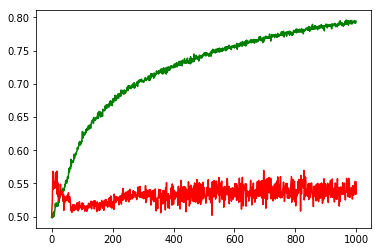

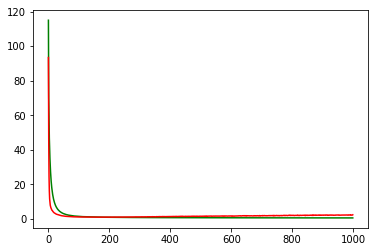

working on d,u and l,le 0.5 128 0.01 1e-05


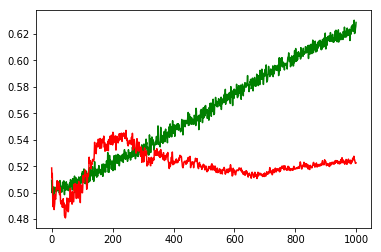

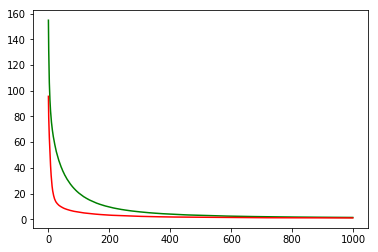

working on d,u and l,le 0.5 128 0.05 0.001


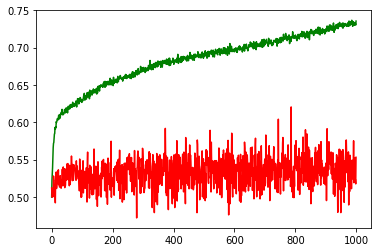

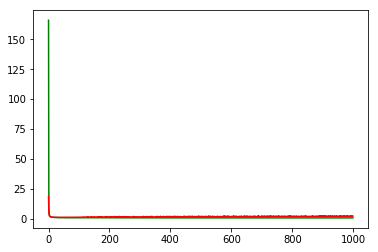

working on d,u and l,le 0.5 128 0.05 0.0001


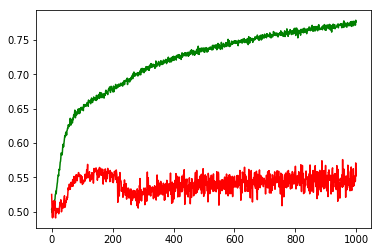

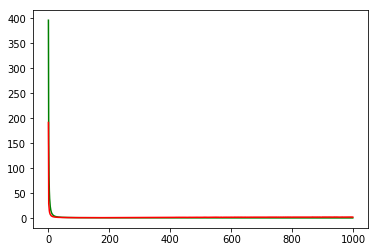

working on d,u and l,le 0.5 128 0.05 1e-05


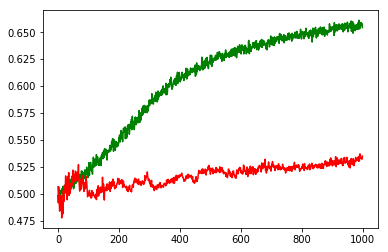

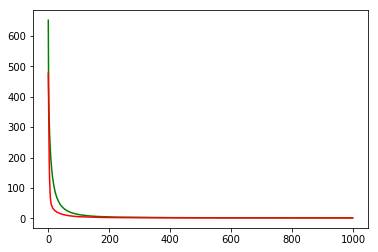

working on d,u and l,le 0.5 256 0.01 0.001


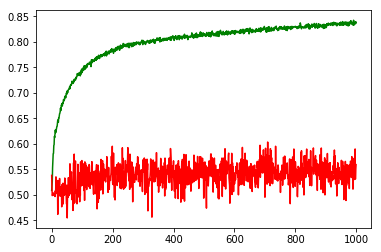

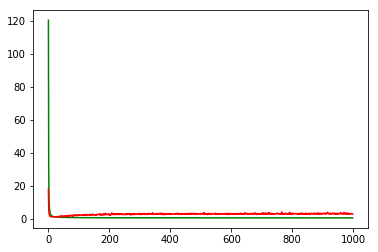

working on d,u and l,le 0.5 256 0.01 0.0001


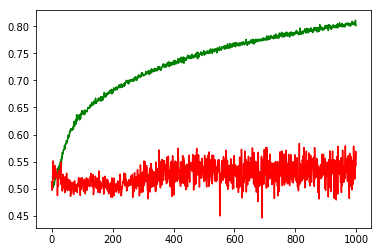

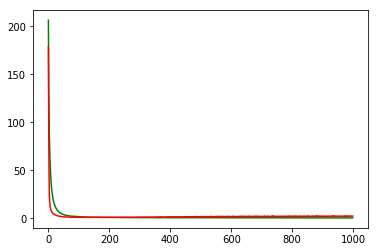

working on d,u and l,le 0.5 256 0.01 1e-05


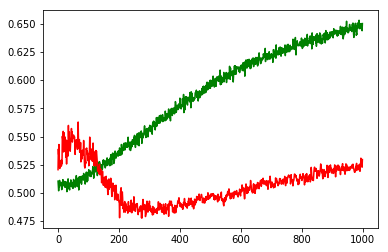

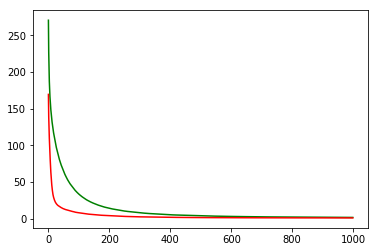

working on d,u and l,le 0.5 256 0.05 0.001


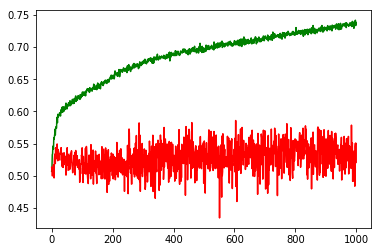

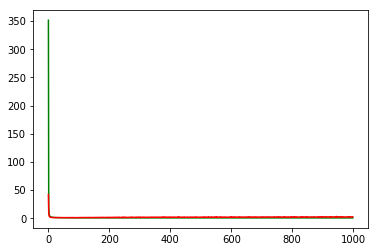

working on d,u and l,le 0.5 256 0.05 0.0001


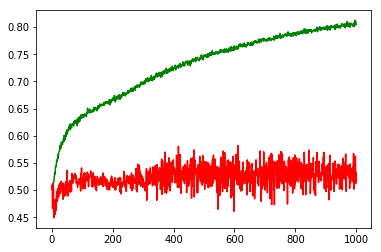

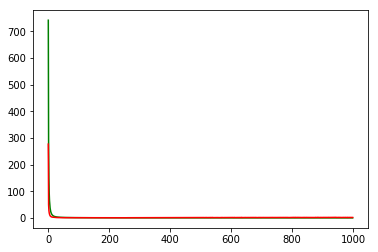

working on d,u and l,le 0.5 256 0.05 1e-05


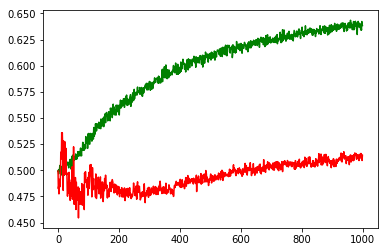

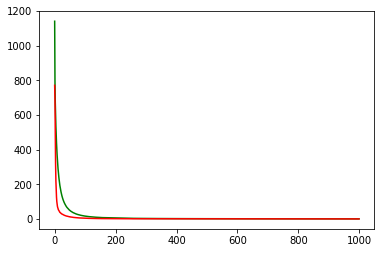

maxd,maxu,maxl,maxle: 0.5 256 0.01 0.001
Chart for BEST MODEL FOR: COST


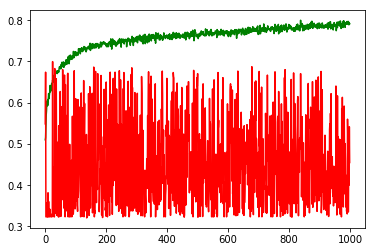

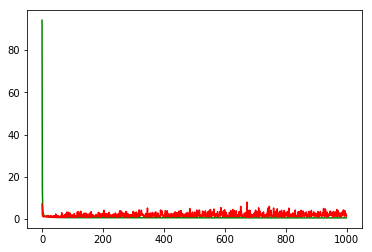

F1,score 0.4095693779904306
G-score: 0.4793306575504931
Accuracy 0.454946996255814
Window: 140
[[301  65]
 [552 214]]
Vol pos 1.3500094950020194
Vol neg 1.484381304817035
Real Percentage of gain: -54.131898602154706
Percentage of gain: -0.1948837236272708
Total gain: -220.60837514607056
000000000000000000000000000000000000000000000000
Percentile:  0
[[134  54]
 [122  63]]
373/373 [==============================] - 0s 34us/step
[1.2701718557935617, 0.5281501350070452]
Percentile:  1
[[ 86  11]
 [152  54]]
303/303 [==============================] - 0s 115us/step
[1.2623069294215035, 0.46204620530896456]
Percentile:  2
[[ 68   0]
 [186  39]]
293/293 [==============================] - 0s 39us/step
[1.8571486318477592, 0.3651877133105802]
Percentile:  3
[[12  0]
 [70 16]]
98/98 [==============================] - 0s 46us/step
[2.502604698648258, 0.2857142857142857]
Percentile:  4
[[ 0  0]
 [22 41]]
63/63 [==============================] - 0s 62us/step
[1.04967928665971, 0.6507936507936508]
0

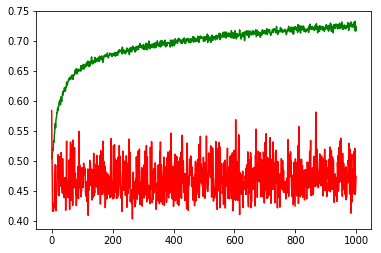

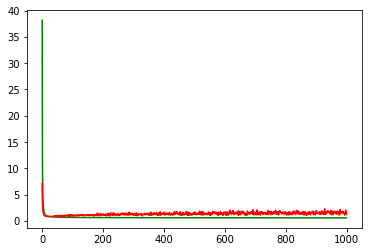

working on d,u and l,le 0.5 64 0.01 0.0001


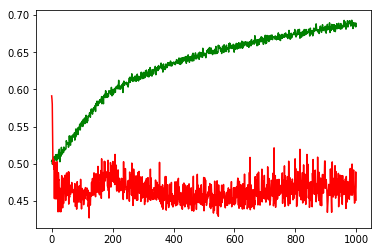

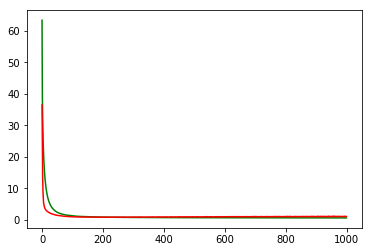

working on d,u and l,le 0.5 64 0.01 1e-05


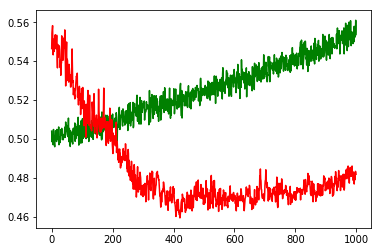

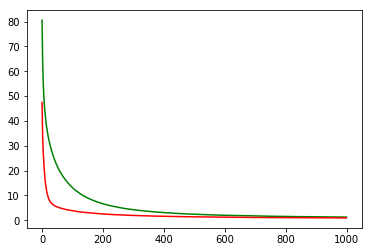

working on d,u and l,le 0.5 64 0.05 0.001


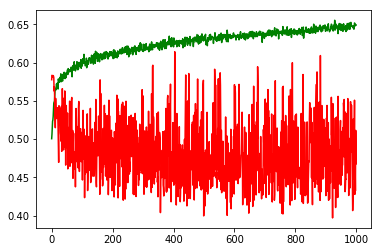

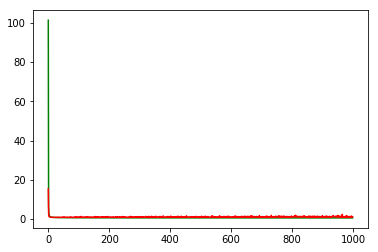

working on d,u and l,le 0.5 64 0.05 0.0001


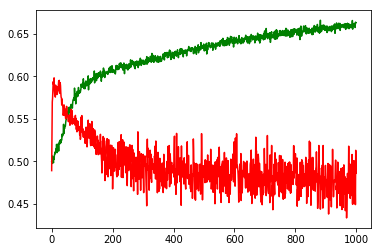

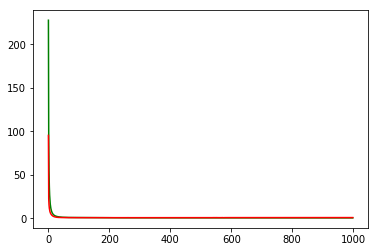

working on d,u and l,le 0.5 64 0.05 1e-05


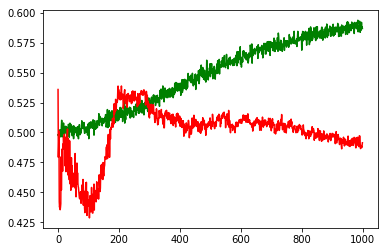

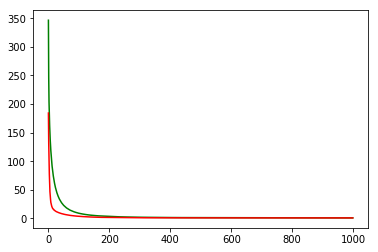

working on d,u and l,le 0.5 128 0.01 0.001


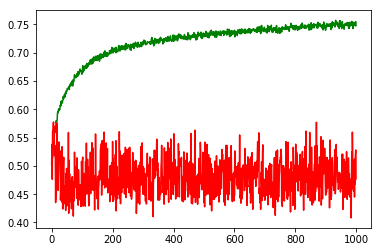

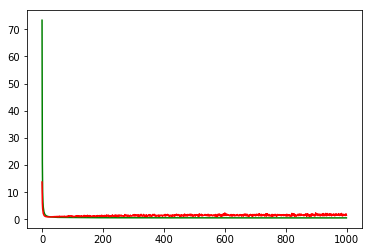

working on d,u and l,le 0.5 128 0.01 0.0001


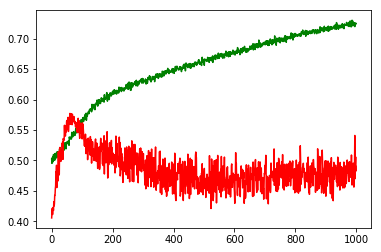

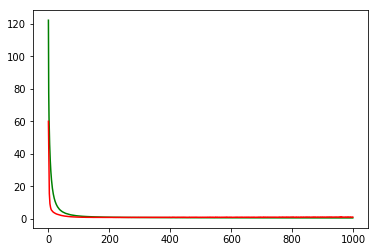

working on d,u and l,le 0.5 128 0.01 1e-05


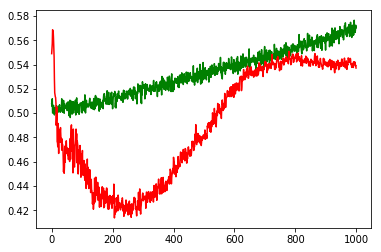

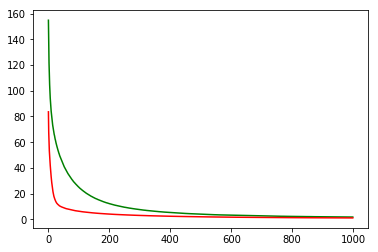

working on d,u and l,le 0.5 128 0.05 0.001


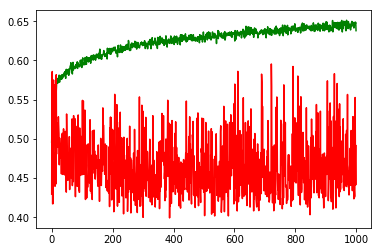

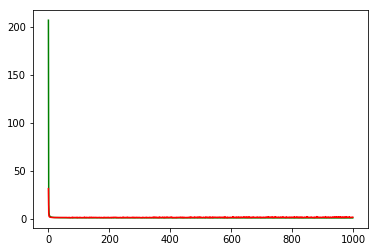

working on d,u and l,le 0.5 128 0.05 0.0001


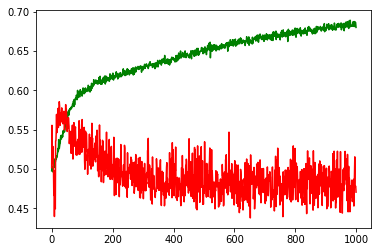

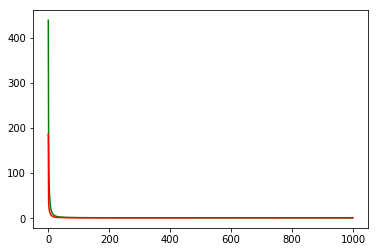

working on d,u and l,le 0.5 128 0.05 1e-05


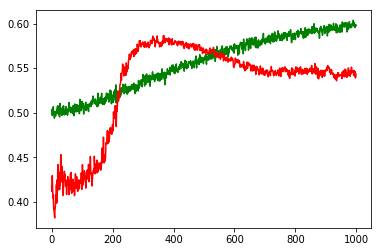

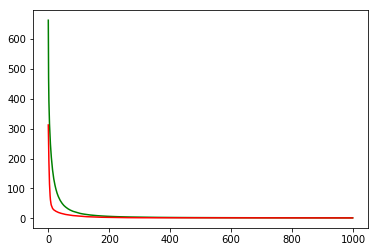

working on d,u and l,le 0.5 256 0.01 0.001


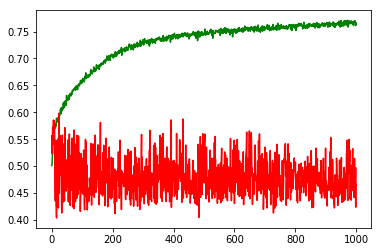

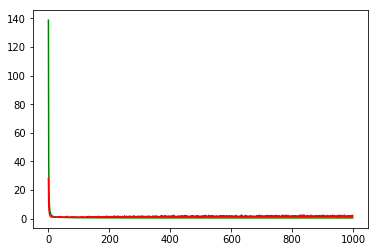

working on d,u and l,le 0.5 256 0.01 0.0001


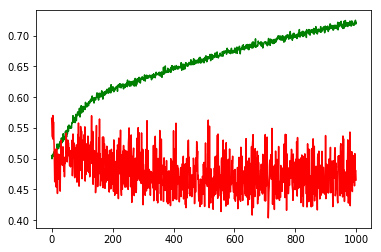

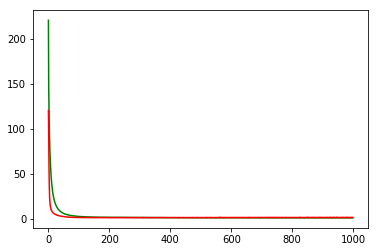

working on d,u and l,le 0.5 256 0.01 1e-05


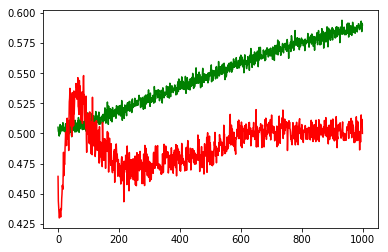

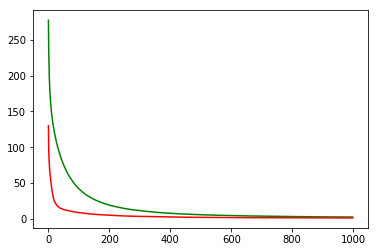

working on d,u and l,le 0.5 256 0.05 0.001


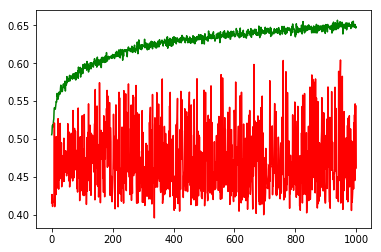

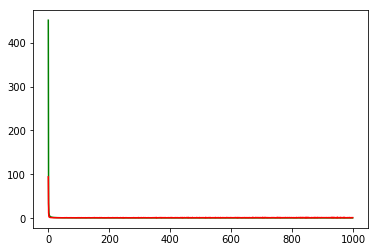

working on d,u and l,le 0.5 256 0.05 0.0001


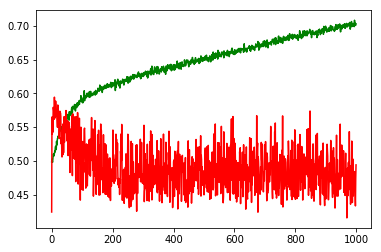

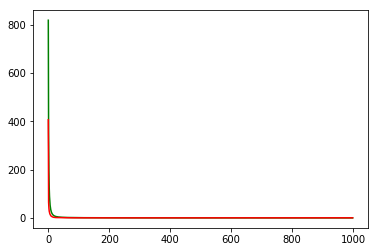

working on d,u and l,le 0.5 256 0.05 1e-05


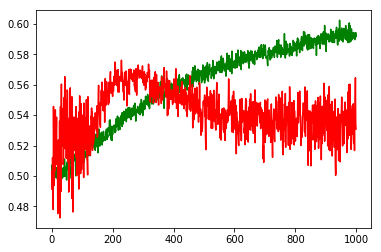

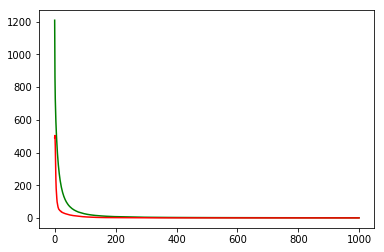

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: QCOM


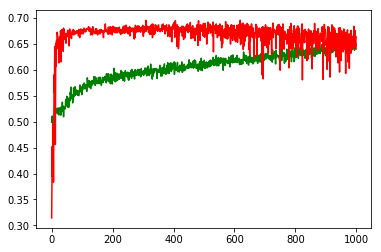

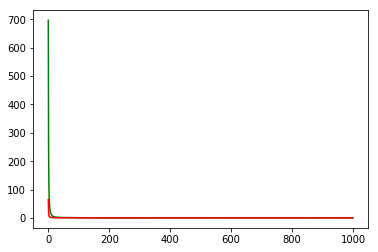

F1,score 0.7585798816568047
G-score: 0.4388460577338131
Accuracy 0.6395759714681774
Window: 140
[[ 83 273]
 [135 641]]
Vol pos 3.2021640516143512
Vol neg 3.580132711516265
Real Percentage of gain: 79.15102286401932
Percentage of gain: 0.7576613313340586
Total gain: 857.6726270701542
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 75 158]
 [ 62 237]]
532/532 [==============================] - 0s 24us/step
[0.6643715375348141, 0.5864661654415435]
Percentile:  1
[[  8  40]
 [ 34 262]]
344/344 [==============================] - 0s 32us/step
[0.6115010824314383, 0.7848837209302325]
Percentile:  2
[[ 0 17]
 [14 76]]
107/107 [==============================] - 0s 33us/step
[0.7818837767449495, 0.7102803738317757]
Percentile:  3
[[ 0 11]
 [25 43]]
79/79 [==============================] - 0s 40us/step
[0.8195565542842769, 0.5443037982228436]
Percentile:  4
[[ 0 46]
 [ 0 22]]
68/68 [==============================] - 0s 37us/step
[0.6418600170051351, 0.3235294117647059]
00000000

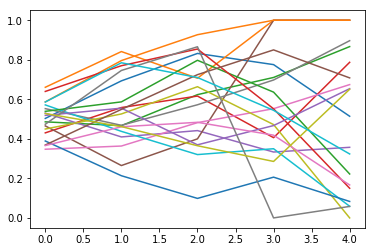

Ecco la matrice generale:
[[4143. 3362.]
 [6912. 7020.]]
Ecco le matrici per percentile
Percentile : 0
[[2337. 1945.]
 [2844. 2501.]]
Percentile : 1
[[ 938.  713.]
 [2223. 2400.]]
Percentile : 2
[[ 522.  301.]
 [1153. 1329.]]
Percentile : 3
[[221. 219.]
 [501. 535.]]
Percentile : 4
[[119. 179.]
 [177. 237.]]


In [4]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
totalconfusion=np.zeros((2,2))
confusionlist=[]
for con in range(0,5):
    confusionlist.append(np.zeros((2,2)))
predictionscsv = pd.DataFrame()
for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
   
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(xtemp[i])
        
        y=np.array(y)
        x=np.array(x)
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
    


            
        lspace=[0.01,0.05]
        dropspace=[0.5]
        uspace=[64,128,256]
        learnspace=[0.001,0.0001,0.00001]
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
                #print()
                for l in lspace:
                    for le in learnspace:
                    
                   
                        print('=========================================================')
                        print('working on d,u and l,le',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        
                        for i in range(0,6):
                            model=buildModel(l,u,d,le)
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 1000,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)
                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0



                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                           
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            model=None
                            history=None
                            
                            del model
                            del history
                            gc.collect()
                            tf.reset_default_graph() 
                            K.clear_session()

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d


                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()

                        print('=========================================================')
        model=buildModel(maxl,maxu,maxd,maxle)
        x_tv,y_tv=smote(x_tv,y_tv)
        history=model.fit(x_tv, y_tv, epochs =1000,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        predictionscsv = pd.DataFrame(data=prediction,columns=[files[o-1]])
        tempdate=np.array(dates[o-1])
        predictionscsv.index = tempdate[testindex]
        predictionscsv.to_csv('/home/andrea/Desktop/NLFF/technicalAnalysis/NN/Predictions/Newsetting/newwithadam/price/'+files[o-1]+'.csv')
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('maxd,maxu,maxl,maxle:',maxd,maxu,maxl,maxle)
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction,labels=[0,1])
        totalconfusion=totalconfusion+confmatrix
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                    else:
                        predictionp[el]=0
                        #labels added later
                tempmatrix=confusion_matrix(y_test[distribution[g]], predictionp,labels=[0,1])
                confusionlist[g]=confusionlist[g]+tempmatrix
                print(tempmatrix)
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
print('Ecco la matrice generale:')
print(totalconfusion)
print('Ecco le matrici per percentile')
for i in range(0,len(confusionlist)):
    print('Percentile :',i)
    print(confusionlist[i])        

            

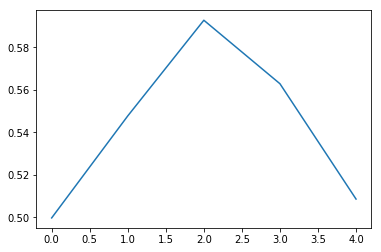

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()